In [1]:
from __future__ import print_function, division
%matplotlib inline

try:
    reload  # Python 2.7
except NameError:
    try:
        from importlib import reload  # Python 3.4+
    except ImportError:
        from imp import reload  # Python 3.0 - 3.3

In [2]:
import numpy as np
import modisco
import sys
import os

In [3]:
sys.path.append('Neural_Network_DNA_Demo/')
from helper import IOHelper, SequenceHelper # from https://github.com/bernardo-de-almeida/Neural_Network_DNA_Demo.git

### load fasta sequences functions
def one_hot_encode_along_channel_axis(sequence):
    to_return = np.zeros((len(sequence),4), dtype=np.int8)
    seq_to_one_hot_fill_in_array(zeros_array=to_return,
                                 sequence=sequence, one_hot_axis=1)
    return to_return

def seq_to_one_hot_fill_in_array(zeros_array, sequence, one_hot_axis):
    assert one_hot_axis==0 or one_hot_axis==1
    if (one_hot_axis==0):
        assert zeros_array.shape[1] == len(sequence)
    elif (one_hot_axis==1):
        assert zeros_array.shape[0] == len(sequence)
    #will mutate zeros_array
    for (i,char) in enumerate(sequence):
        if (char=="A" or char=="a"):
            char_idx = 0
        elif (char=="C" or char=="c"):
            char_idx = 1
        elif (char=="G" or char=="g"):
            char_idx = 2
        elif (char=="T" or char=="t"):
            char_idx = 3
        elif (char=="N" or char=="n"):
            continue #leave that pos as all 0's
        else:
            raise RuntimeError("Unsupported character: "+str(char))
        if (one_hot_axis==0):
            zeros_array[char_idx,i] = 1
        elif (one_hot_axis==1):
            zeros_array[i,char_idx] = 1


def prepare_input(file_seq):
    # Convert sequences to one-hot encoding matrix
    input_fasta_data_A = IOHelper.get_fastas_from_file(file_seq, uppercase=True)

    # get length of first sequence
    sequence_length = len(input_fasta_data_A.sequence.iloc[0])

    # Convert sequence to one hot encoding matrix
    seq_matrix_A = SequenceHelper.do_one_hot_encoding(input_fasta_data_A.sequence, sequence_length,
      SequenceHelper.parse_alpha_to_seq)
    print(seq_matrix_A.shape)

    X = np.nan_to_num(seq_matrix_A) # Replace NaN with zero and infinity with large finite numbers
    X_reshaped = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

    print(file_seq)

    return X_reshaped

## Import Fasta Sequence

```
fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fname = "sequence.npy"
fpath = os.path.join(fdiry, fname)
fasta_sequences = np.load(fpath, allow_pickle=True)

print(len(fasta_sequences))
print(fasta_sequences[0])
1000
TCCGTTCTCCCCGTCACTTTCAGGTACACCAATCAGATACAGATTTGGTCTTTTCACATAGTCCCATATTTCTTGGAGGCTTTGTTCATTTCTTTTTATTCATTTTTCTCTAAACTTCCCTTCTCGCTTCATTTCATTCATTTCATCTTCCATCACTGATACCCTTTCTTCCAGTTGATCGCATCGGCTCCTGAGGCTTCTGCATTCTTCATGTAGTTCTCGAGCCTTGGCTTTCAGCTCCATCAGCTCCTTTAAGCACTTCTCTGTATTGGTTATTCTAGTTATACATTCGTCTAAATTTTTTTTAAAGTTTGTAACTTCTTTGCCTTGGGTTTGAATTTTCTCCTGTAGCTCGGAGTAGTTTGATCGTCTGAAGCCTTCTTCTCTCAACTCGTCAAAGTCATTCTCCATCCAGCTTTGTTCCGTTGCTGGTGAGGAACTGCATTCCTTTGGAGGAGGAGAGGCACTCTGCTTTTTAGAGTTTCCAGTTTTTCTGCTCTGTTTTTTCCCCATCTTTGTGGTTTTATCTACTTTTGGTCTTTGATGATGGTGATGTACAGATGGGTTTTTGGTGTGGATGTCCTTCCTGTTTGTTAGTTTTCCTTCTAACAGACAGGACCCTCAGCTGCAGGTCTGTTGGAGTTTGCTAGAGGTCCACTCCAGACCCTGTTTGCCTGGGTATCAGCAGCGGTGGCTGCAGAACAGCGGATTTTCGCGAACCACAAATGCTGCTGTCTGATCATTCCTCTGGAAGTTTTGTCTCAGAGGAGTACTGGGCCGTGTGAGGTGTCAGTCTGCCCCTACTCGGGGGTGCCTCCCAGTTAGGCTGCTTGGGGGTCAGGGGTCAGGGACCCACTTGAGGAGGCAGTCTGCCCGTTCTCAGATCTCCAGCTGCATGCTGGAAGAACCACTGCTCTCTTCAAAGCTGTCAGACAGGGACATTTAAGTCTGCAGACGTTACTGCTGTCTTTTTGTTTGTCTGTGCCCTGCCCCCAGGGGT
```

In [4]:
fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_data"
fname = "whole_genome_Seq_sub.npy"
fpath = os.path.join(fdiry, fname)
fasta_sequences = np.load(fpath, allow_pickle=True)

print(len(fasta_sequences))
print(fasta_sequences[0])

10000
TGATCTCAGCTCACTGCAACCTCCACTTCCCAAGCTCAAGTTACCCTCCCACTTTAGCCTCCTAAATATCTTTATAGGCACATGCCACCACGCCTGGCTAATTTTTGTATTTTTTTGTAGAAATGGGGTTTTGCCATGTTGCCCAGGCTGGTCTTGAACTCCTGGGCTCAAGTGATCTACCCACCTTGGCCTCCCAAAATGCTGGGATTACAGATGTGCACCACTGAGCCCGGCCCCCTTCAGGAAAATCTGCCAGCCAAACCCAGCATCTCCCTGGGAAGGGGCTGCCAGGAGAAGCTCTGTCCAGTCCCCATGAATCCCTCCCTGGGCTTCGGGAGACAGGCCAGTTGGAACTTCAGCTGTGGCTATGCAACCTCACGGACCCCCGAAATGCGTCAGTCCCAGGGACCTGGTCCCATAGCCCAGGTTGCTTCTGGCCTGACCCCACTGATATGAAGTTCACATTCCACTTGGTGCCAGGCCAAAGACACCTGAGTCTTTCTTCATTGCCTGGCCACACCCCATCAGGCCCTGGACACCCATGTGCACCAGCTTCCCTCACGCCAAATGTGCCCCAACATGCCAAATCATGCAACATGACATGATGTCACTCCAGGACAGTTTATGACATGCCACAGCTGTCTGGCATGTCCAGACATGGCTGGGTAAGGGGCCTACAGAAAGGTGTCCCCAAGCTGGGGAGGCGGGAGGGGAGGCCTGGGCTTCCCCAGGGCCCTTGCAGTGGCTTCGAGCACCGCCACCTCCTCGGCCTGCTGAGCCTCCATGAGTGCCATCTGCTGCTCCAACTTCCGGCGTTGCTCTTCCTGCTTCCGGTGGGCTCCTCGGAAGGCCAGGACCAGGGCGCTGGAAGGGGTGGGTGGCTGGGTCAGGAAACAGCCCCCGAGTCCACCCAAGGCAAGGGCCGTGTACTCCCACTCCCAGAATGGGGGCTCTTTCACATTGGGTCTCCAAGGGTCCCAGCTAGCTGGTCTTT

## Import Scores

In [5]:
import h5py
from collections import OrderedDict
import numpy as np

task_to_scores = OrderedDict()
task_to_hyp_scores = OrderedDict()

#f = h5py.File("scores.h5","r")
fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
#fname = "WG_Model_DeepSTARR_Dex_contribution_scores.h5"
fname = "WG_Model_DeepSTARR_contribution_scores.h5"
fpath = os.path.join(fdiry, fname)
f = h5py.File(fpath, "r")

tasks = f["contrib_scores"].keys()
print(tasks)

<KeysViewHDF5 ['DMSO', 'Dex']>


In [6]:
x1 = f['contrib_scores']["DMSO"]
x2 = f['contrib_scores']["Dex"]
print(x1)
print(x2)
np.allclose(np.array(x1), np.array(x2))

<HDF5 dataset "DMSO": shape (10000, 1000, 4), type "<f8">
<HDF5 dataset "Dex": shape (10000, 1000, 4), type "<f8">


False

In [7]:
import h5py
from collections import OrderedDict
import numpy as np

task_to_scores = OrderedDict()
task_to_hyp_scores = OrderedDict()

#f = h5py.File("scores.h5","r")
fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
#fname = "WG_Model_DeepSTARR_Dex_contribution_scores.h5"
fname = "WG_Model_DeepSTARR_contribution_scores.h5"
fpath = os.path.join(fdiry, fname)
f = h5py.File(fpath, "r")

tasks = f["contrib_scores"].keys()
n = 1000
#n = len(fasta_sequences)
#n = 100 #len(fasta_sequences) #100 #since this is just a test run, for speed I am limiting to 100 sequences
#reverse-complement some of the sequences to simulate that
take_rc = (np.random.RandomState(1234).uniform(size=n) > 0.5)
for task in tasks:
    #Note that the sequences can be of variable lengths;
    #in this example they all have the same length (200bp) but that is
    #not necessary.
    task_to_scores[task] = [np.array(x) if not rc else np.array(x)[::-1,::-1]
                            for x,rc in zip(f['contrib_scores'][task][:n], take_rc)]
    task_to_hyp_scores[task] = [np.array(x) if not rc else np.array(x)[::-1,::-1]
                                for x,rc in zip(f['hyp_contrib_scores'][task][:n], take_rc)]

onehot_data = [one_hot_encode_along_channel_axis(seq) if not rc else
               one_hot_encode_along_channel_axis(seq)[::-1,::-1]
               for seq,rc in zip(fasta_sequences[:n], take_rc)]

In [8]:
print(len(onehot_data))
print(onehot_data[0].shape)

1000
(1000, 4)


In [9]:
for key, val in task_to_scores.items():
    print(key, type(val), len(val), type(val[0]), val[0].shape)

for key, val in task_to_hyp_scores.items():
    print(key, type(val), len(val), type(val[0]), val[0].shape)    

DMSO <class 'list'> 1000 <class 'numpy.ndarray'> (1000, 4)
Dex <class 'list'> 1000 <class 'numpy.ndarray'> (1000, 4)
DMSO <class 'list'> 1000 <class 'numpy.ndarray'> (1000, 4)
Dex <class 'list'> 1000 <class 'numpy.ndarray'> (1000, 4)


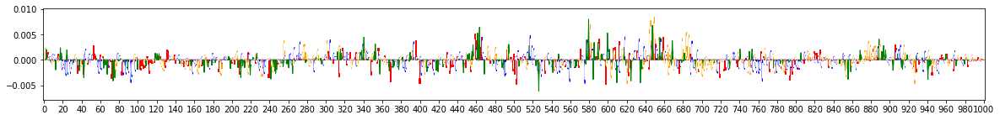

KeyboardInterrupt: 

In [10]:
import modisco.visualization
from modisco.visualization import viz_sequence

viz_sequence.plot_weights(task_to_scores['Dex'][0], subticks_frequency=20)
viz_sequence.plot_weights(task_to_hyp_scores['Dex'][0], subticks_frequency=20)
viz_sequence.plot_weights(onehot_data[0], subticks_frequency=20)

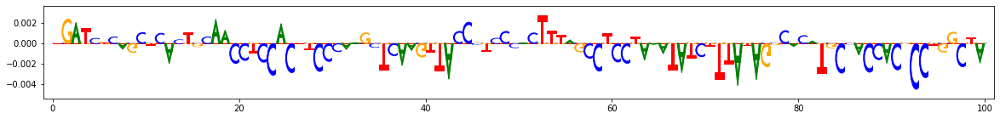

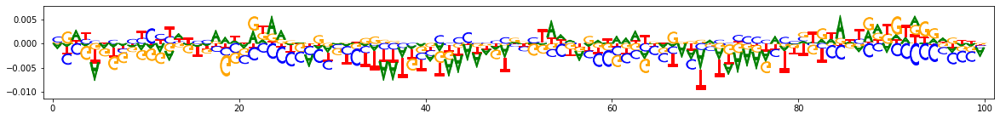

In [10]:
import modisco.visualization
from modisco.visualization import viz_sequence
viz_sequence.plot_weights(task_to_scores['Dex'][0][:100], subticks_frequency=20)
viz_sequence.plot_weights(task_to_hyp_scores['Dex'][0][:100], subticks_frequency=20)

MEMORY 0.36442112
On task DMSO
Computing windowed sums on original
Generating null dist
peak(mu)= -0.001864181101998363
Computing threshold
For increasing = True , the minimum IR precision was 0.10714775988734206 occurring at 1.3796074200406183e-07 implying a frac_neg of 0.12000615003645218
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.37943750592419734 occurring at -4.784291368631344e-08 implying a frac_neg of 0.6114412481361602
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.11298464955281828  and  0.14334302646937436 with frac passing 0.01125760649087221
Passing windows frac was 0.01125760649087221 , which is below  0.03 ; adjusting
Final raw thresholds are -0.07177797422705212  and  0.07177797422705212
Final transformed thresholds are -0.97  and  0.97


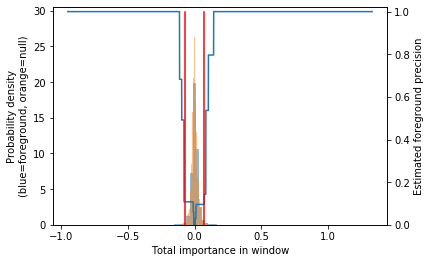

Got 2552 coords
On task Dex
Computing windowed sums on original
Generating null dist
peak(mu)= -0.002563953138429593
Computing threshold
For increasing = True , the minimum IR precision was 0.20053345947153348 occurring at 6.638993910179636e-08 implying a frac_neg of 0.2508340866135262
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.4132767466545821 occurring at -1.826539114402337e-08 implying a frac_neg of 0.7043810592099992
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.0844697999607889  and  0.12253076510085521 with frac passing 0.013875253549695741
Passing windows frac was 0.013875253549695741 , which is below  0.03 ; adjusting
Final raw thresholds are -0.07666085813940895  and  0.07666085813940895
Final transformed thresholds are -0.97  and  0.97


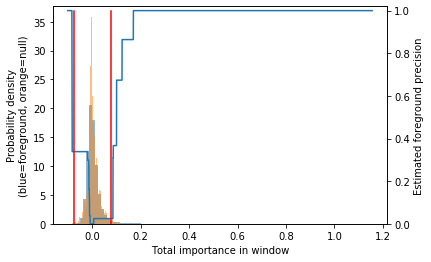

Got 2515 coords
After resolving overlaps, got 3613 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699
MEMORY 0.53024768
3613 identified in total
5 activity patterns with support >= 100 out of 8 possible patterns
Metacluster sizes:  [1690, 1108, 458, 230, 123]
Idx to activities:  {0: '1,1', 1: '-1,1', 2: '0,1', 3: '-1,0', 4: '1,0'}
MEMORY 0.53024768
On metacluster 4
Metacluster size 123
Relevant tasks:  ('DMSO',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 123
(Round 1) Computing coarse affmat
MEMORY 0.459436032
Beginning embedding computation
MEMORY 0.459436032
At the beginning of embedding call
MEMORY 0.459436032
before computing embeddings fwd
MEMORY 0.459436032


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:   16.2s
[Parallel(n_jobs=20)]: Done 123 out of 123 | elapsed:   40.3s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.46239744


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s


after computing embeddings rev
MEMORY 0.464502784
before computing sparse embeddings fwd
MEMORY 0.464502784
Constructing csr matrix...
csr matrix made in 0.024556398391723633 s
after computing sparse embeddings fwd
MEMORY 0.464699392
before computing sparse embeddings rev
MEMORY 0.464699392
Constructing csr matrix...
csr matrix made in 0.02337956428527832 s
after computing sparse embeddings rev
MEMORY 0.464961536
Finished embedding computation in 64.11 s
MEMORY 0.464437248
Starting affinity matrix computations
MEMORY 0.464437248
Batching in slices of size 123


[Parallel(n_jobs=20)]: Done 123 out of 123 | elapsed:   23.6s finished
100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

Finished affinity matrix computations in 1.55 s
MEMORY 0.464654336
(Round 1) Computed coarse affmat
MEMORY 0.464449536
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 0.464449536
Launching nearest neighbors affmat calculation job
MEMORY 0.464449536


Parallel runs completed
MEMORY 0.488853504
Job completed in: 1.07 s
MEMORY 0.488853504
Launching nearest neighbors affmat calculation job
MEMORY 0.488853504
Parallel runs completed
MEMORY 0.50061312
Job completed in: 1.02 s
MEMORY 0.50061312
(Round 1) Computed affinity matrix on nearest neighbors in 2.16 s
MEMORY 0.500621312
Filtered down to 121 of 123
(Round 1) Retained 121 rows out of 123 after filtering
MEMORY 0.502992896
(Round 1) Computing density adapted affmat
MEMORY 0.502992896
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 0.502996992
Beginning preprocessing + Leiden
Affmat shape: 121


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.4s


Quality: 0.06972944947511851
Quality: 0.07021817580100816
Got 3 clusters after round 1
Counts:
{1: 54, 0: 61, 2: 6}
MEMORY 0.5031936
(Round 1) Aggregating seqlets in each cluster
MEMORY 0.5031936
Aggregating for cluster 0 with 61 seqlets
MEMORY 0.5031936
Skipped 2 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 59
Aggregating for cluster 1 with 54 seqlets
MEMORY 0.503197696


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.0s finished


Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 53
Aggregating for cluster 2 with 6 seqlets
MEMORY 0.503197696
Trimming eliminated 0 seqlets out of 6
(Round 2) num seqlets: 118
(Round 2) Computing coarse affmat
MEMORY 0.503197696
Beginning embedding computation
MEMORY 0.503197696
At the beginning of embedding call
MEMORY 0.503197696
before computing embeddings fwd
MEMORY 0.503197696


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 118 out of 118 | elapsed:   22.2s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.503197696


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s


after computing embeddings rev
MEMORY 0.504782848
before computing sparse embeddings fwd
MEMORY 0.504782848
Constructing csr matrix...
csr matrix made in 0.024316072463989258 s
after computing sparse embeddings fwd
MEMORY 0.504782848
before computing sparse embeddings rev
MEMORY 0.504782848
Constructing csr matrix...
csr matrix made in 0.022092580795288086 s
after computing sparse embeddings rev
MEMORY 0.504782848
Finished embedding computation in 45.03 s
MEMORY 0.50425856
Starting affinity matrix computations
MEMORY 0.50425856
Batching in slices of size 118


[Parallel(n_jobs=20)]: Done 118 out of 118 | elapsed:   22.6s finished
100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

Finished affinity matrix computations in 1.55 s
MEMORY 0.504000512
(Round 2) Computed coarse affmat
MEMORY 0.503730176
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 0.503730176
Launching nearest neighbors affmat calculation job
MEMORY 0.503730176


Parallel runs completed
MEMORY 0.514383872
Job completed in: 1.03 s
MEMORY 0.514383872
Launching nearest neighbors affmat calculation job
MEMORY 0.514383872
Parallel runs completed
MEMORY 0.52457472
Job completed in: 0.94 s
MEMORY 0.52457472
(Round 2) Computed affinity matrix on nearest neighbors in 2.05 s
MEMORY 0.52457472
Not applying filtering for rounds above first round
MEMORY 0.52457472
(Round 2) Computing density adapted affmat
MEMORY 0.52457472
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 0.52457472
Beginning preprocessing + Leiden
Affmat shape: 118


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.2s


Quality: 0.08366102992532792
Got 4 clusters after round 2
Counts:
{0: 58, 1: 57, 3: 1, 2: 2}
MEMORY 0.52457472
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.52457472
Aggregating for cluster 0 with 58 seqlets
MEMORY 0.52457472
Trimming eliminated 0 seqlets out of 58
Aggregating for cluster 1 with 57 seqlets
MEMORY 0.52461568


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.0s finished


Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 56
Aggregating for cluster 2 with 2 seqlets
MEMORY 0.52461568
Trimming eliminated 0 seqlets out of 2
Aggregating for cluster 3 with 1 seqlets
MEMORY 0.52461568
Trimming eliminated 0 seqlets out of 1
Dropping cluster 3 with 1 seqlets due to sign disagreement
Got 3 clusters
Splitting into subclusters...
MEMORY 0.52461568
Inspecting pattern 0 for spurious merging
Inspecting pattern 1 for spurious merging
Inspecting pattern 2 for spurious merging
Merging on 3 clusters
MEMORY 0.52461568
On merging iteration 1
Numbers for each pattern pre-subsample: [58, 56, 2]
Numbers after subsampling: [58, 56, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.2772023677825928 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.25916576385498047 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.022181272506713867 s
Cluster sizes
[58 56  2]
Cross-contamination matrix:
[[1.   0.35 0.61]
 [0.   1.   0.01]

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   30.4s
[Parallel(n_jobs=20)]: Done 230 out of 230 | elapsed:   43.9s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.525266944


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   30.5s
[Parallel(n_jobs=20)]: Done 230 out of 230 | elapsed:   44.1s finished


after computing embeddings rev
MEMORY 0.533245952
before computing sparse embeddings fwd
MEMORY 0.533245952
Constructing csr matrix...
csr matrix made in 0.043004751205444336 s
after computing sparse embeddings fwd
MEMORY 0.533245952
before computing sparse embeddings rev
MEMORY 0.533245952
Constructing csr matrix...
csr matrix made in 0.042459964752197266 s
after computing sparse embeddings rev
MEMORY 0.533245952
Finished embedding computation in 88.18 s
MEMORY 0.528269312
Starting affinity matrix computations
MEMORY 0.528269312
Batching in slices of size 230


100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

Finished affinity matrix computations in 1.58 s
MEMORY 0.528269312
(Round 1) Computed coarse affmat
MEMORY 0.528044032
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 0.528044032
Launching nearest neighbors affmat calculation job
MEMORY 0.528044032


Parallel runs completed
MEMORY 0.556060672
Job completed in: 2.85 s
MEMORY 0.555798528
Launching nearest neighbors affmat calculation job
MEMORY 0.555798528
Parallel runs completed
MEMORY 0.577732608
Job completed in: 2.86 s
MEMORY 0.577732608
(Round 1) Computed affinity matrix on nearest neighbors in 5.82 s
MEMORY 0.577732608
Filtered down to 228 of 230
(Round 1) Retained 228 rows out of 230 after filtering
MEMORY 0.577732608
(Round 1) Computing density adapted affmat
MEMORY 0.577732608
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 0.578875392
Beginning preprocessing + Leiden
Affmat shape: 228


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.6s


Quality: 0.03383163760070743
Got 4 clusters after round 1
Counts:
{2: 59, 0: 92, 1: 76, 3: 1}
MEMORY 0.578875392
(Round 1) Aggregating seqlets in each cluster
MEMORY 0.578875392
Aggregating for cluster 0 with 92 seqlets
MEMORY 0.578875392
Skipped 1 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 91
Skipped 1 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    6.1s finished


Aggregating for cluster 1 with 76 seqlets
MEMORY 0.57839616
Skipped 1 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 74
Skipped 3 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 59 seqlets
MEMORY 0.57839616
Trimming eliminated 0 seqlets out of 59
Aggregating for cluster 3 with 1 seqlets
MEMORY 0.57839616
Trimming eliminated 0 seqlets out of 1
Dropping cluster 3 with 1 seqlets due to sign disagreement
(Round 2) num seqlets: 220
(Round 2) Computing coarse affmat
MEMORY 0.578134016
Beginning embedding computation
MEMORY 0.578134016
At the beginning of embedding call
MEMORY 0.578134016
before computing embeddings fwd
MEMORY 0.578134016


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   30.0s
[Parallel(n_jobs=20)]: Done 220 out of 220 | elapsed:   41.5s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.578920448


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   30.4s
[Parallel(n_jobs=20)]: Done 220 out of 220 | elapsed:   41.3s finished


after computing embeddings rev
MEMORY 0.584155136
before computing sparse embeddings fwd
MEMORY 0.584155136
Constructing csr matrix...
csr matrix made in 0.0431065559387207 s
after computing sparse embeddings fwd
MEMORY 0.584155136
before computing sparse embeddings rev
MEMORY 0.584155136
Constructing csr matrix...
csr matrix made in 0.048182010650634766 s
after computing sparse embeddings rev
MEMORY 0.584155136
Finished embedding computation in 82.98 s
MEMORY 0.579227648
Starting affinity matrix computations
MEMORY 0.579227648
Batching in slices of size 220


100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

Finished affinity matrix computations in 1.55 s
MEMORY 0.579227648
(Round 2) Computed coarse affmat
MEMORY 0.579227648
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 0.579227648
Launching nearest neighbors affmat calculation job
MEMORY 0.579227648


Parallel runs completed
MEMORY 0.600510464
Job completed in: 2.66 s
MEMORY 0.600387584
Launching nearest neighbors affmat calculation job
MEMORY 0.600387584
Parallel runs completed
MEMORY 0.620941312
Job completed in: 2.58 s
MEMORY 0.620941312
(Round 2) Computed affinity matrix on nearest neighbors in 5.34 s
MEMORY 0.620941312
Not applying filtering for rounds above first round
MEMORY 0.620941312
(Round 2) Computing density adapted affmat
MEMORY 0.620941312
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 0.621580288
Beginning preprocessing + Leiden
Affmat shape: 220


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.7s


Quality: 0.025873600835405963
Got 6 clusters after round 2
Counts:
{0: 118, 4: 2, 5: 1, 1: 81, 2: 14, 3: 4}
MEMORY 0.621580288
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.621580288
Aggregating for cluster 0 with 118 seqlets
MEMORY 0.621580288


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    6.1s finished


Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 117
Aggregating for cluster 1 with 81 seqlets
MEMORY 0.621318144
Skipped 1 seqlets that went over the sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 80
Aggregating for cluster 2 with 14 seqlets
MEMORY 0.621318144
Trimming eliminated 0 seqlets out of 14
Aggregating for cluster 3 with 4 seqlets
MEMORY 0.621318144
Trimming eliminated 0 seqlets out of 4
Aggregating for cluster 4 with 2 seqlets
MEMORY 0.621318144
Trimming eliminated 0 seqlets out of 2
Aggregating for cluster 5 with 1 seqlets
MEMORY 0.621318144
Trimming eliminated 0 seqlets out of 1
Got 6 clusters
Splitting into subclusters...
MEMORY 0.621318144
Inspecting pattern 0 for spurious merging
[t-SNE] Computed conditional probabilities for sample 117 / 117
[t-SNE] Mean sigma: 0.386121


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  78 out of 117 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=20)]: Done 117 out of 117 | elapsed:    0.2s finished


Beginning preprocessing + Leiden
Affmat shape: 117


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.2s


Quality: 0.20395350117826633
Got subclusters: Counter({0: 41, 1: 37, 2: 29, 3: 10})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.1s finished


Numbers for each pattern pre-subsample: [41, 37, 29, 10]
Numbers after subsampling: [41, 37, 29, 10]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.2555105686187744 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.19420981407165527 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.15804028511047363 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.06551480293273926 s
Cluster sizes
[41 37 29 10]
Cross-contamination matrix:
[[1.   0.62 0.63 0.35]
 [0.75 1.   0.8  0.41]
 [0.77 0.8  1.   0.37]
 [0.89 0.87 0.86 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.86 0.84 0.76]
 [0.86 1.   0.93 0.82]
 [0.84 0.93 1.   0.79]
 [0.76 0.82 0.79 1.  ]]
Collapsing 1 & 2 with crosscontam 0.800001773063399 and sim 0.9339421559100289
Collapsing 0 & 1 with crosscontam 0.6161225719850811 and sim 0.8600164087580352
Trimming eliminated 0 seqlets out of 66
Trimming eliminated 0 seqlets out of 107
Unmerged patterns remapping: OrderedDict([(3, 1)])
Time spe

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  80 out of  80 | elapsed:    0.1s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


Affmat shape: 80


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.3s


Quality: 0.12141621103381826
Quality: 0.12624413414420046
Quality: 0.12706642498113122
Got subclusters: Counter({0: 22, 1: 21, 2: 15, 3: 12, 4: 10})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    4.9s finished


Numbers for each pattern pre-subsample: [22, 21, 15, 12, 10]
Numbers after subsampling: [22, 21, 15, 12, 10]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.16108226776123047 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.14301300048828125 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.10113167762756348 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.08735799789428711 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.07130694389343262 s
Cluster sizes
[22 21 15 12 10]
Cross-contamination matrix:
[[1.   0.35 0.3  0.45 0.31]
 [0.92 1.   0.6  0.73 0.67]
 [0.77 0.5  1.   0.71 0.54]
 [0.64 0.39 0.44 1.   0.43]
 [0.61 0.4  0.37 0.49 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.73 0.68 0.69 0.52]
 [0.73 1.   0.53 0.58 0.41]
 [0.68 0.53 1.   0.63 0.35]
 [0.69 0.58 0.63 1.   0.46]
 [0.52 0.41 0.35 0.46 1.  ]]
Inspecting pattern 2 for spurious merging
Inspecting pattern 3 for spurious merging
Inspecting pattern 4 for 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 104 out of 143 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=20)]: Done 143 out of 143 | elapsed:    0.2s finished
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 142 nearest neighbors...
[t-SNE] Indexed 143 samples in 0.002s...
[t-SNE] Computed neighbors for 143 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 143 / 143
[t-SNE] Mean sigma: 0.374711
[t-SNE] Computed conditional probabilities in 0.009s
[t-SNE] Iteration 50: error = 61.6492157, gradient norm = 0.4841651 (50 iterations in 0.024s)
[t-SNE] Iteration 100: error = 64.0360947, gradient norm = 0.4542248 (50 iterations in 0.025s)
[t-SNE] Iteration 150: error = 64.8151550, gradient norm = 0.4465416 (50 iterations in 0.024s)
[t-SNE] Iteration 200: error = 62.4733582, gradient norm = 0.4644493 (50 iterations in 0.024s)
[t-SNE] Iteration 250: error = 66.5712585, gradient norm = 0.4436220 (50 iterations in 0.024s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.571259
[t-SNE] Iteration 300: error = 0.9769199, gradient norm = 0.0077070 (50 iterations in 0.023s)
[t-SNE] Iteration 350: error = 0.7382712, gradient norm = 0.0083166 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    1.9s


Quality: 0.20995198894158068
Quality: 0.21007657124379164
Got subclusters: Counter({0: 53, 1: 49, 2: 41})
On metacluster 2
Metacluster size 458
Relevant tasks:  ('Dex',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 458
(Round 1) Computing coarse affmat
MEMORY 0.621174784
Beginning embedding computation
MEMORY 0.621174784


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.2s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


At the beginning of embedding call
MEMORY 0.621174784
before computing embeddings fwd
MEMORY 0.621174784


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.4s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.3min
[Parallel(n_jobs=20)]: Done 458 out of 458 | elapsed:  1.4min finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.626999296


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.8s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.3min
[Parallel(n_jobs=20)]: Done 458 out of 458 | elapsed:  1.4min finished


after computing embeddings rev
MEMORY 0.642985984
before computing sparse embeddings fwd
MEMORY 0.642985984
Constructing csr matrix...
csr matrix made in 0.08639168739318848 s
after computing sparse embeddings fwd
MEMORY 0.642985984
before computing sparse embeddings rev
MEMORY 0.642985984
Constructing csr matrix...
csr matrix made in 0.08789706230163574 s
after computing sparse embeddings rev
MEMORY 0.642985984
Finished embedding computation in 172.48 s
MEMORY 0.630403072
Starting affinity matrix computations
MEMORY 0.630403072
Batching in slices of size 458


100%|██████████| 1/1 [00:01<00:00,  1.65s/it]

Finished affinity matrix computations in 1.66 s
MEMORY 0.630403072
(Round 1) Computed coarse affmat
MEMORY 0.629878784
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 0.629878784
Launching nearest neighbors affmat calculation job
MEMORY 0.629878784


Parallel runs completed
MEMORY 0.68501504
Job completed in: 9.71 s
MEMORY 0.684490752
Launching nearest neighbors affmat calculation job
MEMORY 0.684490752
Parallel runs completed
MEMORY 0.719908864
Job completed in: 9.64 s
MEMORY 0.719908864
(Round 1) Computed affinity matrix on nearest neighbors in 19.49 s
MEMORY 0.719908864
Filtered down to 455 of 458
(Round 1) Retained 455 rows out of 458 after filtering
MEMORY 0.719908864
(Round 1) Computing density adapted affmat
MEMORY 0.719908864
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 0.72077312
Beginning preprocessing + Leiden
Affmat shape: 455


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    4.9s


Quality: 0.030438108933214206
Got 4 clusters after round 1
Counts:
{1: 149, 0: 206, 2: 99, 3: 1}
MEMORY 0.721014784
(Round 1) Aggregating seqlets in each cluster
MEMORY 0.721014784
Aggregating for cluster 0 with 206 seqlets
MEMORY 0.721014784


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   10.8s finished


Skipped 6 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 200
Aggregating for cluster 1 with 149 seqlets
MEMORY 0.721260544
Trimming eliminated 0 seqlets out of 149
Removed 7 duplicate seqlets
Aggregating for cluster 2 with 99 seqlets
MEMORY 0.721260544
Skipped 1 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 97
Skipped 2 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 1 seqlets
MEMORY 0.721260544
Trimming eliminated 0 seqlets out of 1
(Round 2) num seqlets: 438
(Round 2) Computing coarse affmat
MEMORY 0.720474112
Beginning embedding computation
MEMORY 0.720474112
At the beginning of embedding call
MEMORY 0.720474112
before computing embeddings fwd
MEMORY 0.720474112


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.3s
[Parallel(n_jobs=20)]: Done 438 out of 438 | elapsed:  1.3min finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.72873984


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.7s
[Parallel(n_jobs=20)]: Done 438 out of 438 | elapsed:  1.3min finished


after computing embeddings rev
MEMORY 0.739811328
before computing sparse embeddings fwd
MEMORY 0.739811328
Constructing csr matrix...
csr matrix made in 0.08392190933227539 s
after computing sparse embeddings fwd
MEMORY 0.739811328
before computing sparse embeddings rev
MEMORY 0.739811328
Constructing csr matrix...
csr matrix made in 0.08289766311645508 s
after computing sparse embeddings rev
MEMORY 0.739811328
Finished embedding computation in 160.61 s
MEMORY 0.727498752
Starting affinity matrix computations
MEMORY 0.727498752
Batching in slices of size 438


100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

Finished affinity matrix computations in 1.71 s
MEMORY 0.727236608
(Round 2) Computed coarse affmat
MEMORY 0.72593408
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 0.72593408
Launching nearest neighbors affmat calculation job
MEMORY 0.72593408


Parallel runs completed
MEMORY 0.768663552
Job completed in: 8.73 s
MEMORY 0.76853248
Launching nearest neighbors affmat calculation job
MEMORY 0.76853248
Parallel runs completed
MEMORY 0.791293952
Job completed in: 8.87 s
MEMORY 0.791293952
(Round 2) Computed affinity matrix on nearest neighbors in 17.77 s
MEMORY 0.791293952
Not applying filtering for rounds above first round
MEMORY 0.791293952
(Round 2) Computing density adapted affmat
MEMORY 0.791293952
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 0.80285696
Beginning preprocessing + Leiden
Affmat shape: 438


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    4.6s


Quality: 0.018049126026207583
Got 5 clusters after round 2
Counts:
{0: 194, 1: 127, 2: 113, 4: 1, 3: 3}
MEMORY 0.802926592
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.802926592
Aggregating for cluster 0 with 194 seqlets
MEMORY 0.802926592


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   11.5s finished


Skipped 7 due to duplicates
Trimming eliminated 0 seqlets out of 187
Aggregating for cluster 1 with 127 seqlets
MEMORY 0.802926592
Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 124
Aggregating for cluster 2 with 113 seqlets
MEMORY 0.802926592
Trimming eliminated 0 seqlets out of 113
Aggregating for cluster 3 with 3 seqlets
MEMORY 0.802926592
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 2
Aggregating for cluster 4 with 1 seqlets
MEMORY 0.802926592
Trimming eliminated 0 seqlets out of 1
Got 5 clusters
Splitting into subclusters...
MEMORY 0.802926592
Inspecting pattern 0 for spurious merging


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 187 / 187
[t-SNE] Mean sigma: 0.315175
Beginning preprocessing + Leiden


[Parallel(n_jobs=20)]: Done 187 out of 187 | elapsed:    0.3s finished


Affmat shape: 187


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.8s


Quality: 0.26664091656663425
Quality: 0.26708093567162794
Quality: 0.26811084093389503
Quality: 0.2681108409338951
Got subclusters: Counter({0: 57, 1: 37, 3: 32, 2: 32, 4: 29})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.9s finished


Numbers for each pattern pre-subsample: [57, 37, 32, 32, 29]
Numbers after subsampling: [57, 37, 32, 32, 29]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.5319235324859619 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.2780604362487793 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.23952412605285645 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.23709774017333984 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.21955347061157227 s
Cluster sizes
[57 37 32 32 29]
Cross-contamination matrix:
[[1.   0.61 0.59 0.61 0.58]
 [0.94 1.   0.73 0.86 0.74]
 [0.98 0.8  1.   0.83 0.79]
 [0.69 0.61 0.54 1.   0.63]
 [0.88 0.68 0.66 0.82 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.93 0.95 0.91 0.9 ]
 [0.93 1.   0.92 0.92 0.91]
 [0.95 0.92 1.   0.9  0.91]
 [0.91 0.92 0.9  1.   0.9 ]
 [0.9  0.91 0.91 0.9  1.  ]]
Collapsing 0 & 2 with crosscontam 0.5869532055747249 and sim 0.9546578464343756
Collapsing 0 & 1 with crosscont

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 124 out of 124 | elapsed:    0.2s finished


Beginning preprocessing + Leiden
Affmat shape: 124


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.3s


Quality: 0.20574159058943414
Got subclusters: Counter({0: 34, 1: 31, 2: 24, 3: 23, 4: 8, 5: 4})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.2s finished


Numbers for each pattern pre-subsample: [34, 31, 24, 23, 8, 4]
Numbers after subsampling: [34, 31, 24, 23, 8, 4]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.31760334968566895 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.26496195793151855 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.20339131355285645 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.19943618774414062 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.08358335494995117 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.05413484573364258 s
Cluster sizes
[34 31 24 23  8  4]
Cross-contamination matrix:
[[1.   0.66 0.55 0.65 0.25 0.25]
 [0.68 1.   0.59 0.78 0.18 0.36]
 [0.8  0.81 1.   0.84 0.23 0.34]
 [0.61 0.71 0.55 1.   0.13 0.23]
 [0.24 0.19 0.18 0.15 1.   0.09]
 [0.1  0.15 0.06 0.09 0.01 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.93 0.91 0.9  0.71 0.74]
 [0.93 1.   0.93 0.92 0.68 0.78]
 [0.91 0.93 1.   0.9  0.67 0.75]
 [0.

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  74 out of 113 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=20)]: Done 113 out of 113 | elapsed:    0.2s finished


[t-SNE] Computed conditional probabilities for sample 113 / 113
[t-SNE] Mean sigma: 0.568139
Beginning preprocessing + Leiden
Affmat shape: 113


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s


Quality: 0.23446024276373795
Got subclusters: Counter({0: 40, 1: 36, 2: 22, 3: 15})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.0s finished


Numbers for each pattern pre-subsample: [40, 36, 22, 15]
Numbers after subsampling: [40, 36, 22, 15]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.28792238235473633 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.19357752799987793 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.12725353240966797 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.08629751205444336 s
Cluster sizes
[40 36 22 15]
Cross-contamination matrix:
[[1.   0.57 0.34 0.42]
 [0.5  1.   0.14 0.41]
 [0.96 0.77 1.   0.73]
 [0.62 0.74 0.29 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.64 0.66 0.59]
 [0.64 1.   0.42 0.65]
 [0.66 0.42 1.   0.44]
 [0.59 0.65 0.44 1.  ]]
Inspecting pattern 3 for spurious merging
Inspecting pattern 4 for spurious merging
Merging on 10 clusters
MEMORY 0.802545664
On merging iteration 1
Numbers for each pattern pre-subsample: [187, 112, 8, 4, 40, 36, 22, 15, 2, 1]
Numbers after subsampling: [187, 112, 8, 4, 40, 36, 22, 15, 2, 1]
Comp

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 187 out of 187 | elapsed:    0.4s finished
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 187 samples in 0.002s...
[t-SNE] Computed neighbors for 187 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 187 / 187
[t-SNE] Mean sigma: 0.321166
[t-SNE] Computed conditional probabilities in 0.014s
[t-SNE] Iteration 50: error = 67.9110565, gradient norm = 0.4493567 (50 iterations in 0.036s)
[t-SNE] Iteration 100: error = 66.0817261, gradient norm = 0.4837814 (50 iterations in 0.035s)
[t-SNE] Iteration 150: error = 69.7566681, gradient norm = 0.4196766 (50 iterations in 0.034s)
[t-SNE] Iteration 200: error = 64.4716034, gradient norm = 0.4688204 (50 iterations in 0.034s)
[t-SNE] Iteration 250: error = 64.3288498, gradient norm = 0.5119081 (50 iterations in 0.035s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.328850
[t-SNE] Iteration 300: error = 1.0387565, gradient norm = 0.0086098 (50 iterations in 0.035s)
[t-SNE] Iteration 350: error = 0.6360277, gradient norm = 0.0072759 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.3s


Quality: 0.2454180353404245
Quality: 0.2478252690778322
Quality: 0.248536574374784
Quality: 0.24854629055405847


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.8s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 71, 1: 37, 2: 28, 3: 26, 4: 25})
On pattern 1


[Parallel(n_jobs=20)]: Done 112 out of 112 | elapsed:    0.2s finished


[t-SNE] Computing 111 nearest neighbors...
[t-SNE] Indexed 112 samples in 0.001s...
[t-SNE] Computed neighbors for 112 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 112 / 112
[t-SNE] Mean sigma: 0.411490
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 54.9016800, gradient norm = 0.4465614 (50 iterations in 0.021s)
[t-SNE] Iteration 100: error = 56.3767700, gradient norm = 0.4762922 (50 iterations in 0.018s)
[t-SNE] Iteration 150: error = 54.2104988, gradient norm = 0.4464977 (50 iterations in 0.019s)
[t-SNE] Iteration 200: error = 52.8159180, gradient norm = 0.5075870 (50 iterations in 0.017s)
[t-SNE] Iteration 250: error = 55.5342941, gradient norm = 0.5617062 (50 iterations in 0.017s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.534294
[t-SNE] Iteration 300: error = 0.9363168, gradient norm = 0.0062880 (50 iterations in 0.016s)
[t-SNE] Iteration 350: error = 0.5929036, gradient norm = 0.0286452 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.2s


Quality: 0.18250726955163218
Quality: 0.1840874356011593
Got subclusters: Counter({0: 31, 1: 29, 2: 22, 3: 18, 4: 10, 5: 2})
On metacluster 1
Metacluster size 1108
Relevant tasks:  ('DMSO', 'Dex')
Relevant signs:  (-1, 1)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1108
(Round 1) Computing coarse affmat
MEMORY 0.80228352
Beginning embedding computation
MEMORY 0.80228352


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.2s finished


At the beginning of embedding call
MEMORY 0.80228352
before computing embeddings fwd
MEMORY 0.80228352


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.3s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.5s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.2min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 1108 out of 1108 | elapsed:  3.3min finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 0.82376704


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.2s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.2min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 1108 out of 1108 | elapsed:  3.3min finished


after computing embeddings rev
MEMORY 0.851206144
before computing sparse embeddings fwd
MEMORY 0.851206144
Constructing csr matrix...
csr matrix made in 0.20679163932800293 s
after computing sparse embeddings fwd
MEMORY 0.851206144
before computing sparse embeddings rev
MEMORY 0.851206144
Constructing csr matrix...
csr matrix made in 0.22222447395324707 s
after computing sparse embeddings rev
MEMORY 0.851206144
Finished embedding computation in 401.0 s
MEMORY 0.819556352
Starting affinity matrix computations
MEMORY 0.819294208
Batching in slices of size 1108


100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

Finished affinity matrix computations in 1.99 s
MEMORY 0.852299776
(Round 1) Computed coarse affmat
MEMORY 0.85147648
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 0.85147648


Launching nearest neighbors affmat calculation job
MEMORY 0.85147648
Parallel runs completed
MEMORY 0.96636928
Job completed in: 40.46 s
MEMORY 0.966254592
Launching nearest neighbors affmat calculation job
MEMORY 0.966254592
Parallel runs completed
MEMORY 1.021259776
Job completed in: 40.46 s
MEMORY 1.021145088
(Round 1) Computed affinity matrix on nearest neighbors in 81.26 s
MEMORY 1.021145088
Filtered down to 1090 of 1108
(Round 1) Retained 1090 rows out of 1108 after filtering
MEMORY 1.021145088
(Round 1) Computing density adapted affmat
MEMORY 1.024114688
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.08181504
Beginning preprocessing + Leiden
Affmat shape: 1090


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:   17.9s


Quality: 0.1406865019130021
Got 3 clusters after round 1
Counts:
{0: 569, 1: 511, 2: 10}
MEMORY 1.082507264
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.082507264
Aggregating for cluster 0 with 569 seqlets
MEMORY 1.082507264


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   38.0s finished


Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 2 seqlets that went over sequence edge during flank expansion
Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 563
Skipped 1 seqlets that went over the sequence edge during flank expansion
Removed 4 duplicate seqlets
Aggregating for cluster 1 with 511 seqlets
MEMORY 1.081982976
Skipped 1 seqlets that went over sequence edge during flank expansion
Skipped 10 due to duplicates
Trimming eliminated 0 seqlets out of 500
Removed 23 duplicate seqlets
Aggregating for cluster 2 with 10 seqlets
MEMORY 1.081982976
Skipped 1 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 9
(Round 2) num seqlets: 928
(Round 2) Computing coarse affmat
MEMORY 1.081982976
Beginning embedding computation
MEMORY 1.081982976
At the beginning of embedding call
MEMORY 1.081982976
before computing embeddings fwd
MEMORY 1.081982976


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.2s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   28.6s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.2min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 928 out of 928 | elapsed:  2.8min finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 1.104908288


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   28.9s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.2min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.6min
[Parallel(n_jobs=20)]: Done 928 out of 928 | elapsed:  3.1min finished


after computing embeddings rev
MEMORY 1.127919616
before computing sparse embeddings fwd
MEMORY 1.127919616
Constructing csr matrix...
csr matrix made in 0.1758437156677246 s
after computing sparse embeddings fwd
MEMORY 1.127919616
before computing sparse embeddings rev
MEMORY 1.127919616
Constructing csr matrix...
csr matrix made in 0.17258358001708984 s
after computing sparse embeddings rev
MEMORY 1.127919616
Finished embedding computation in 351.6 s
MEMORY 1.100132352
Starting affinity matrix computations
MEMORY 1.100132352
Batching in slices of size 928


100%|██████████| 1/1 [00:01<00:00,  1.89s/it]

Finished affinity matrix computations in 1.91 s
MEMORY 1.099870208
(Round 2) Computed coarse affmat
MEMORY 1.099083776
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.099083776


Launching nearest neighbors affmat calculation job
MEMORY 1.099083776
Parallel runs completed
MEMORY 1.152385024
Job completed in: 33.83 s
MEMORY 1.151954944
Launching nearest neighbors affmat calculation job
MEMORY 1.151954944
Parallel runs completed
MEMORY 1.242402816
Job completed in: 33.68 s
MEMORY 1.242402816
(Round 2) Computed affinity matrix on nearest neighbors in 67.83 s
MEMORY 1.177964544
Not applying filtering for rounds above first round
MEMORY 1.177964544
(Round 2) Computing density adapted affmat
MEMORY 1.182015488
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.189363712
Beginning preprocessing + Leiden
Affmat shape: 928


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:   15.6s


Quality: 0.09069200197760438
Quality: 0.09070686335382602
Quality: 0.09071840219535321
Got 3 clusters after round 2
Counts:
{0: 479, 1: 428, 2: 21}
MEMORY 1.189748736
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.189748736
Aggregating for cluster 0 with 479 seqlets
MEMORY 1.189748736


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   34.9s finished


Skipped 2 due to duplicates
Trimming eliminated 0 seqlets out of 477
Removed 1 duplicate seqlets
Aggregating for cluster 1 with 428 seqlets
MEMORY 1.189748736
Skipped 10 due to duplicates
Trimming eliminated 0 seqlets out of 418
Aggregating for cluster 2 with 21 seqlets
MEMORY 1.189462016
Trimming eliminated 0 seqlets out of 21
Got 3 clusters
Splitting into subclusters...
MEMORY 1.189462016
Inspecting pattern 0 for spurious merging


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 280 tasks      | elapsed:    1.4s
[Parallel(n_jobs=20)]: Done 437 out of 476 | elapsed:    2.2s remaining:    0.2s
[Parallel(n_jobs=20)]: Done 476 out of 476 | elapsed:    2.3s finished


[t-SNE] Computed conditional probabilities for sample 476 / 476
[t-SNE] Mean sigma: 0.234931
Beginning preprocessing + Leiden
Affmat shape: 476


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    4.5s


Quality: 0.3521567440028755
Quality: 0.35291117529881716
Got subclusters: Counter({0: 133, 1: 111, 2: 103, 3: 60, 4: 50, 5: 11, 6: 8})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   10.4s finished


Numbers for each pattern pre-subsample: [133, 111, 103, 60, 50, 11, 8]
Numbers after subsampling: [133, 111, 103, 60, 50, 11, 8]
Computing sims for pattern 0
Computed sims for pattern 0 in 2.6422019004821777 s
Computing sims for pattern 1
Computed sims for pattern 1 in 2.25925874710083 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.0395803451538086 s
Computing sims for pattern 3
Computed sims for pattern 3 in 1.2365813255310059 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.0527498722076416 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.2564077377319336 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.21174097061157227 s
Cluster sizes
[133 111 103  60  50  11   8]
Cross-contamination matrix:
[[1.   0.74 0.99 1.   0.49 0.82 0.37]
 [0.75 1.   1.   0.97 0.56 0.82 0.36]
 [0.65 0.65 1.   0.89 0.36 0.67 0.3 ]
 [0.68 0.63 0.93 1.   0.39 0.7  0.28]
 [0.73 0.8  0.82 0.92 1.   0.8  0.3 ]
 [0.57 0.55 0.72 0.76 0.32 1.   0.42]
 [0.2

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 379 out of 418 | elapsed:    1.6s remaining:    0.2s
[Parallel(n_jobs=20)]: Done 418 out of 418 | elapsed:    1.7s finished


[t-SNE] Computed conditional probabilities for sample 418 / 418
[t-SNE] Mean sigma: 0.277832
Beginning preprocessing + Leiden
Affmat shape: 418


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    4.1s


Quality: 0.35673833908292035
Quality: 0.36006100775366695
Quality: 0.36033219742296485
Quality: 0.3605714082728882
Got subclusters: Counter({0: 95, 1: 82, 2: 79, 3: 63, 4: 33, 5: 31, 6: 14, 7: 10, 8: 8, 9: 3})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    9.2s finished


Numbers for each pattern pre-subsample: [95, 82, 79, 63, 33, 31, 14, 10, 8, 3]
Numbers after subsampling: [95, 82, 79, 63, 33, 31, 14, 10, 8, 3]
Computing sims for pattern 0
Computed sims for pattern 0 in 2.4662961959838867 s
Computing sims for pattern 1
Computed sims for pattern 1 in 2.128403425216675 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.2469019889831543 s
Computing sims for pattern 3
Computed sims for pattern 3 in 1.6982715129852295 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.8104109764099121 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.7570300102233887 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.3517873287200928 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.26377129554748535 s
Computing sims for pattern 8
Computed sims for pattern 8 in 0.22957539558410645 s
Computing sims for pattern 9
Computed sims for pattern 9 in 0.13160324096679688 s
Cluster sizes
[95 82 79 63 33 31 14 10  8  

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 280 tasks      | elapsed:    3.0s
[Parallel(n_jobs=20)]: Done 780 tasks      | elapsed:    7.9s
[Parallel(n_jobs=20)]: Done 836 out of 875 | elapsed:    8.4s remaining:    0.4s
[Parallel(n_jobs=20)]: Done 875 out of 875 | elapsed:    8.7s finished
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 875 samples in 0.006s...
[t-SNE] Computed neighbors for 875 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 875 / 875
[t-SNE] Mean sigma: 0.238828
[t-SNE] Computed conditional probabilities in 0.063s
[t-SNE] Iteration 50: error = 76.8593445, gradient norm = 0.3114032 (50 iterations in 0.271s)
[t-SNE] Iteration 100: error = 76.9027634, gradient norm = 0.3113900 (50 iterations in 0.263s)
[t-SNE] Iteration 150: error = 77.4346161, gradient norm = 0.3157521 (50 iterations in 0.275s)
[t-SNE] Iteration 200: error = 76.5107574, gradient norm = 0.3297735 (50 iterations in 0.263s)
[t-SNE] Iteration 250: error = 77.8798676, gradient norm = 0.3100706 (50 iterations in 0.271s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.879868
[t-SNE] Iteration 300: error = 1.6508629, gradient norm = 0.0036923 (50 iterations in 0.255s)
[t-SNE] Iteration 350: error = 1.5889764, gradient norm = 0.0008458 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    9.6s


Quality: 0.38822932324295584
Quality: 0.39305666519293053
Quality: 0.3931516344592242
Got subclusters: Counter({0: 192, 1: 175, 2: 172, 3: 107, 4: 94, 5: 60, 6: 36, 7: 29, 8: 5, 9: 3, 10: 2})
On metacluster 0
Metacluster size 1690
Relevant tasks:  ('DMSO', 'Dex')
Relevant signs:  (1, 1)


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   20.2s finished


TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 1690
(Round 1) Computing coarse affmat
MEMORY 1.153458176
Beginning embedding computation
MEMORY 1.153458176
At the beginning of embedding call
MEMORY 1.153458176
before computing embeddings fwd
MEMORY 1.153458176


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.4s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.2min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 1210 tasks      | elapsed:  3.7min
[Parallel(n_jobs=20)]: Done 1690 out of 1690 | elapsed:  5.2min finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 1.171226624


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.8s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.2min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 1210 tasks      | elapsed:  3.7min
[Parallel(n_jobs=20)]: Done 1690 out of 1690 | elapsed:  5.2min finished


after computing embeddings rev
MEMORY 1.212878848
before computing sparse embeddings fwd
MEMORY 1.212878848
Constructing csr matrix...
csr matrix made in 0.32300567626953125 s
after computing sparse embeddings fwd
MEMORY 1.212878848
before computing sparse embeddings rev
MEMORY 1.212878848
Constructing csr matrix...
csr matrix made in 0.3264312744140625 s
after computing sparse embeddings rev
MEMORY 1.212878848
Finished embedding computation in 624.79 s
MEMORY 1.165430784
Starting affinity matrix computations
MEMORY 1.165430784
Batching in slices of size 1690


100%|██████████| 1/1 [00:02<00:00,  2.12s/it]

Finished affinity matrix computations in 2.14 s
MEMORY 1.13969152
(Round 1) Computed coarse affmat
MEMORY 1.139429376
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.139429376


Launching nearest neighbors affmat calculation job
MEMORY 1.139429376
Parallel runs completed
MEMORY 1.130975232
Job completed in: 62.02 s
MEMORY 1.130713088
Launching nearest neighbors affmat calculation job
MEMORY 1.130713088
Parallel runs completed
MEMORY 1.21434112
Job completed in: 62.4 s
MEMORY 1.214205952
(Round 1) Computed affinity matrix on nearest neighbors in 124.91 s
MEMORY 1.17884928
Filtered down to 1661 of 1690
(Round 1) Retained 1661 rows out of 1690 after filtering
MEMORY 1.17884928
(Round 1) Computing density adapted affmat
MEMORY 1.181548544
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.127981056
Beginning preprocessing + Leiden
Affmat shape: 1661


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:   24.7s


Quality: 0.2879848603283819
Got 3 clusters after round 1
Counts:
{0: 794, 1: 727, 2: 140}
MEMORY 1.08781568
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.08781568
Aggregating for cluster 0 with 794 seqlets
MEMORY 1.08781568


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:  1.1min finished


Removed 1 duplicate seqlets
Skipped 7 seqlets that went over sequence edge during flank expansion
Skipped 23 due to duplicates
Trimming eliminated 0 seqlets out of 763
Skipped 3 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 727 seqlets
MEMORY 1.08781568
Skipped 4 seqlets that went over sequence edge during flank expansion
Skipped 52 due to duplicates
Trimming eliminated 0 seqlets out of 671
Skipped 4 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 140 seqlets
MEMORY 1.087434752
Skipped 4 due to duplicates
Trimming eliminated 0 seqlets out of 136
Skipped 1 seqlets that went over the sequence edge during flank expansion
(Round 2) num seqlets: 1562
(Round 2) Computing coarse affmat
MEMORY 1.087434752
Beginning embedding computation
MEMORY 1.087434752
At the beginning of embedding call
MEMORY 1.087434752
before computing embeddings fwd
MEMORY 1.087434752


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.7s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.3min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 1210 tasks      | elapsed:  3.7min
[Parallel(n_jobs=20)]: Done 1562 out of 1562 | elapsed:  4.8min finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.


after computing embeddings fwd
MEMORY 1.122648064


[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   29.8s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:  1.3min
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:  2.3min
[Parallel(n_jobs=20)]: Done 1210 tasks      | elapsed:  3.7min
[Parallel(n_jobs=20)]: Done 1562 out of 1562 | elapsed:  4.8min finished


after computing embeddings rev
MEMORY 1.163137024
before computing sparse embeddings fwd
MEMORY 1.163137024
Constructing csr matrix...
csr matrix made in 0.3041667938232422 s
after computing sparse embeddings fwd
MEMORY 1.187987456
before computing sparse embeddings rev
MEMORY 1.187987456
Constructing csr matrix...
csr matrix made in 0.29953765869140625 s
after computing sparse embeddings rev
MEMORY 1.197309952
Finished embedding computation in 572.43 s
MEMORY 1.148563456
Starting affinity matrix computations
MEMORY 1.148563456
Batching in slices of size 1562


100%|██████████| 1/1 [00:02<00:00,  2.09s/it]

Finished affinity matrix computations in 2.1 s
MEMORY 1.148694528
(Round 2) Computed coarse affmat
MEMORY 1.14817024
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.14817024


Launching nearest neighbors affmat calculation job
MEMORY 1.14817024
Parallel runs completed
MEMORY 1.141440512
Job completed in: 57.16 s
MEMORY 1.141219328
Launching nearest neighbors affmat calculation job
MEMORY 1.141219328
Parallel runs completed
MEMORY 1.234509824
Job completed in: 57.54 s
MEMORY 1.234456576
(Round 2) Computed affinity matrix on nearest neighbors in 115.17 s
MEMORY 1.234456576
Not applying filtering for rounds above first round
MEMORY 1.234456576
(Round 2) Computing density adapted affmat
MEMORY 1.242832896
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.24837888
Beginning preprocessing + Leiden
Affmat shape: 1562


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:   21.3s


Quality: 0.27126508018826695
Got 3 clusters after round 2
Counts:
{0: 726, 1: 670, 2: 166}
MEMORY 1.208918016
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.208918016
Aggregating for cluster 0 with 726 seqlets
MEMORY 1.208918016


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   58.1s finished


Removed 1 duplicate seqlets
Skipped 42 due to duplicates
Trimming eliminated 0 seqlets out of 683
Skipped 3 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 670 seqlets
MEMORY 1.208901632
Skipped 20 due to duplicates
Trimming eliminated 0 seqlets out of 650
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 166 seqlets
MEMORY 1.208901632
Skipped 4 due to duplicates
Trimming eliminated 0 seqlets out of 162
Got 3 clusters
Splitting into subclusters...
MEMORY 1.208901632
Inspecting pattern 0 for spurious merging


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 280 tasks      | elapsed:    1.8s
[Parallel(n_jobs=20)]: Done 680 out of 680 | elapsed:    4.1s finished


[t-SNE] Computed conditional probabilities for sample 680 / 680
[t-SNE] Mean sigma: 0.372384
Beginning preprocessing + Leiden
Affmat shape: 680


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    4.6s


Quality: 0.4197372575450377
Quality: 0.419979410984186
Quality: 0.42016484802263543
Quality: 0.420192618929513
Quality: 0.42040777694168424
Got subclusters: Counter({0: 186, 1: 126, 2: 118, 3: 95, 4: 64, 5: 55, 6: 26, 7: 8, 8: 2})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   13.1s finished


Numbers for each pattern pre-subsample: [186, 126, 118, 95, 64, 55, 26, 8, 2]
Numbers after subsampling: [186, 126, 118, 95, 64, 55, 26, 8, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 5.971271991729736 s
Computing sims for pattern 1
Computed sims for pattern 1 in 3.286503314971924 s
Computing sims for pattern 2
Computed sims for pattern 2 in 3.5872762203216553 s
Computing sims for pattern 3
Computed sims for pattern 3 in 2.9034581184387207 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.8394160270690918 s
Computing sims for pattern 5
Computed sims for pattern 5 in 1.5265154838562012 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.712893009185791 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.2789742946624756 s
Computing sims for pattern 8
Computed sims for pattern 8 in 0.1482069492340088 s
Cluster sizes
[186 126 118  95  64  55  26   8   2]
Cross-contamination matrix:
[[1.   0.38 0.38 0.41 0.32 0.33 0.99 0.36 0.31]
 [0

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 280 tasks      | elapsed:    1.8s
[Parallel(n_jobs=20)]: Done 610 out of 649 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=20)]: Done 649 out of 649 | elapsed:    3.8s finished


[t-SNE] Computed conditional probabilities for sample 649 / 649
[t-SNE] Mean sigma: 0.241594
Beginning preprocessing + Leiden
Affmat shape: 649


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    6.8s


Quality: 0.27331320604990017
Quality: 0.27868830544694134
Quality: 0.2806168845831232
Quality: 0.28121715875162706
Got subclusters: Counter({0: 160, 1: 132, 2: 122, 3: 100, 4: 69, 5: 33, 6: 18, 7: 15})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   16.0s finished


Numbers for each pattern pre-subsample: [160, 132, 122, 100, 69, 33, 18, 15]
Numbers after subsampling: [160, 132, 122, 100, 69, 33, 18, 15]
Computing sims for pattern 0
Computed sims for pattern 0 in 4.2490479946136475 s
Computing sims for pattern 1
Computed sims for pattern 1 in 3.1342709064483643 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.7744407653808594 s
Computing sims for pattern 3
Computed sims for pattern 3 in 2.4067280292510986 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.7798705101013184 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.8046596050262451 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.45604372024536133 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.39569807052612305 s
Cluster sizes
[160 132 122 100  69  33  18  15]
Cross-contamination matrix:
[[1.   0.71 0.75 0.85 0.47 0.41 0.39 0.5 ]
 [1.   1.   0.95 1.   0.63 0.57 0.62 0.69]
 [0.95 0.76 1.   0.88 0.44 0.45 0.48 0.6 ]
 [0.

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 162 / 162
[t-SNE] Mean sigma: 0.376703
Beginning preprocessing + Leiden


[Parallel(n_jobs=20)]: Done 162 out of 162 | elapsed:    0.4s finished


Affmat shape: 162


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.3s


Quality: 0.23268772194562679
Quality: 0.23459903880400337
Quality: 0.23463818783505347
Got subclusters: Counter({0: 60, 1: 58, 2: 19, 3: 15, 4: 10})
On merging iteration 1


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.5s finished


Numbers for each pattern pre-subsample: [60, 58, 19, 15, 10]
Numbers after subsampling: [60, 58, 19, 15, 10]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.6793286800384521 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.6271994113922119 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.1835155487060547 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.14832067489624023 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.10858964920043945 s
Cluster sizes
[60 58 19 15 10]
Cross-contamination matrix:
[[1.   0.86 0.79 0.51 0.79]
 [0.61 1.   0.62 0.49 0.56]
 [0.82 0.91 1.   0.52 0.71]
 [0.65 0.84 0.65 1.   0.65]
 [0.73 0.75 0.63 0.46 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.86 0.86 0.69 0.86]
 [0.86 1.   0.88 0.83 0.85]
 [0.86 0.88 1.   0.76 0.81]
 [0.69 0.83 0.76 1.   0.66]
 [0.86 0.85 0.81 0.66 1.  ]]
Collapsing 1 & 2 with crosscontam 0.6222844207159828 and sim 0.876923950589942
Collapsing 0 & 2 with crosscontam

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 280 tasks      | elapsed:    2.2s
[Parallel(n_jobs=20)]: Done 599 out of 638 | elapsed:    4.5s remaining:    0.3s
[Parallel(n_jobs=20)]: Done 638 out of 638 | elapsed:    4.7s finished
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 638 samples in 0.005s...
[t-SNE] Computed neighbors for 638 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 638 / 638
[t-SNE] Mean sigma: 0.252397
[t-SNE] Computed conditional probabilities in 0.048s
[t-SNE] Iteration 50: error = 75.3730392, gradient norm = 0.3860069 (50 iterations in 0.207s)
[t-SNE] Iteration 100: error = 78.0541534, gradient norm = 0.3560866 (50 iterations in 0.195s)
[t-SNE] Iteration 150: error = 78.6852875, gradient norm = 0.3380435 (50 iterations in 0.182s)
[t-SNE] Iteration 200: error = 79.5847168, gradient norm = 0.3550290 (50 iterations in 0.191s)
[t-SNE] Iteration 250: error = 80.0650177, gradient norm = 0.3420226 (50 iterations in 0.190s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.065018
[t-SNE] Iteration 300: error = 1.7995793, gradient norm = 0.0037523 (50 iterations in 0.158s)
[t-SNE] Iteration 350: error = 1.6470370, gradient norm = 0.0016943 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    6.8s


Quality: 0.2644510519736258
Quality: 0.2645689879781347
Quality: 0.26473565713624225
Quality: 0.26585005077094076


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:   15.1s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.1s


Got subclusters: Counter({0: 121, 1: 105, 2: 93, 3: 90, 4: 64, 5: 42, 6: 40, 7: 39, 8: 35, 9: 5, 10: 4})
On pattern 1


[Parallel(n_jobs=20)]: Done 186 out of 186 | elapsed:    0.6s finished


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 186 samples in 0.002s...
[t-SNE] Computed neighbors for 186 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 186 / 186
[t-SNE] Mean sigma: 0.394090
[t-SNE] Computed conditional probabilities in 0.013s
[t-SNE] Iteration 50: error = 69.6578140, gradient norm = 0.4538116 (50 iterations in 0.045s)
[t-SNE] Iteration 100: error = 71.5653534, gradient norm = 0.4176795 (50 iterations in 0.035s)
[t-SNE] Iteration 150: error = 73.3690033, gradient norm = 0.3857504 (50 iterations in 0.036s)
[t-SNE] Iteration 200: error = 77.9944611, gradient norm = 0.3468570 (50 iterations in 0.037s)
[t-SNE] Iteration 250: error = 75.7368851, gradient norm = 0.4188050 (50 iterations in 0.040s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.736885
[t-SNE] Iteration 300: error = 1.2558666, gradient norm = 0.0093500 (50 iterations in 0.033s)
[t-SNE] Iteration 350: error = 1.0919960, gradient norm = 0.0039471 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.8s


Quality: 0.1820210687632509
Quality: 0.18318944990794117
Quality: 0.18356633313996865
Quality: 0.18369735658049746
Quality: 0.18440011192379274


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.9s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 45, 1: 45, 3: 40, 2: 40, 4: 10, 5: 4, 6: 2})
On pattern 2


[Parallel(n_jobs=20)]: Done 146 out of 146 | elapsed:    0.4s finished


[t-SNE] Computing 145 nearest neighbors...
[t-SNE] Indexed 146 samples in 0.002s...
[t-SNE] Computed neighbors for 146 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 146 / 146
[t-SNE] Mean sigma: 0.396343
[t-SNE] Computed conditional probabilities in 0.011s
[t-SNE] Iteration 50: error = 61.5377541, gradient norm = 0.4664250 (50 iterations in 0.027s)
[t-SNE] Iteration 100: error = 64.0521011, gradient norm = 0.4589145 (50 iterations in 0.026s)
[t-SNE] Iteration 150: error = 60.1798058, gradient norm = 0.4731852 (50 iterations in 0.026s)
[t-SNE] Iteration 200: error = 59.5765610, gradient norm = 0.4579357 (50 iterations in 0.025s)
[t-SNE] Iteration 250: error = 65.3558502, gradient norm = 0.4544801 (50 iterations in 0.026s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.355850
[t-SNE] Iteration 300: error = 1.0561037, gradient norm = 0.0071740 (50 iterations in 0.024s)
[t-SNE] Iteration 350: error = 0.5600106, gradient norm = 0.0123039 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.4s


Quality: 0.22329320067489683


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.5s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 55, 1: 46, 2: 30, 3: 8, 4: 5, 5: 2})
On pattern 3


[Parallel(n_jobs=20)]: Done 126 out of 126 | elapsed:    0.3s finished


[t-SNE] Computing 125 nearest neighbors...
[t-SNE] Indexed 126 samples in 0.001s...
[t-SNE] Computed neighbors for 126 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 126 / 126
[t-SNE] Mean sigma: 0.513443
[t-SNE] Computed conditional probabilities in 0.007s
[t-SNE] Iteration 50: error = 57.8346443, gradient norm = 0.5360305 (50 iterations in 0.020s)
[t-SNE] Iteration 100: error = 56.4583778, gradient norm = 0.4500907 (50 iterations in 0.020s)
[t-SNE] Iteration 150: error = 58.0733414, gradient norm = 0.5233221 (50 iterations in 0.020s)
[t-SNE] Iteration 200: error = 60.2260704, gradient norm = 0.4362204 (50 iterations in 0.020s)
[t-SNE] Iteration 250: error = 61.9245796, gradient norm = 0.4749545 (50 iterations in 0.021s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.924580
[t-SNE] Iteration 300: error = 1.1927509, gradient norm = 0.0069530 (50 iterations in 0.019s)
[t-SNE] Iteration 350: error = 1.0082560, gradient norm = 0.0034684 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.4s


Quality: 0.22087928136833315
Quality: 0.22249630104855936


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.3s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 36, 1: 29, 2: 27, 4: 17, 3: 17})
On pattern 4


[Parallel(n_jobs=20)]: Done 118 out of 118 | elapsed:    0.3s finished


[t-SNE] Computing 117 nearest neighbors...
[t-SNE] Indexed 118 samples in 0.001s...
[t-SNE] Computed neighbors for 118 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 118 / 118
[t-SNE] Mean sigma: 0.478788
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 57.1518250, gradient norm = 0.5421680 (50 iterations in 0.019s)
[t-SNE] Iteration 100: error = 54.2852859, gradient norm = 0.5144799 (50 iterations in 0.019s)
[t-SNE] Iteration 150: error = 52.4425507, gradient norm = 0.5978068 (50 iterations in 0.019s)
[t-SNE] Iteration 200: error = 57.2502098, gradient norm = 0.4650235 (50 iterations in 0.019s)
[t-SNE] Iteration 250: error = 57.7371445, gradient norm = 0.4911619 (50 iterations in 0.019s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.737144
[t-SNE] Iteration 300: error = 0.8987191, gradient norm = 0.0080915 (50 iterations in 0.017s)
[t-SNE] Iteration 350: error = 0.5351608, gradient norm = 0.0135409 

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.3s


Quality: 0.1832853662445538
Quality: 0.1851973583391847
Quality: 0.1854005373148613
Quality: 0.18541387972659362
Quality: 0.18607499390500637
Quality: 0.1864864915415747
Quality: 0.18675917628610836


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    5.1s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  56 out of  95 | elapsed:    0.1s remaining:    0.1s


Got subclusters: Counter({0: 31, 2: 29, 1: 29, 3: 18, 4: 11})
On pattern 5


[Parallel(n_jobs=20)]: Done  95 out of  95 | elapsed:    0.2s finished


[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 95 samples in 0.001s...
[t-SNE] Computed neighbors for 95 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 95 / 95
[t-SNE] Mean sigma: 0.595286
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 53.4371872, gradient norm = 0.4844072 (50 iterations in 0.014s)
[t-SNE] Iteration 100: error = 49.1873932, gradient norm = 0.5632679 (50 iterations in 0.014s)
[t-SNE] Iteration 150: error = 53.1512184, gradient norm = 0.5164878 (50 iterations in 0.014s)
[t-SNE] Iteration 200: error = 53.1578484, gradient norm = 0.4865510 (50 iterations in 0.015s)
[t-SNE] Iteration 250: error = 50.9426498, gradient norm = 0.5173064 (50 iterations in 0.014s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.942650
[t-SNE] Iteration 300: error = 0.7753427, gradient norm = 0.0083553 (50 iterations in 0.013s)
[t-SNE] Iteration 350: error = 0.3692079, gradient norm = 0.0127572 (50 i

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    2.1s


Quality: 0.2115724042460573
Quality: 0.21167053548417913


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    4.9s finished
[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  64 out of  64 | elapsed:    0.1s finished


Got subclusters: Counter({0: 28, 1: 20, 2: 19, 3: 17, 4: 11})
On pattern 6
[t-SNE] Computing 63 nearest neighbors...
[t-SNE] Indexed 64 samples in 0.001s...
[t-SNE] Computed neighbors for 64 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 64 / 64
[t-SNE] Mean sigma: 0.755627
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 43.7918930, gradient norm = 0.6346578 (50 iterations in 0.009s)
[t-SNE] Iteration 100: error = 49.4256668, gradient norm = 0.4347458 (50 iterations in 0.009s)
[t-SNE] Iteration 150: error = 47.1958008, gradient norm = 0.5146047 (50 iterations in 0.009s)
[t-SNE] Iteration 200: error = 48.6548309, gradient norm = 0.5926343 (50 iterations in 0.009s)
[t-SNE] Iteration 250: error = 46.2240143, gradient norm = 0.5527707 (50 iterations in 0.010s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.224014
[t-SNE] Iteration 300: error = 0.8218496, gradient norm = 0.0013987 (50 iterations in 0.011s

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    1.9s


Quality: 0.0946188630217666
Quality: 0.09552833576258186
Got subclusters: Counter({0: 25, 1: 18, 2: 12, 3: 9})


[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    4.8s finished


In [11]:
import h5py
import numpy as np
%matplotlib inline
import modisco

#Uncomment to refresh modules for when tweaking code during development:
from importlib import reload
reload(modisco.util)
reload(modisco.pattern_filterer)
reload(modisco.aggregator)
reload(modisco.core)
reload(modisco.seqlet_embedding.advanced_gapped_kmer)
reload(modisco.affinitymat.transformers)
reload(modisco.affinitymat.core)
reload(modisco.affinitymat)
reload(modisco.cluster.core)
reload(modisco.cluster)
reload(modisco.tfmodisco_workflow.seqlets_to_patterns)
reload(modisco.tfmodisco_workflow)
reload(modisco)

null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(num_to_samp=5000)
tfmodisco_results = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
                    #Slight modifications from the default settings
                    sliding_window_size=15,
                    flank_size=5,
                    target_seqlet_fdr=0.15,
                    seqlets_to_patterns_factory=
                     modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
                        #Note: as of version 0.5.6.0, it's possible to use the results of a motif discovery
                        # software like MEME to improve the TF-MoDISco clustering. To use the meme-based
                        # initialization, you would specify the initclusterer_factory as shown in the
                        # commented-out code below:
                        #initclusterer_factory=modisco.clusterinit.memeinit.MemeInitClustererFactory(    
                        #    meme_command="meme", base_outdir="meme_out",            
                        #    max_num_seqlets_to_use=10000, nmotifs=10, n_jobs=1),
                        trim_to_window_size=15,
                        initial_flank_to_add=5,
                        final_flank_to_add=5,
                        final_min_cluster_size=60,
                        #use_pynnd=True can be used for faster nn comp at coarse grained step
                        # (it will use pynndescent), but note that pynndescent may crash
                        #use_pynnd=True, 
                        #n_cores=10)
                        n_cores=20)
                )(
                 #task_names=["Dex"],#, "task1", "task2"],
                 task_names=["DMSO", "Dex"],
                 contrib_scores=task_to_scores,
                 hypothetical_contribs=task_to_hyp_scores,
                 one_hot=onehot_data,
                 null_per_pos_scores=null_per_pos_scores)

In [12]:
print(1)

1


In [13]:
import h5py
import modisco.util
reload(modisco.util)


fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fname = "WG_Model_DeepSTARR_modisco.h5"
#fname = "WG_Model_DeepSTARR_Dex_modisco.h5"
fpath = os.path.join(fdiry, fname)
grp = h5py.File(fpath, "w")
tfmodisco_results.save_hdf5(grp)
grp.close()

## Print results directly from hdf5

Metaclusters heatmap


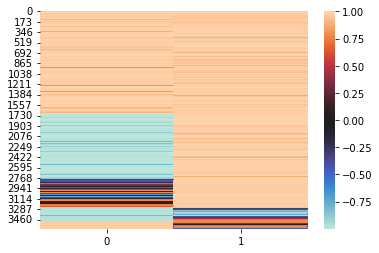

In [14]:
from collections import Counter
import numpy as np

from modisco.visualization import viz_sequence
reload(viz_sequence)
from matplotlib import pyplot as plt

import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.aggregator
reload(modisco.aggregator)

fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
#fname = "WG_Model_DeepSTARR_Dex_modisco.h5"
fname = "WG_Model_DeepSTARR_modisco.h5"
fpath = os.path.join(fdiry, fname)
hdf5_results = h5py.File(fpath,"r")

print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()
hdf5_results.close()

In [18]:
with h5py.File(fpath,"r") as hdf5_results:
    for idx in hdf5_results['metaclustering_results'].keys():
        print(idx)
    print("++++++++++++++++++++++++++++++++++")
    print(hdf5_results['metaclustering_results']['task_names'])
    tasks = hdf5_results['metaclustering_results']['task_names']
    for task in tasks:
        print(task)

activity_pattern_to_cluster_idx
all_metacluster_names
attribute_vectors
final_surviving_activity_patterns
metacluster_idx_to_activity_pattern
metacluster_indices
surviving_activity_patterns
task_name_to_value_provider
task_names
++++++++++++++++++++++++++++++++++
<HDF5 dataset "task_names": shape (1,), type "|O">
b'Dex'


Metaclusters heatmap


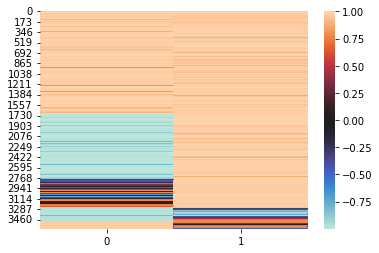

metacluster_0
activity pattern: [1 1]
metacluster_0 pattern_0
total seqlets: 638
Task 0 hypothetical scores:


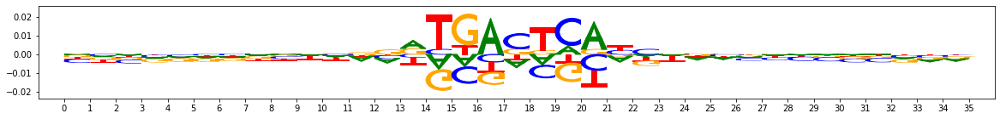

Task 0 actual importance scores:


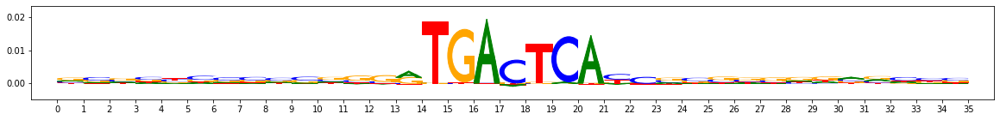

onehot, fwd and rev:


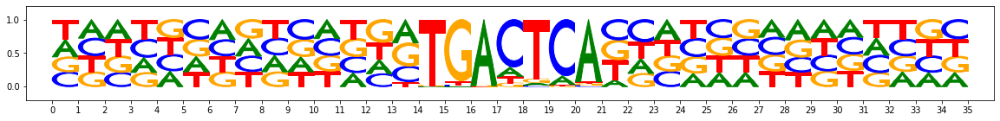

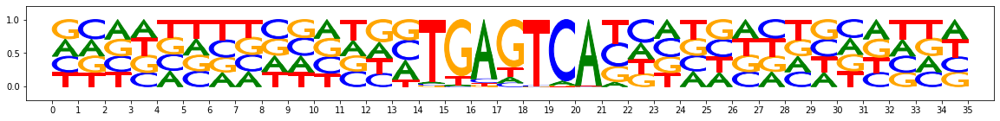

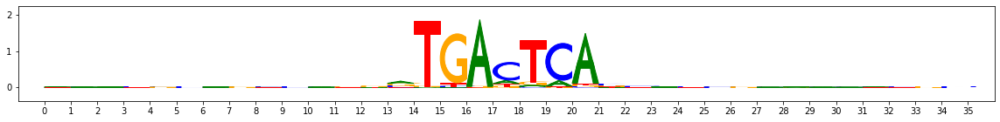

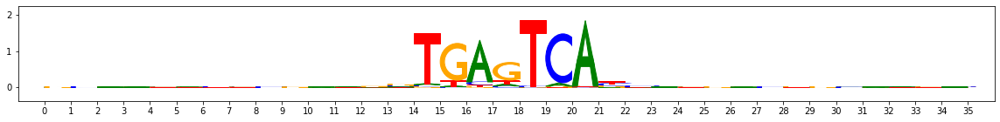

PLOTTING SUBCLUSTERS


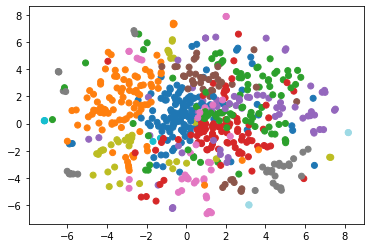

subcluster_0 size 121


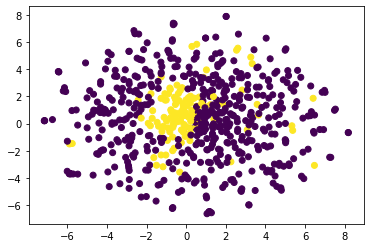

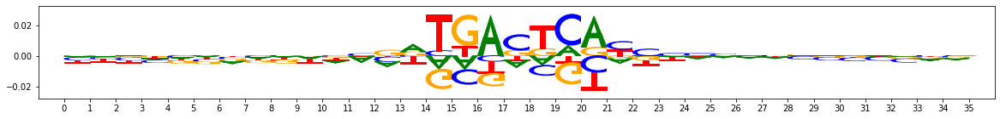

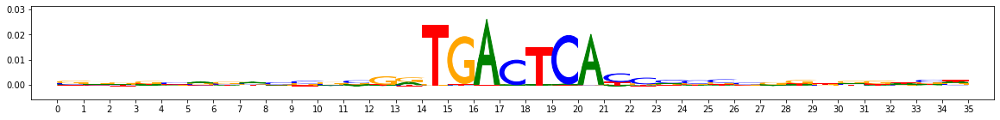

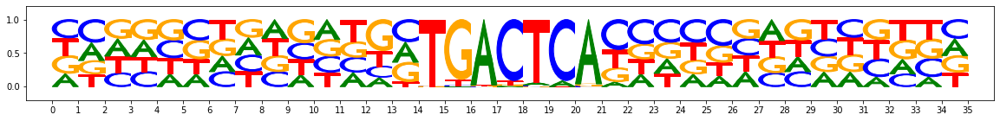

subcluster_1 size 105


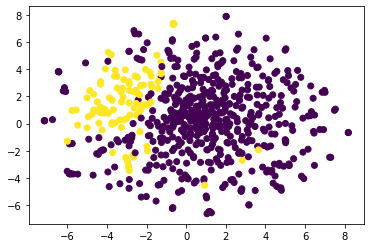

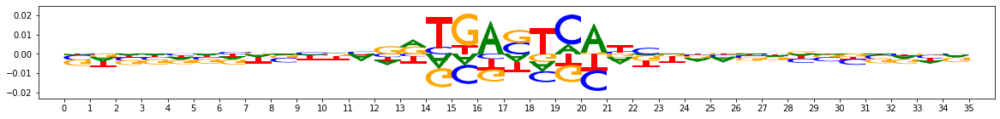

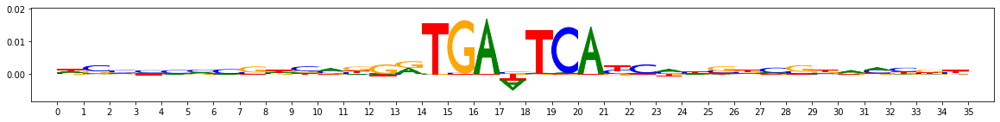

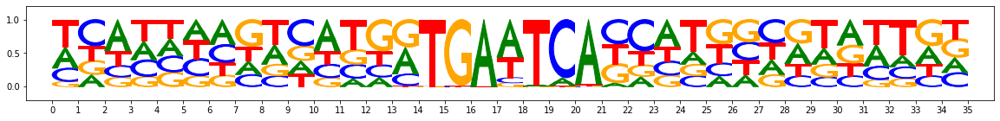

subcluster_2 size 93


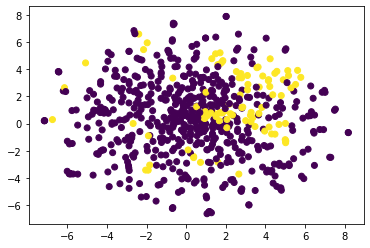

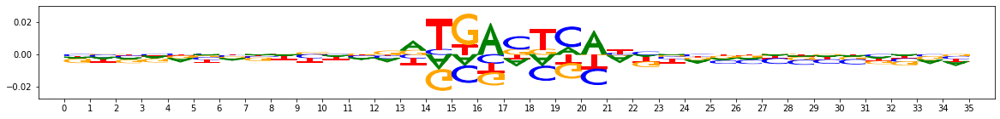

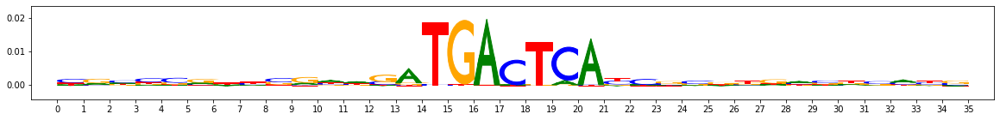

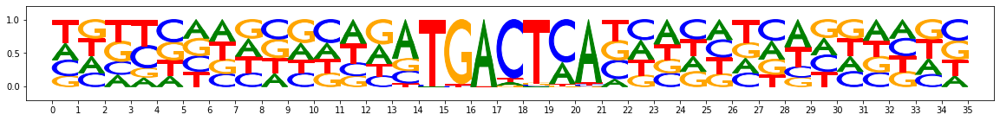

subcluster_3 size 90


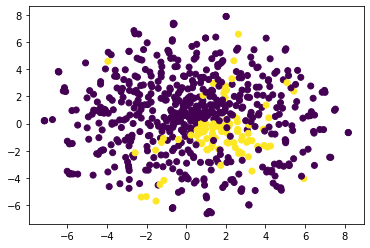

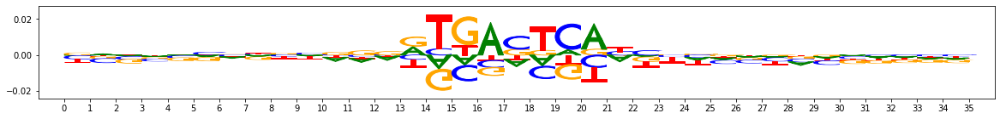

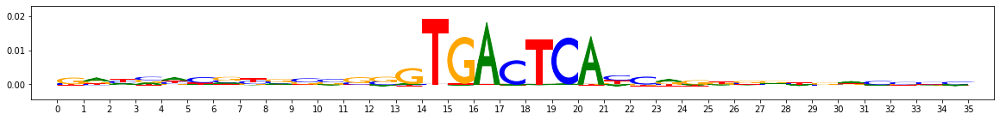

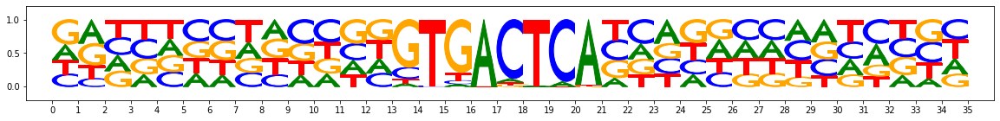

subcluster_4 size 64


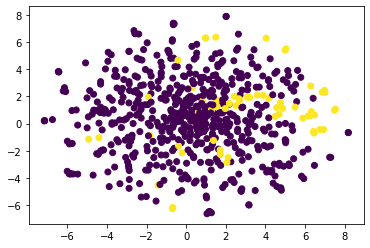

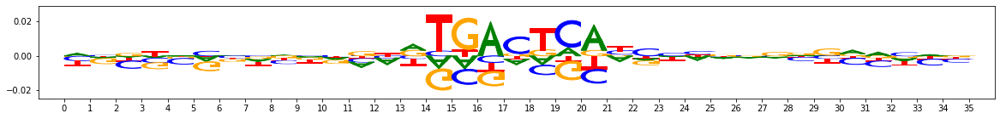

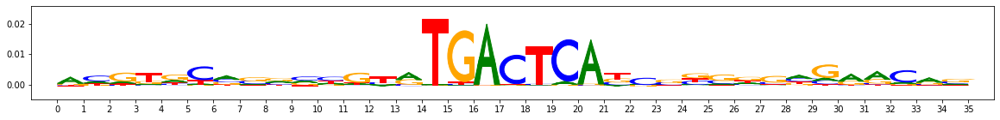

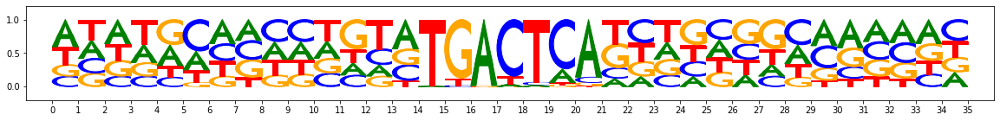

subcluster_5 size 42


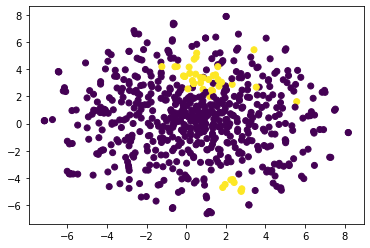

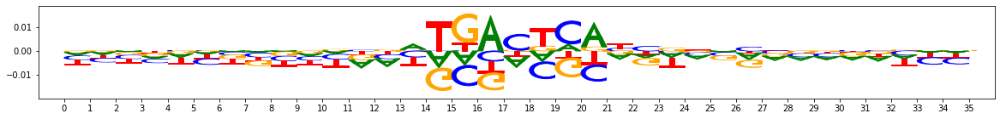

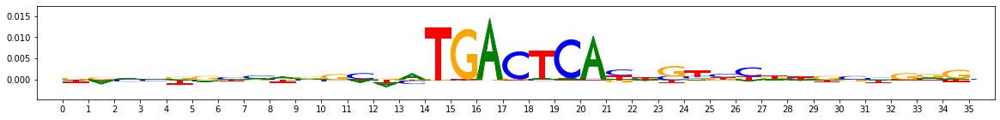

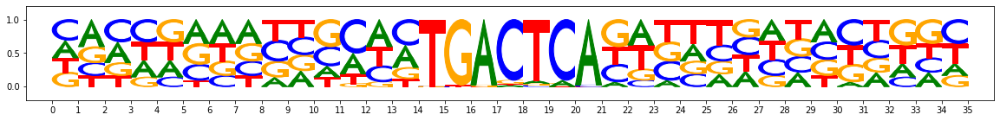

subcluster_6 size 40


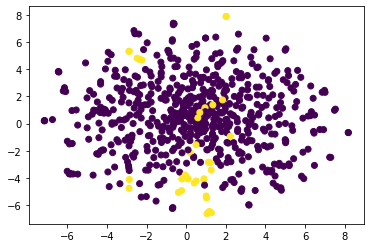

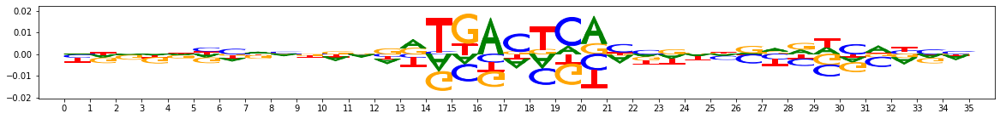

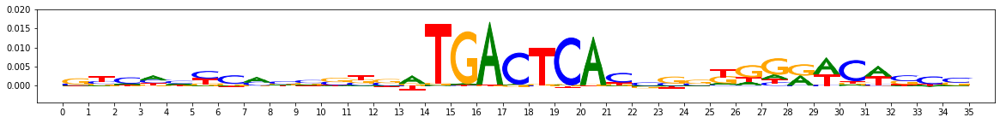

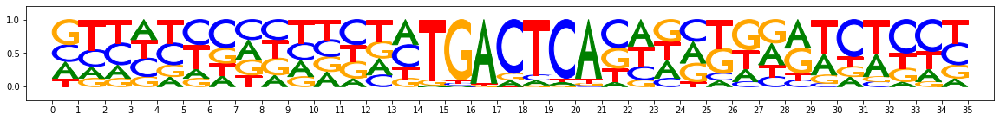

subcluster_7 size 39


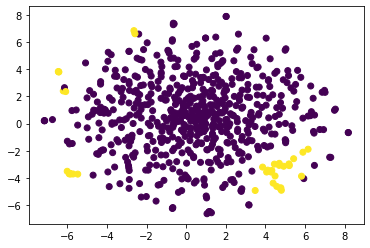

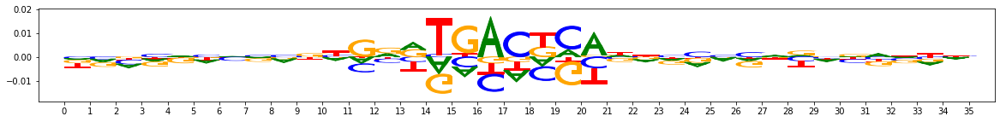

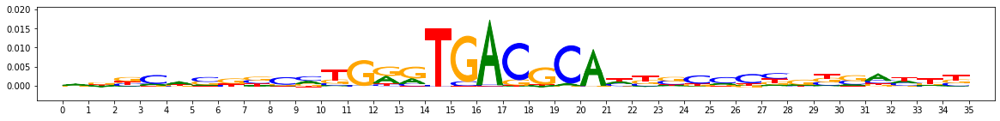

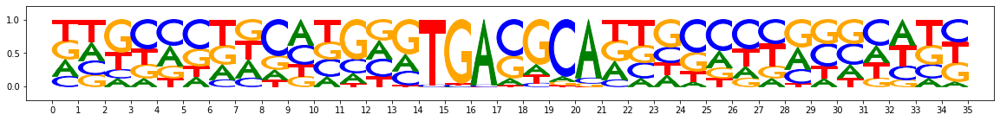

subcluster_8 size 35


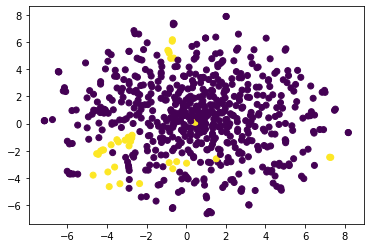

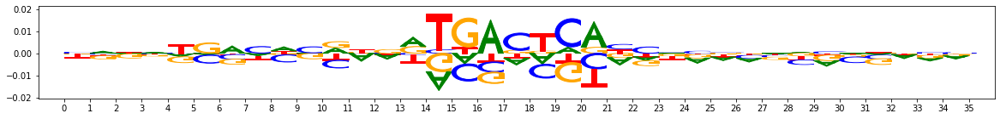

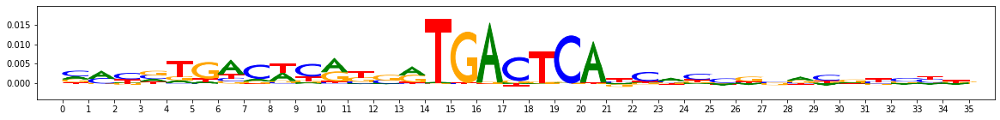

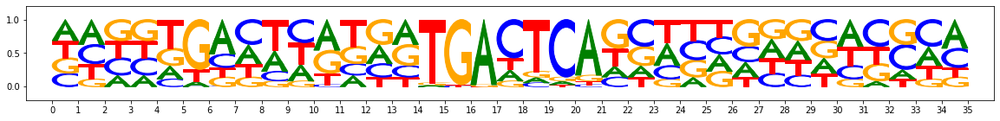

subcluster_9 size 5


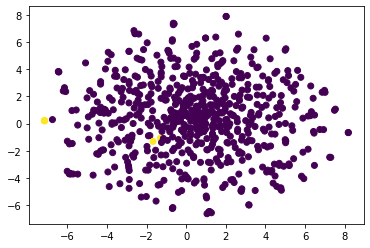

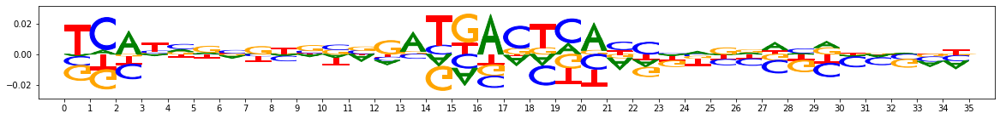

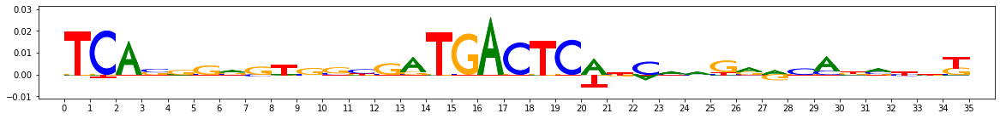

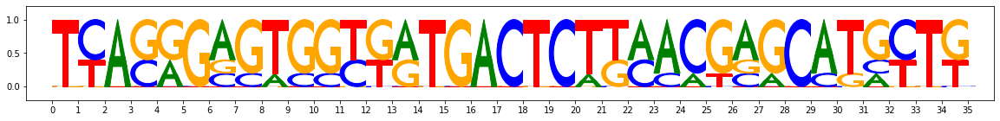

subcluster_10 size 4


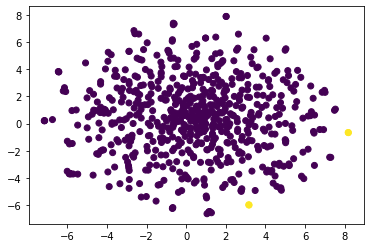

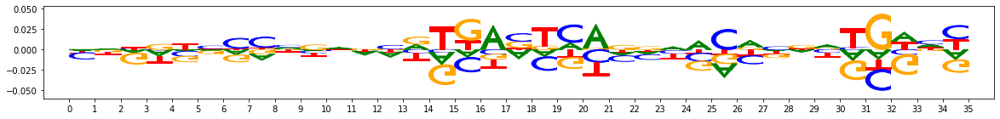

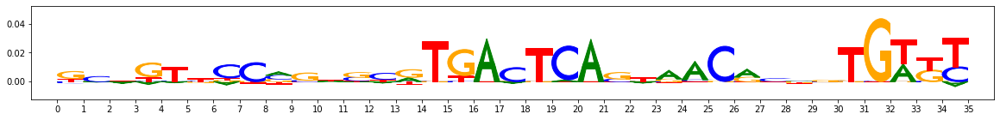

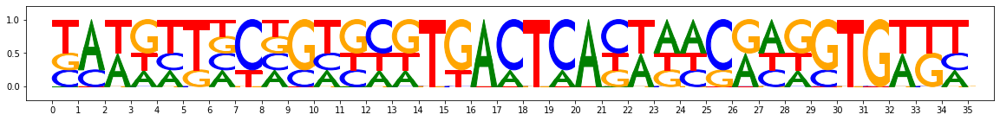

metacluster_0 pattern_1
total seqlets: 186
Task 0 hypothetical scores:


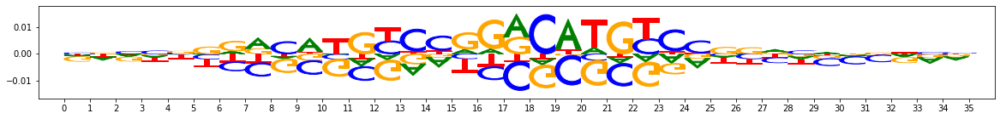

Task 0 actual importance scores:


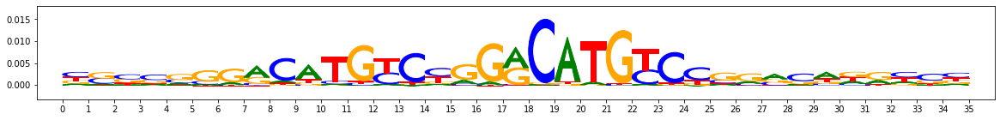

onehot, fwd and rev:


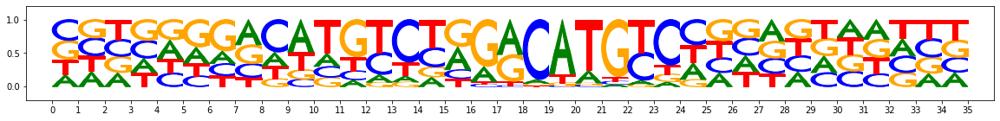

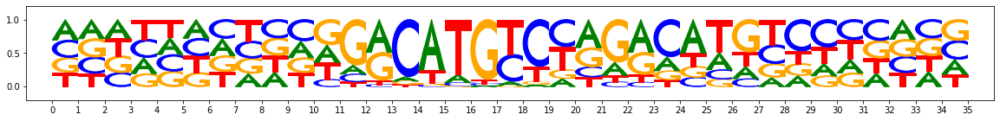

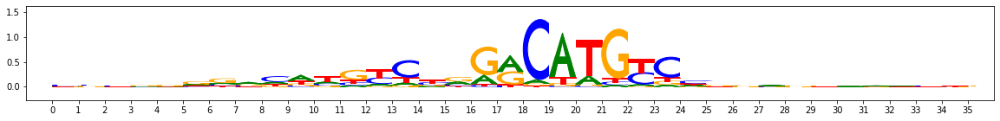

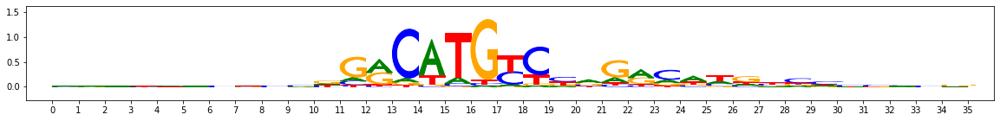

PLOTTING SUBCLUSTERS


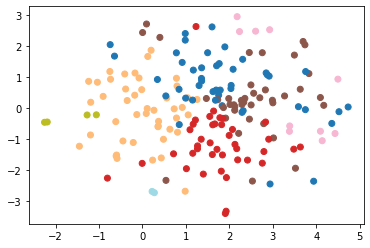

subcluster_0 size 45


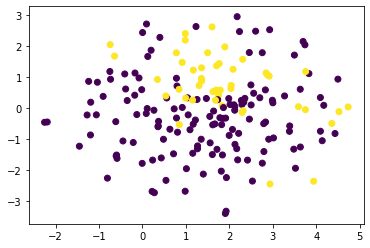

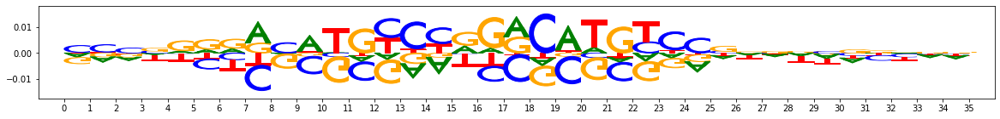

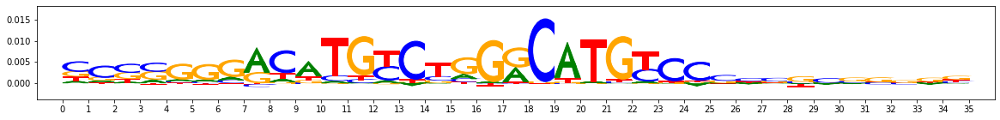

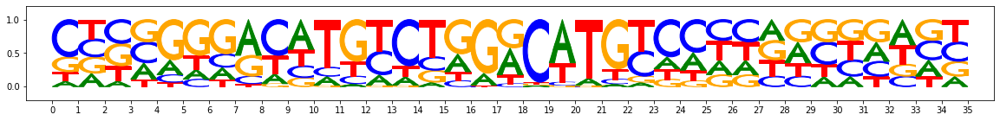

subcluster_1 size 45


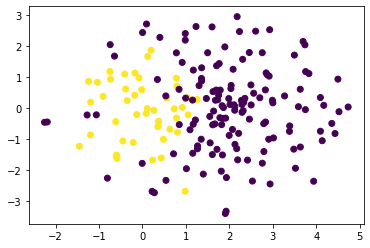

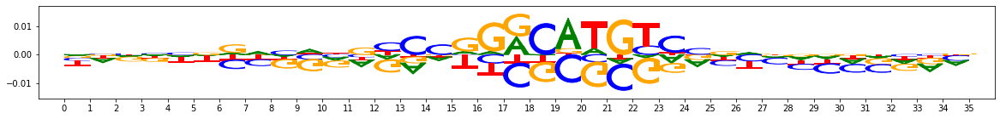

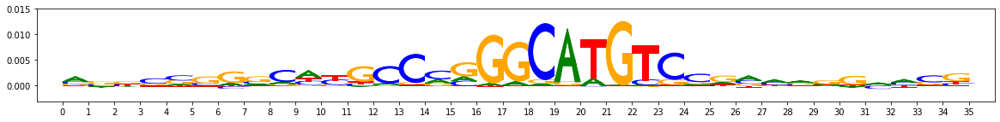

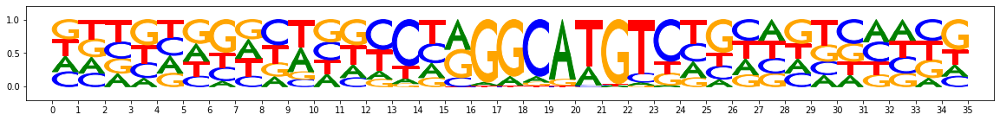

subcluster_3 size 40


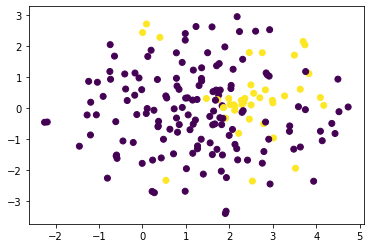

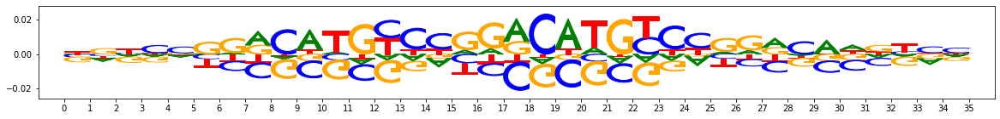

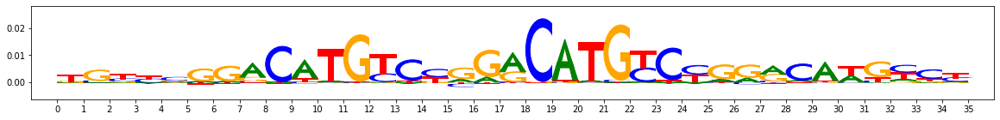

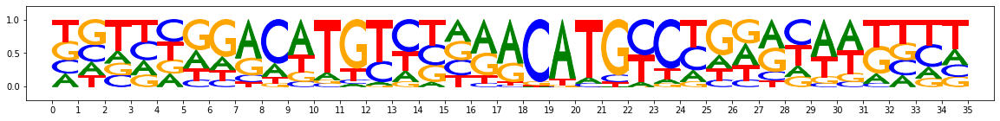

subcluster_2 size 40


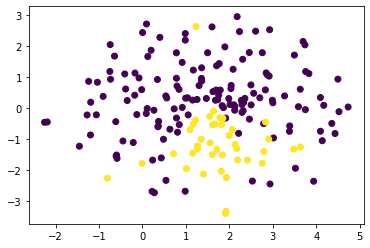

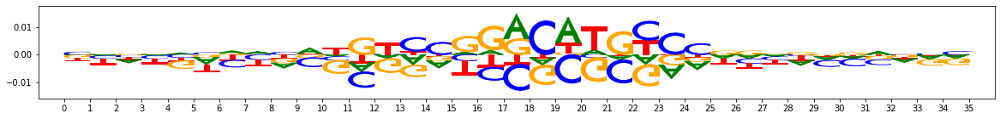

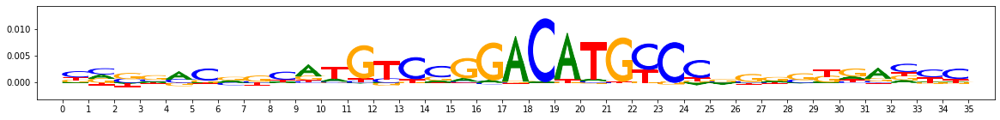

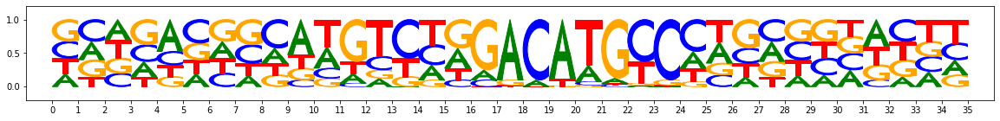

subcluster_4 size 10


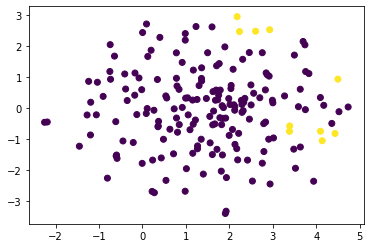

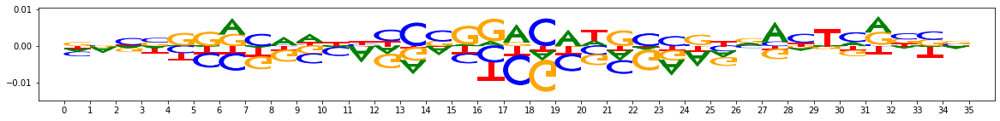

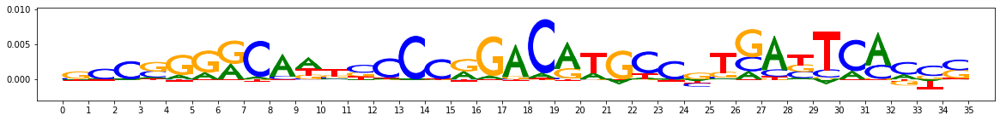

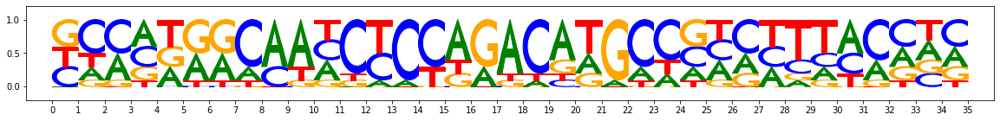

subcluster_5 size 4


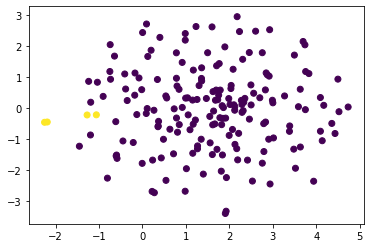

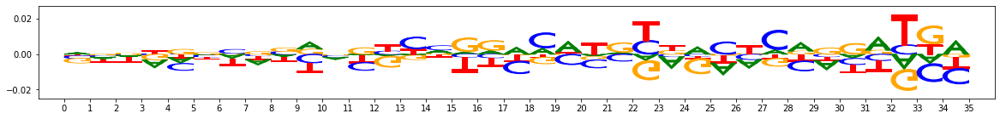

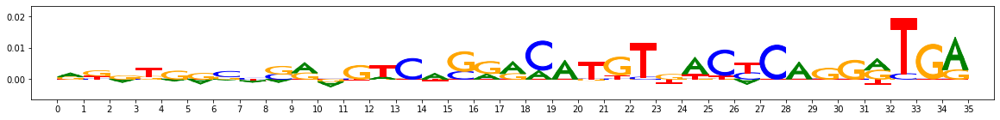

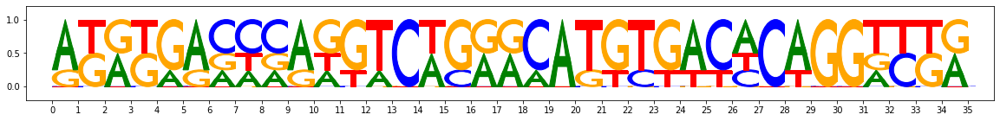

subcluster_6 size 2


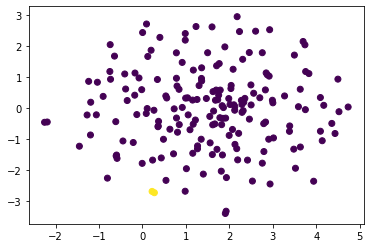

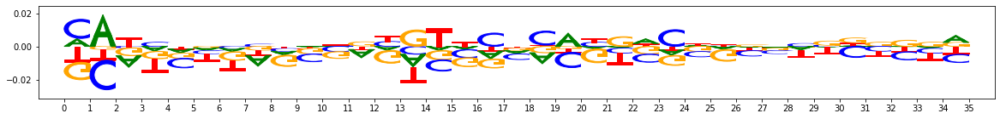

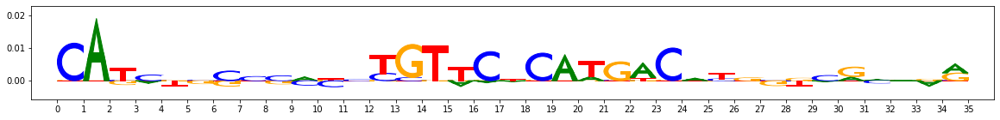

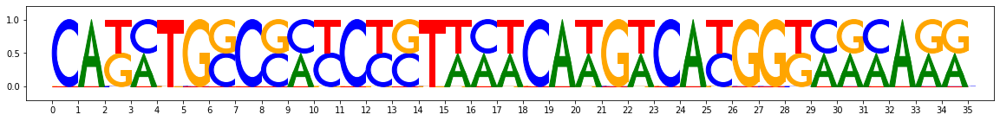

metacluster_0 pattern_2
total seqlets: 146
Task 0 hypothetical scores:


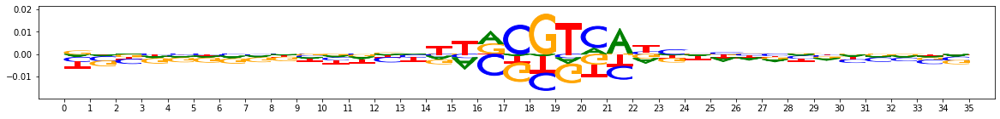

Task 0 actual importance scores:


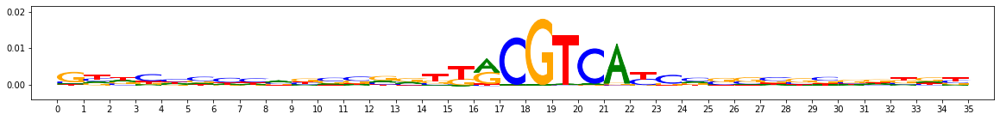

onehot, fwd and rev:


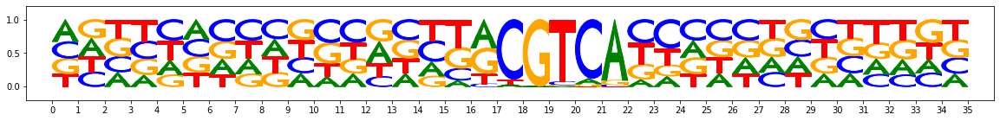

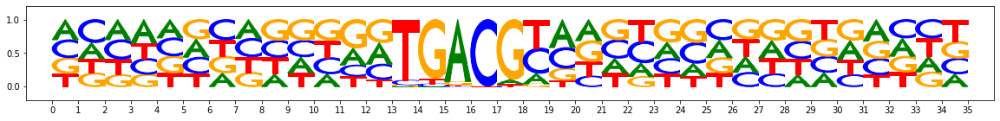

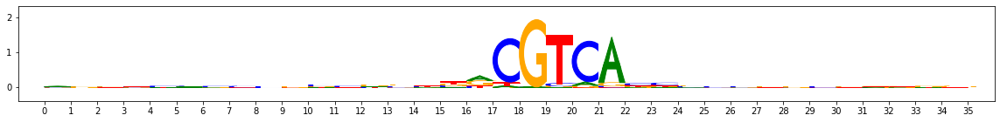

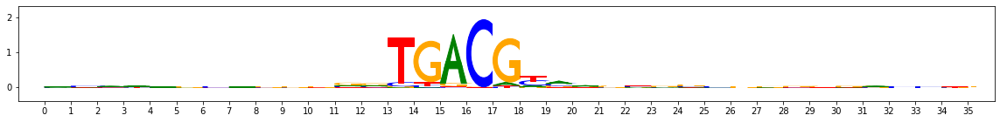

PLOTTING SUBCLUSTERS


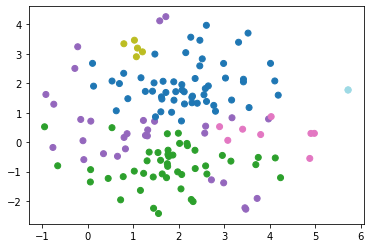

subcluster_0 size 55


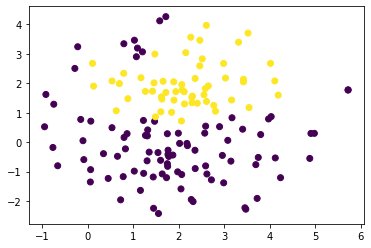

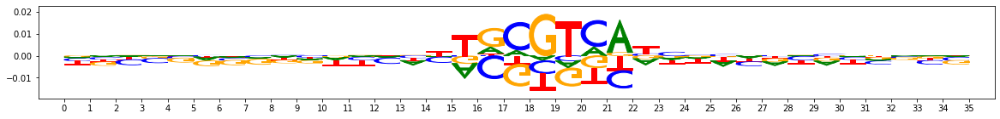

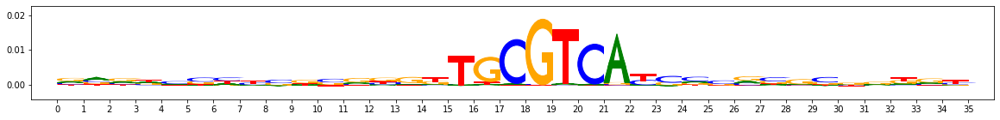

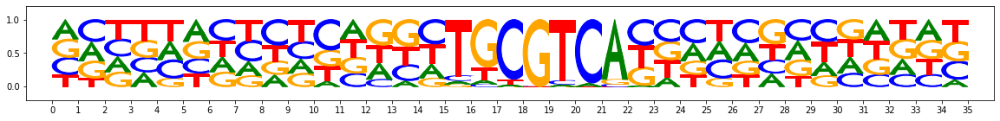

subcluster_1 size 46


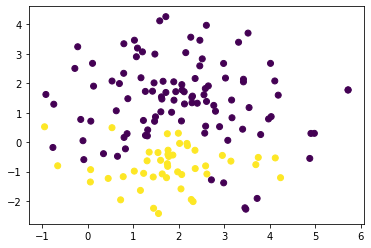

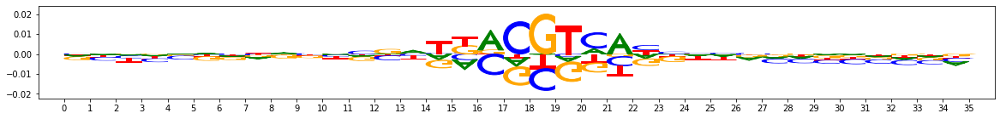

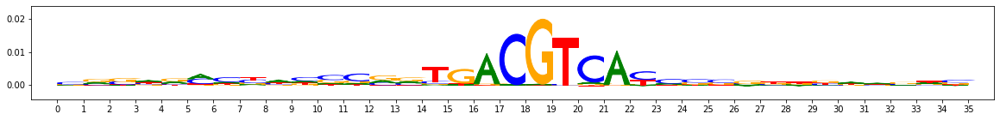

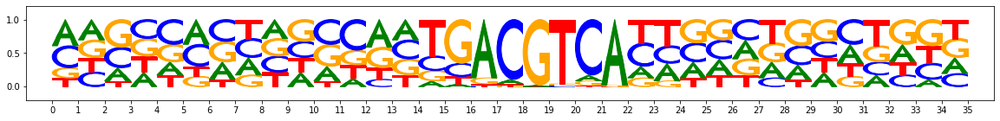

subcluster_2 size 30


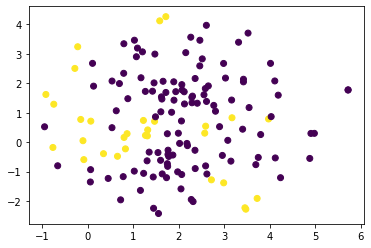

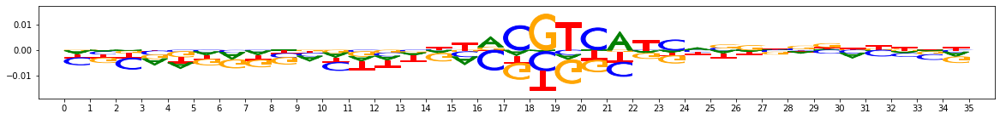

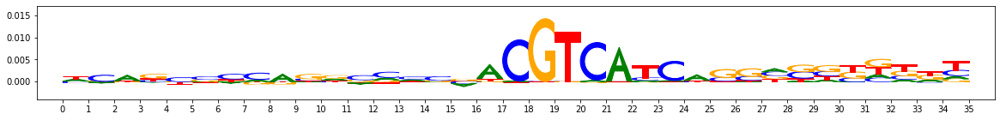

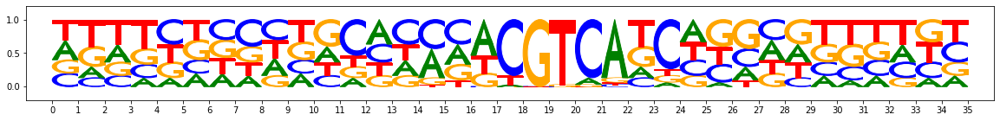

subcluster_3 size 8


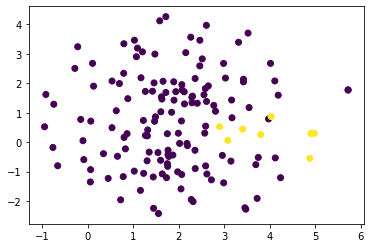

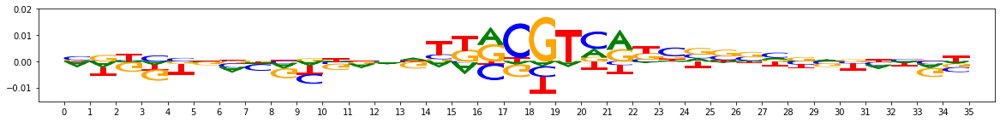

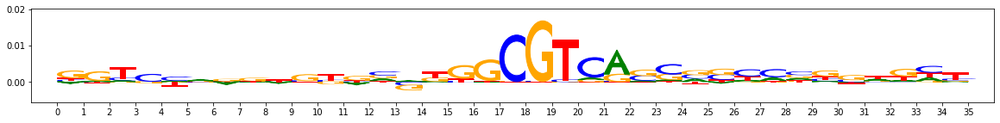

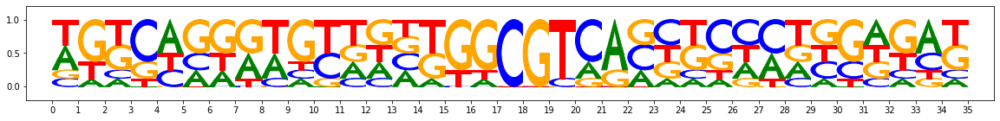

subcluster_4 size 5


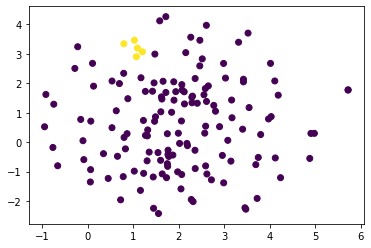

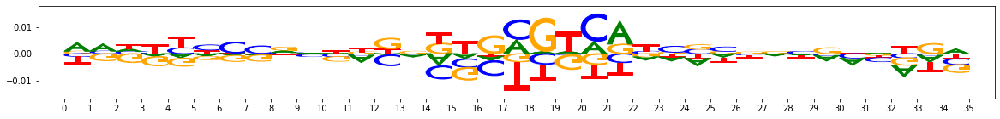

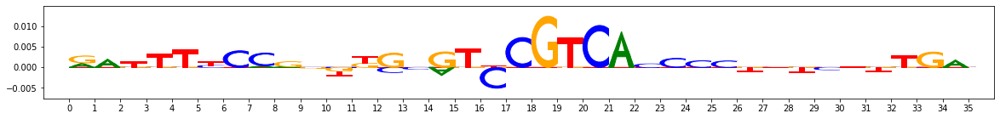

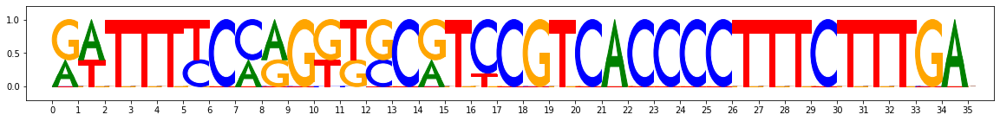

subcluster_5 size 2


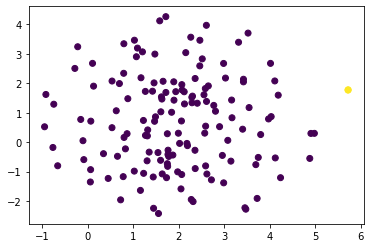

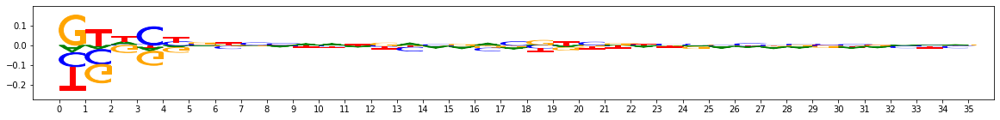

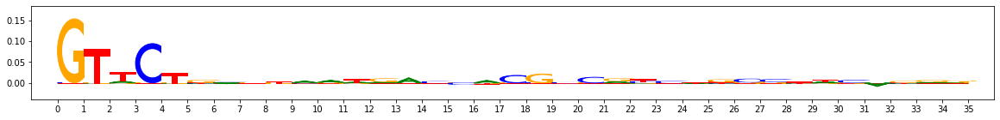

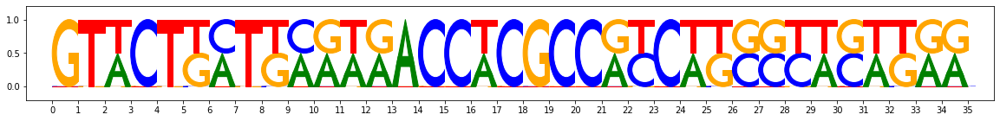

metacluster_0 pattern_3
total seqlets: 126
Task 0 hypothetical scores:


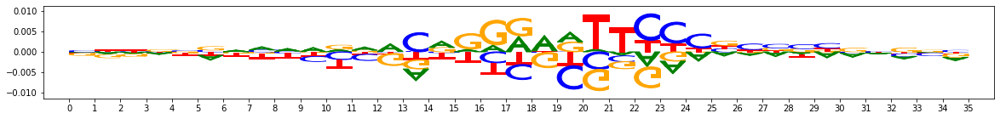

Task 0 actual importance scores:


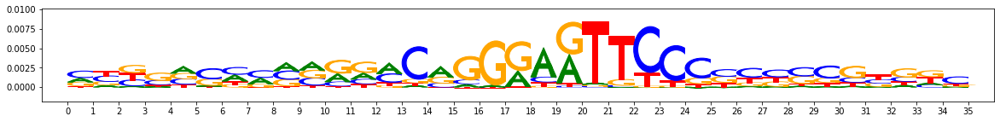

onehot, fwd and rev:


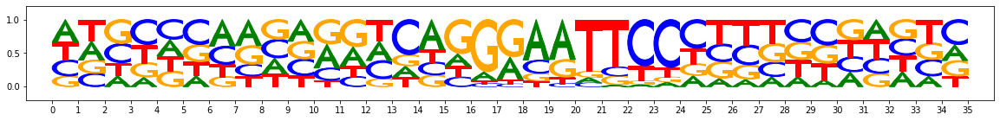

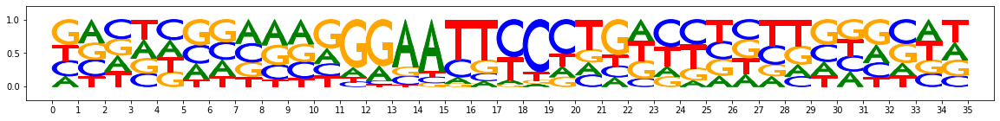

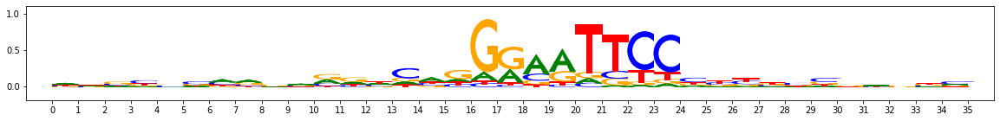

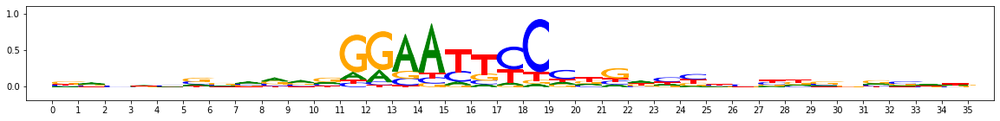

PLOTTING SUBCLUSTERS


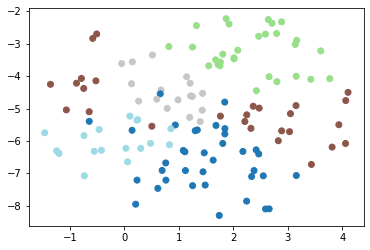

subcluster_0 size 36


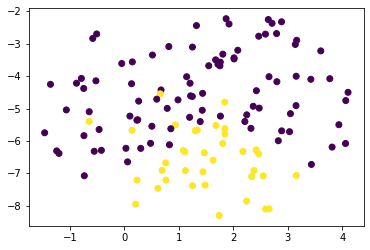

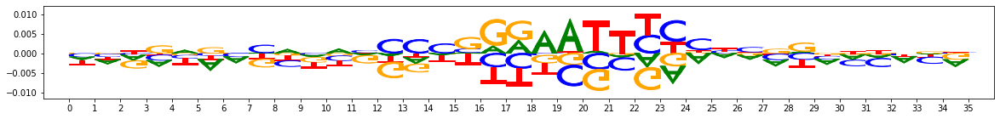

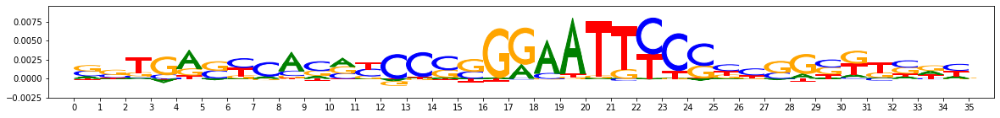

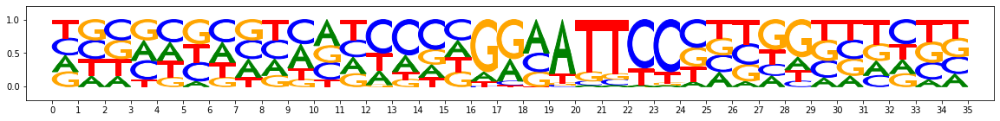

subcluster_1 size 29


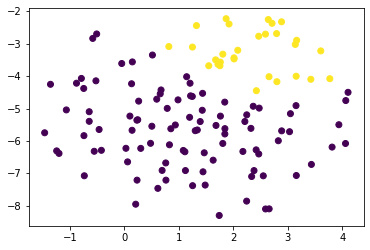

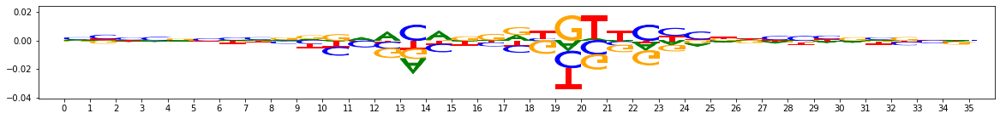

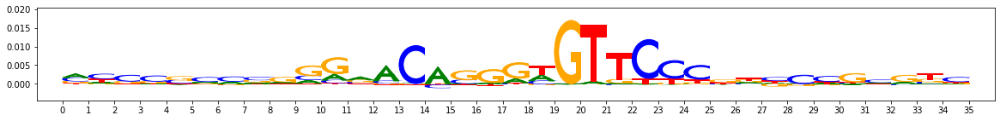

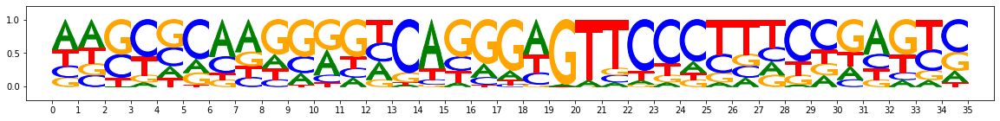

subcluster_2 size 27


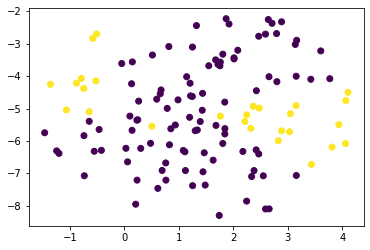

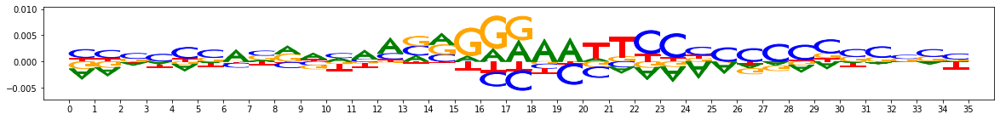

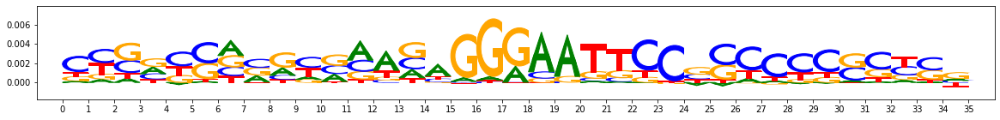

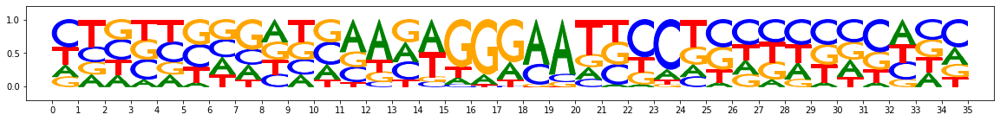

subcluster_4 size 17


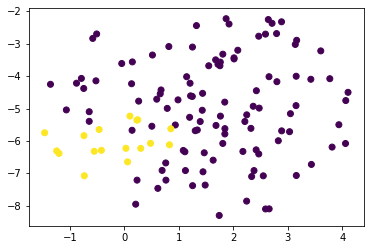

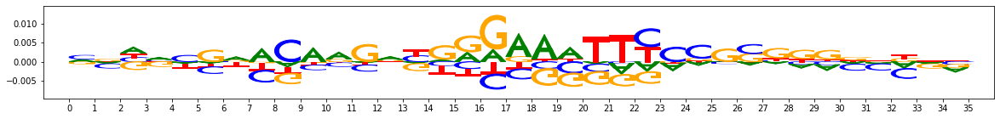

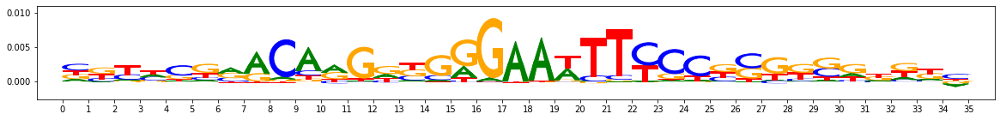

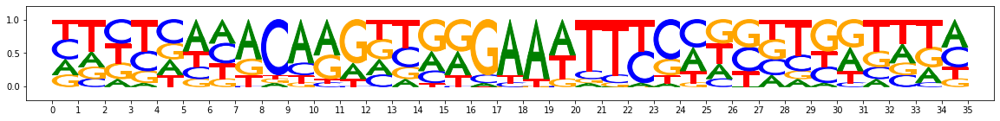

subcluster_3 size 17


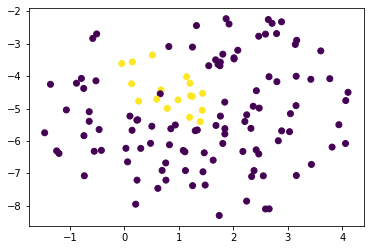

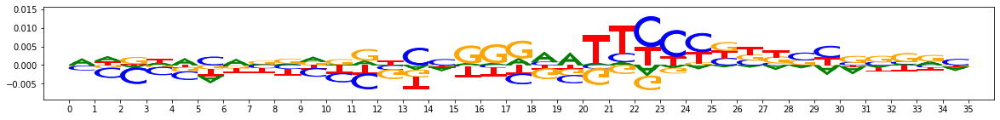

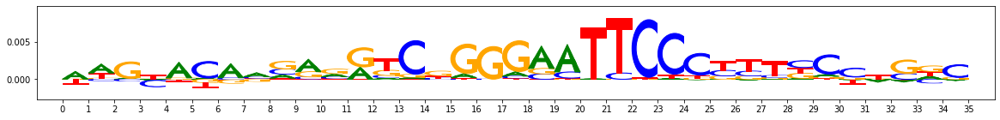

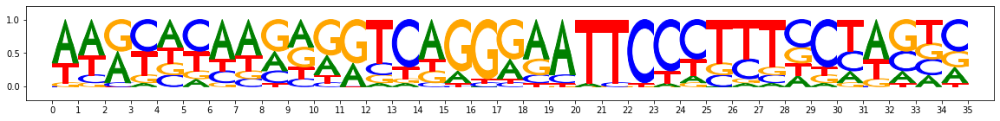

metacluster_0 pattern_4
total seqlets: 118
Task 0 hypothetical scores:


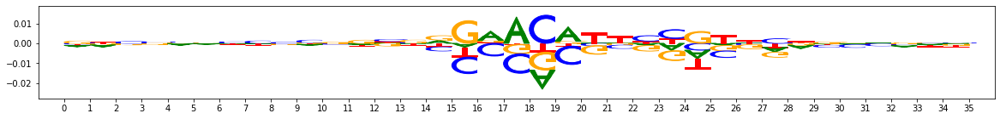

Task 0 actual importance scores:


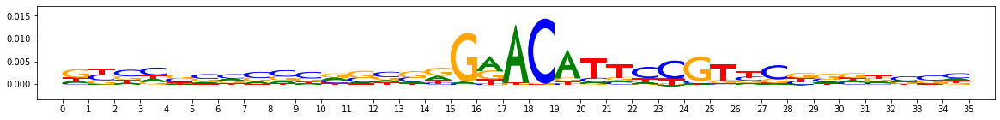

onehot, fwd and rev:


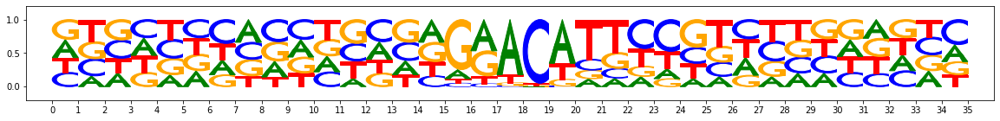

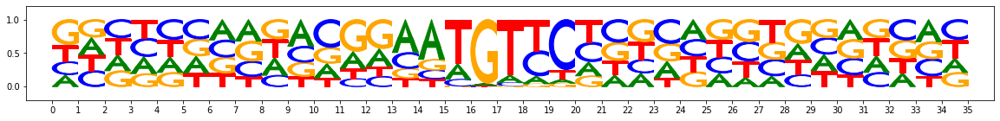

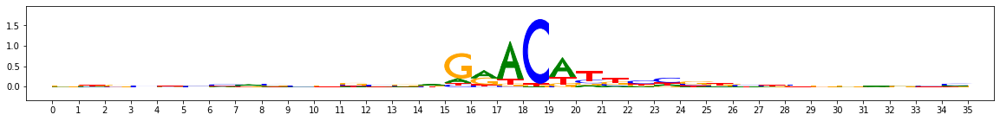

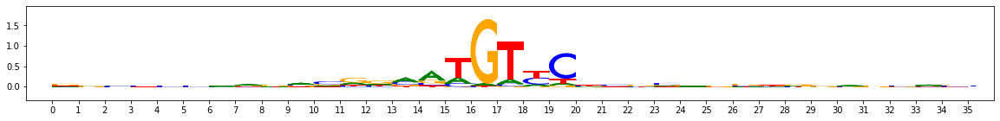

PLOTTING SUBCLUSTERS


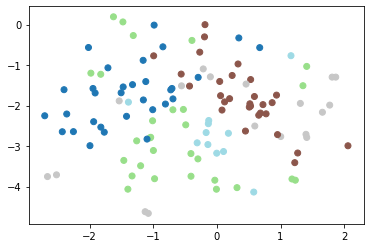

subcluster_0 size 31


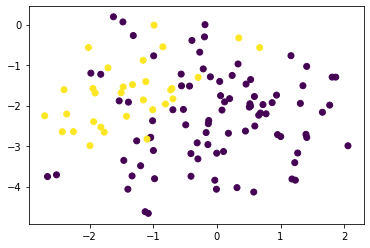

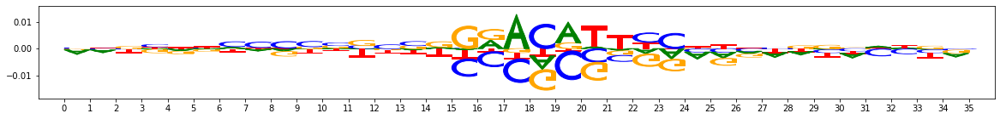

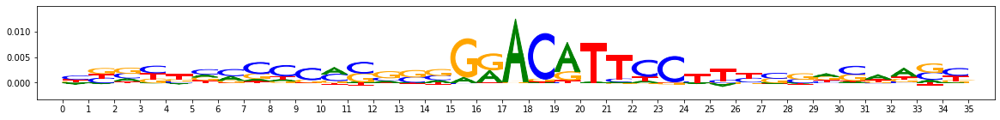

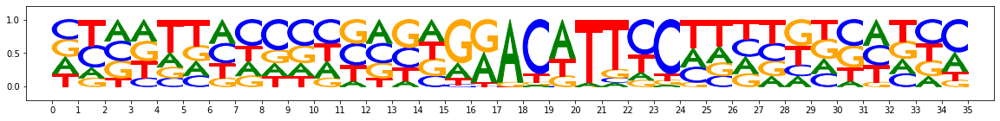

subcluster_2 size 29


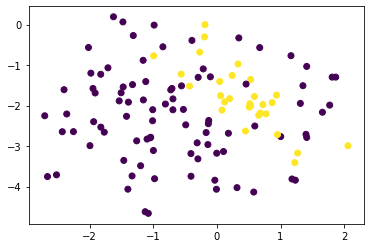

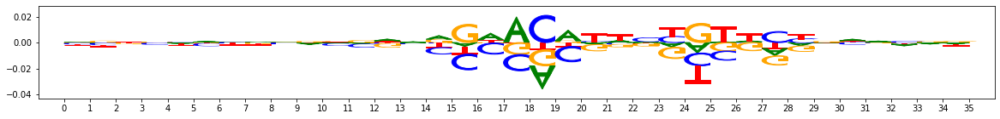

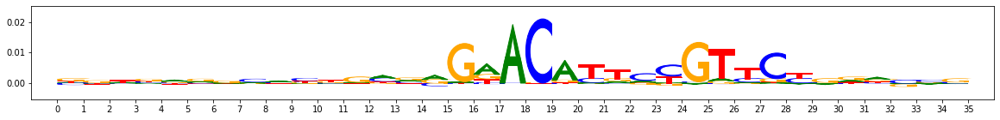

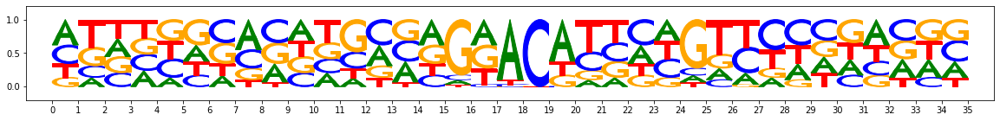

subcluster_1 size 29


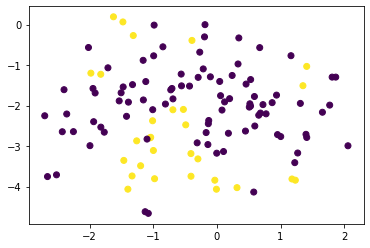

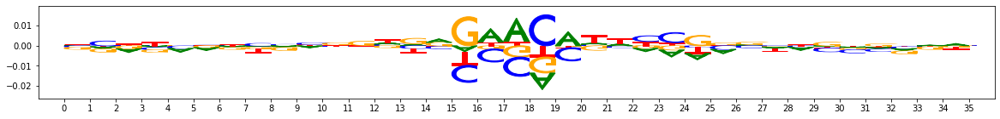

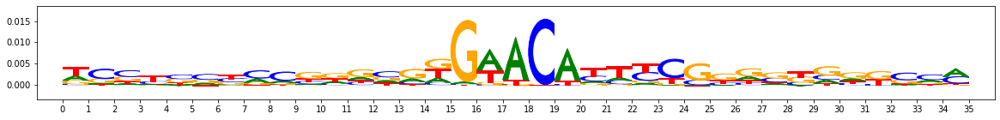

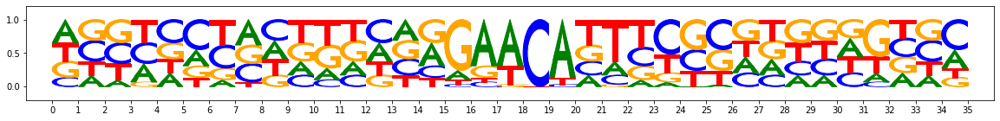

subcluster_3 size 18


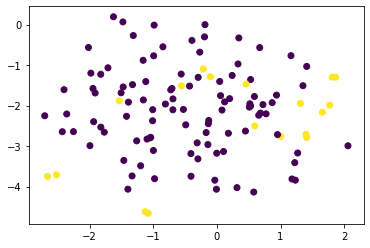

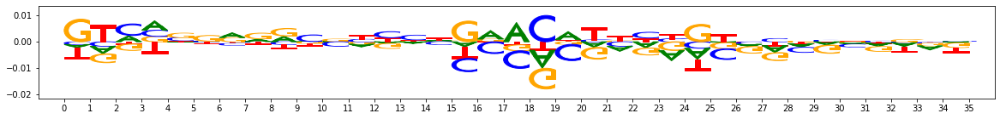

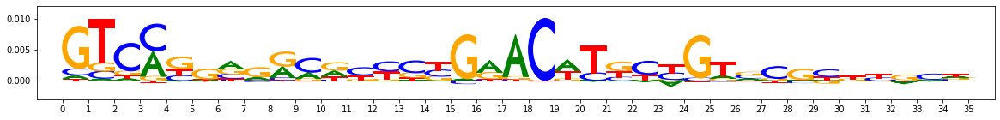

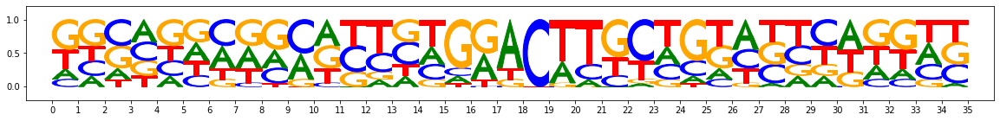

subcluster_4 size 11


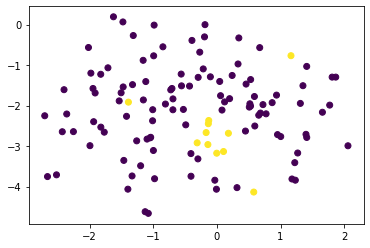

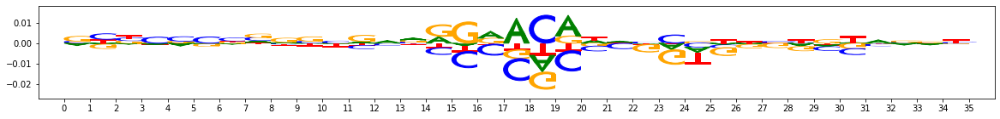

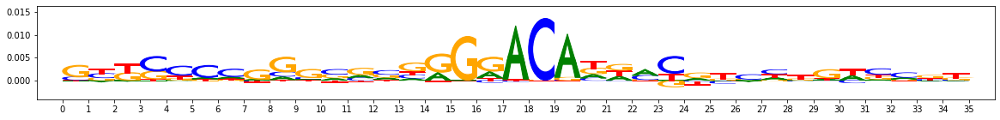

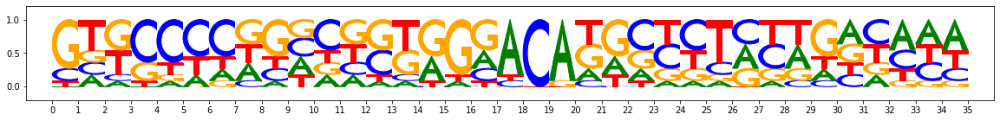

metacluster_0 pattern_5
total seqlets: 95
Task 0 hypothetical scores:


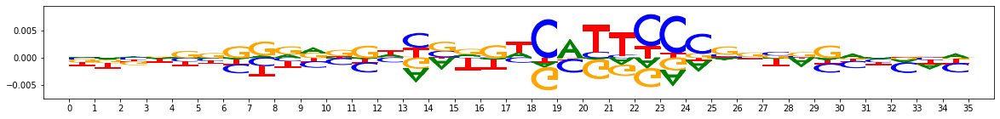

Task 0 actual importance scores:


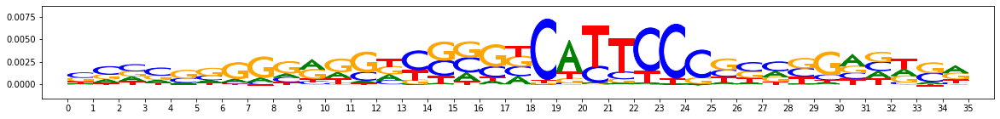

onehot, fwd and rev:


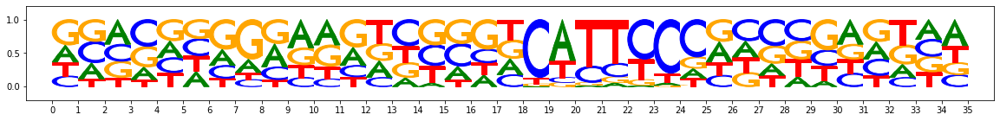

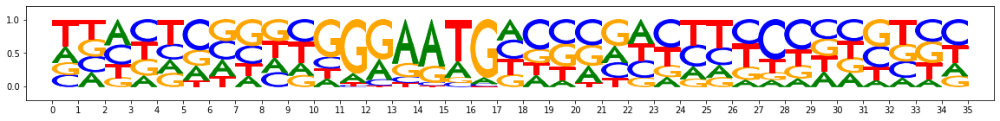

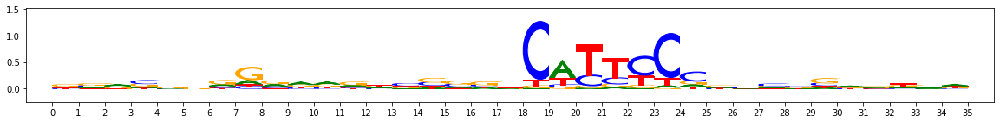

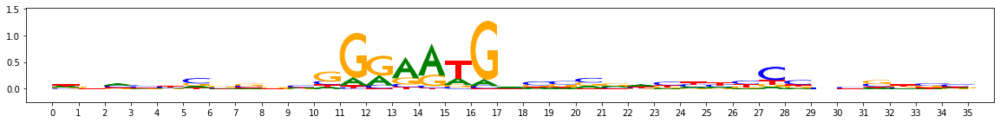

PLOTTING SUBCLUSTERS


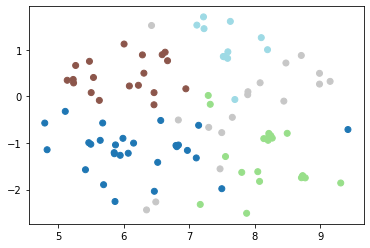

subcluster_0 size 28


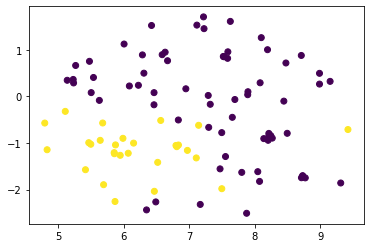

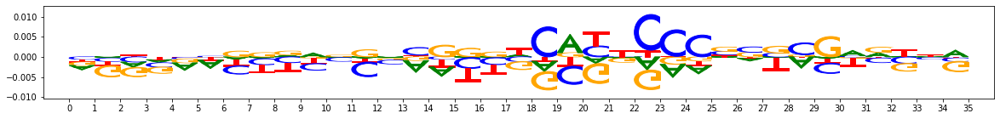

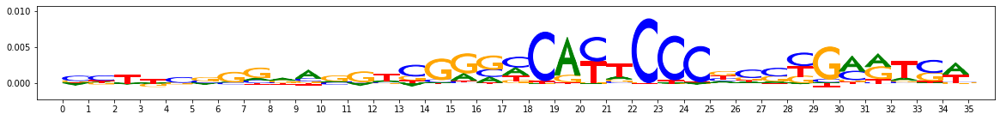

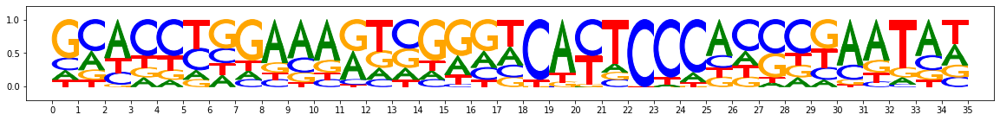

subcluster_1 size 20


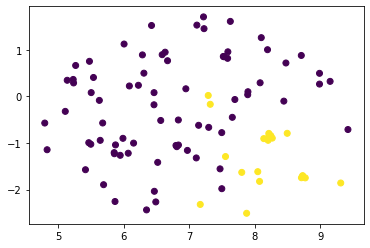

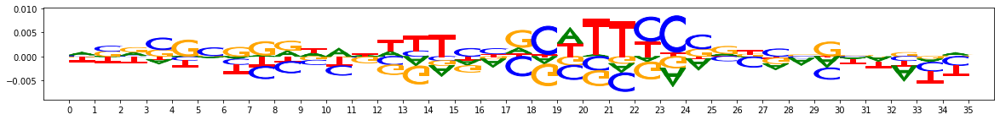

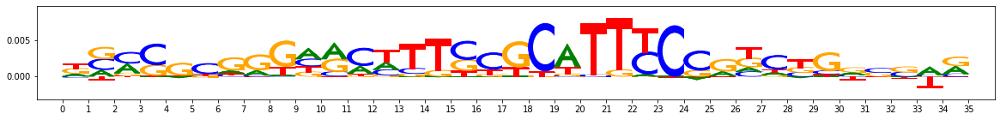

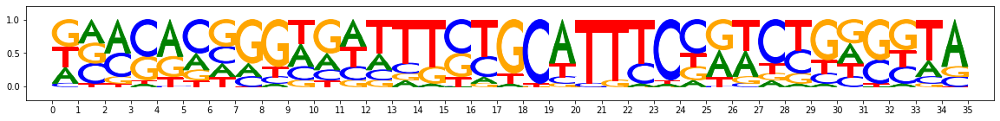

subcluster_2 size 19


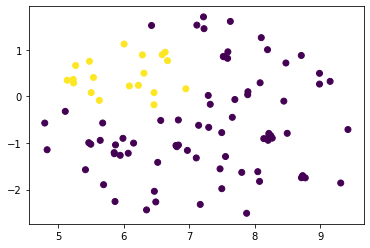

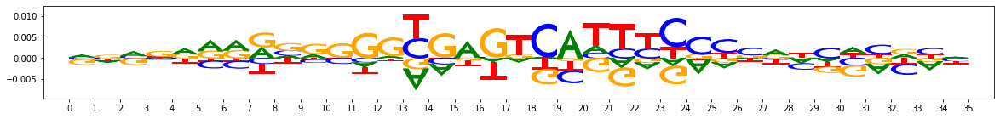

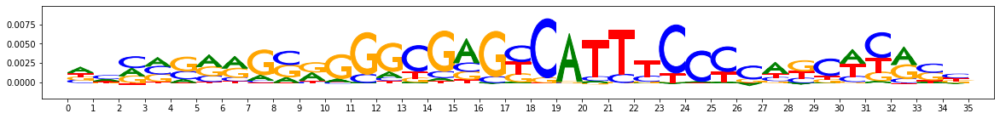

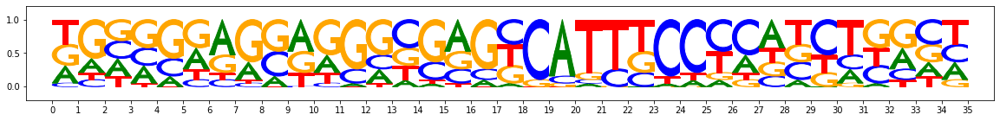

subcluster_3 size 17


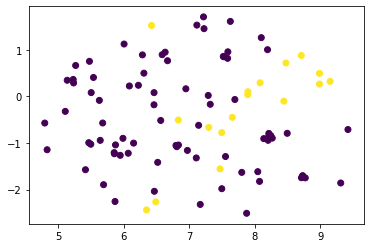

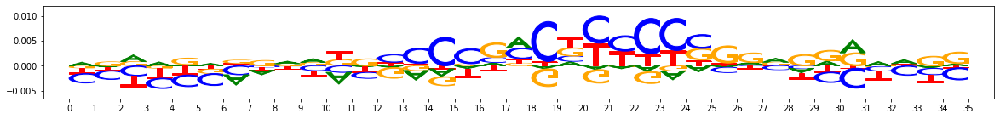

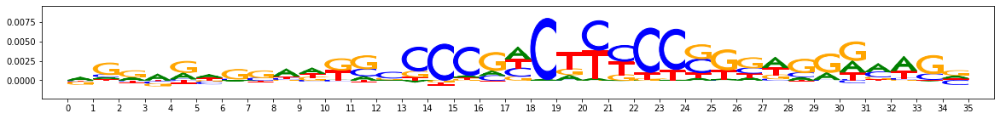

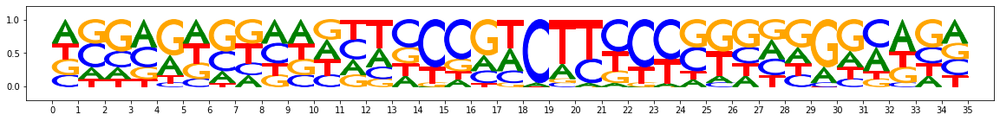

subcluster_4 size 11


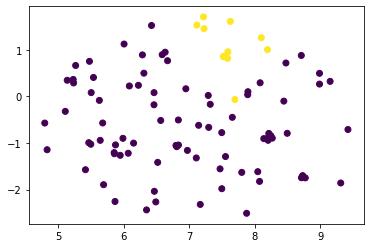

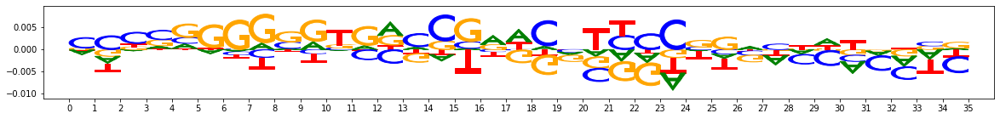

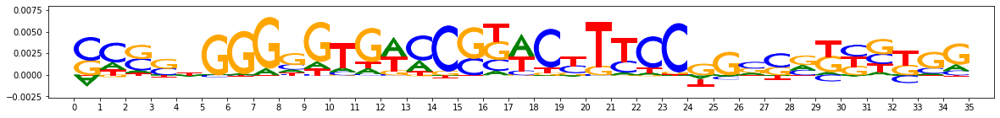

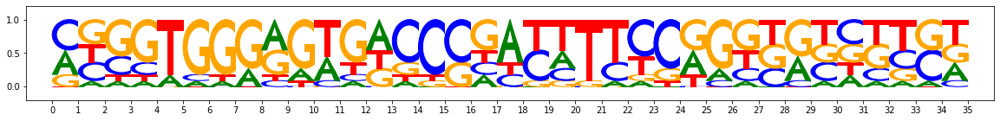

metacluster_0 pattern_6
total seqlets: 64
Task 0 hypothetical scores:


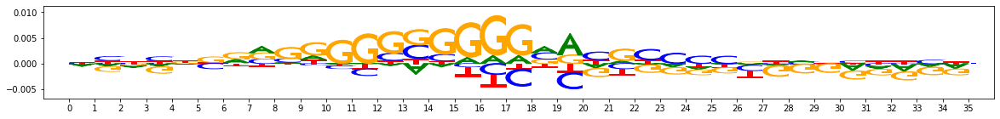

Task 0 actual importance scores:


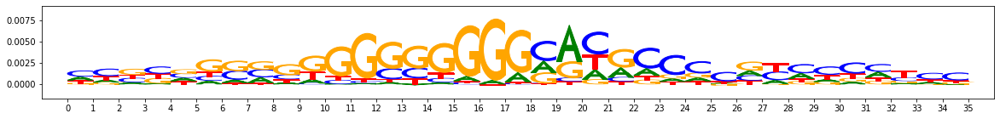

onehot, fwd and rev:


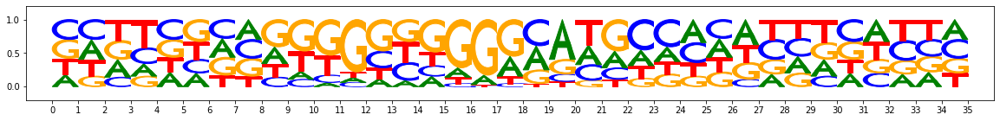

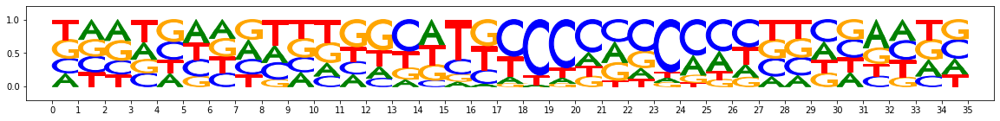

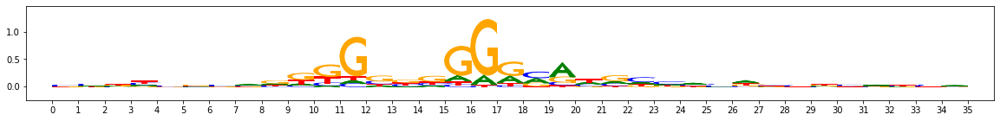

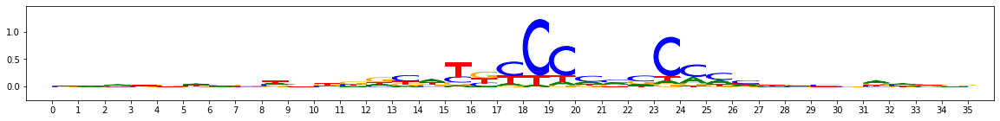

PLOTTING SUBCLUSTERS


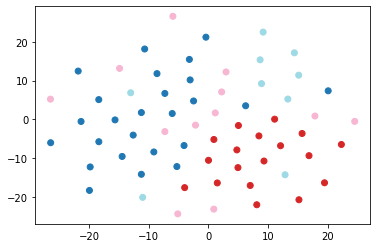

subcluster_0 size 25


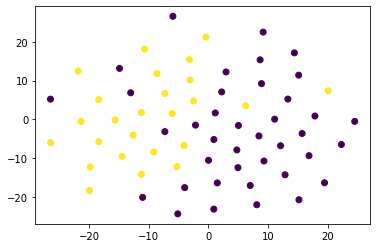

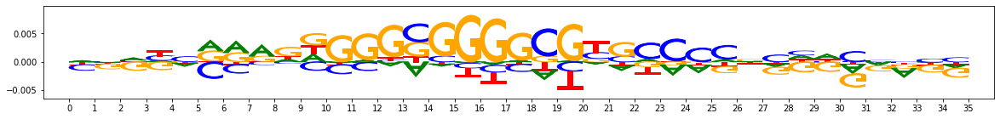

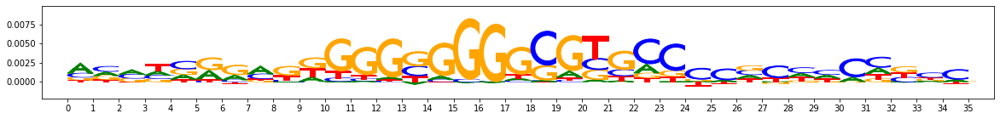

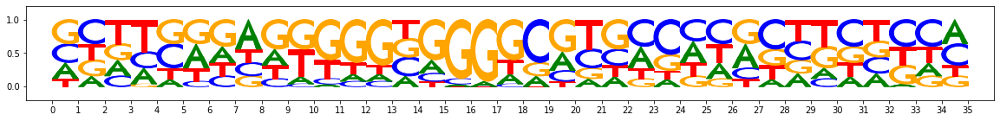

subcluster_1 size 18


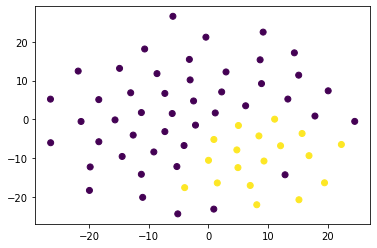

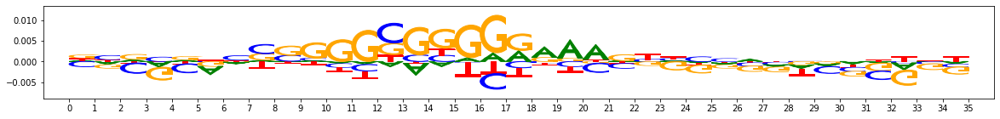

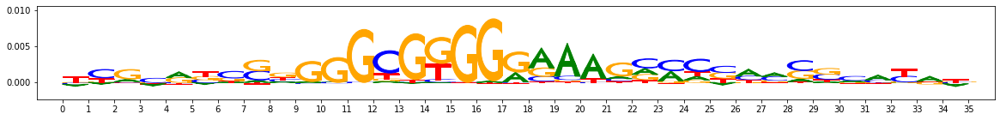

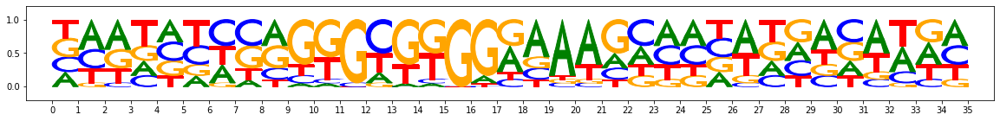

subcluster_2 size 12


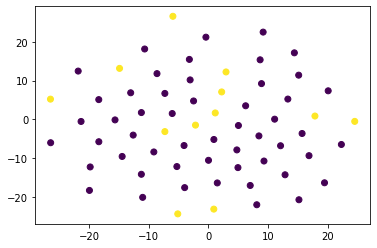

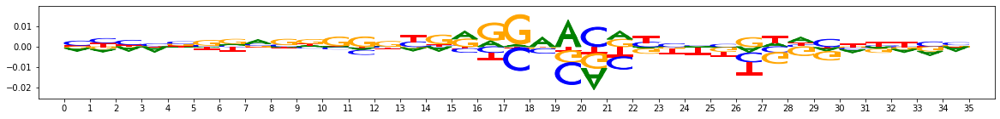

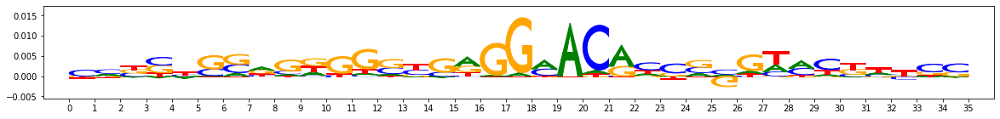

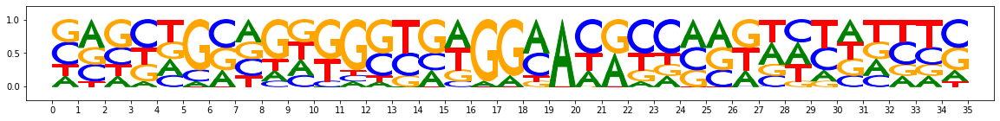

subcluster_3 size 9


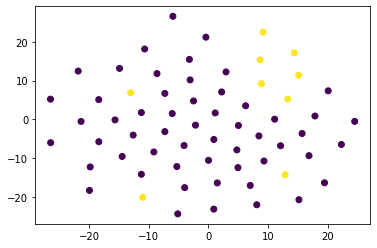

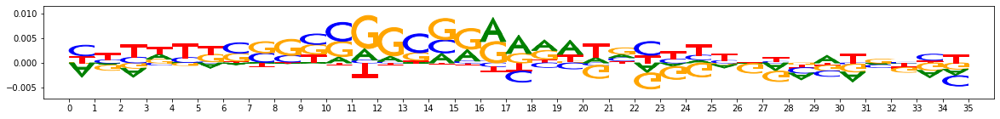

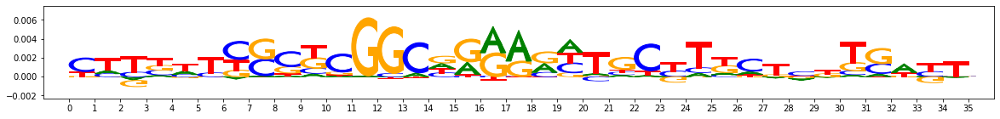

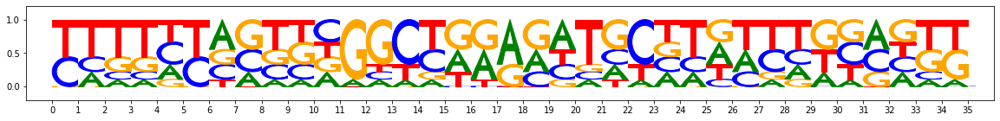

metacluster_1
activity pattern: [-1  1]
metacluster_1 pattern_0
total seqlets: 875
Task 0 hypothetical scores:


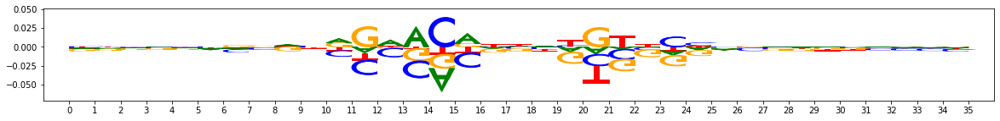

Task 0 actual importance scores:


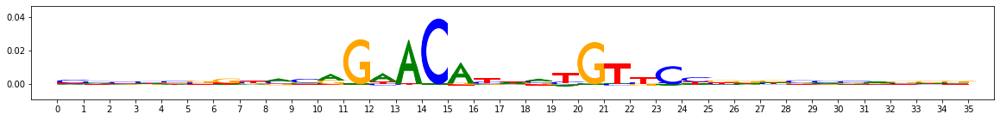

onehot, fwd and rev:


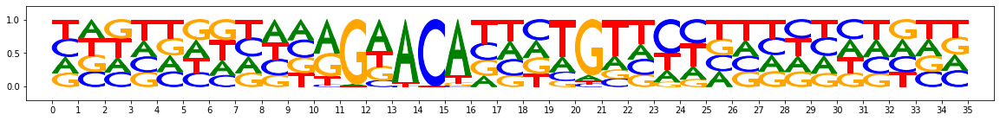

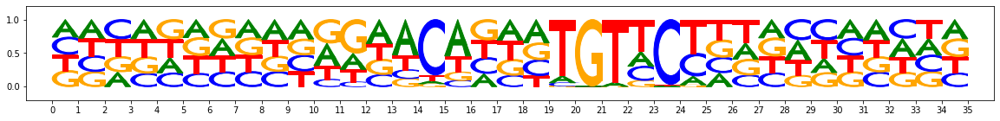

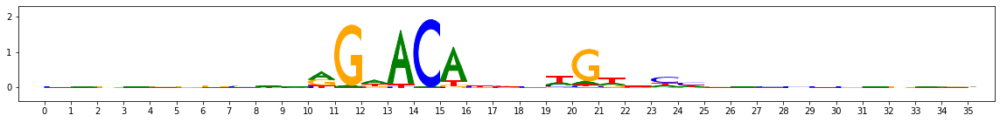

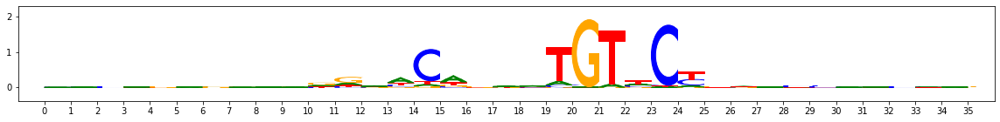

PLOTTING SUBCLUSTERS


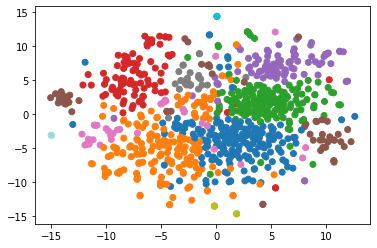

subcluster_0 size 192


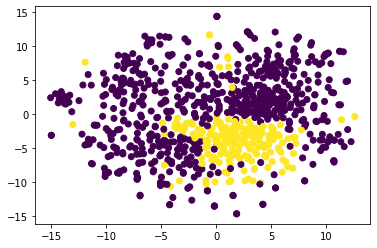

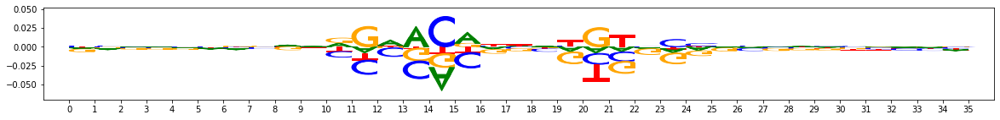

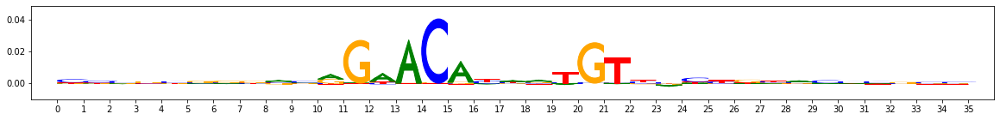

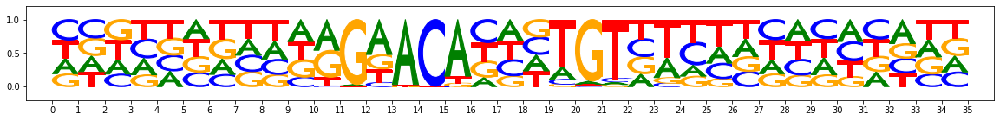

subcluster_1 size 175


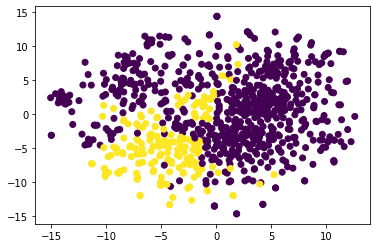

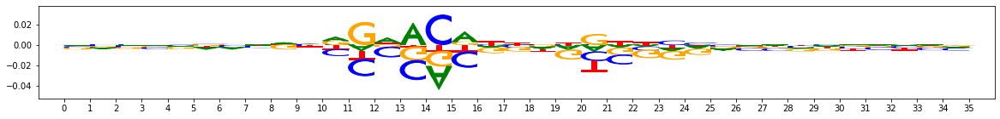

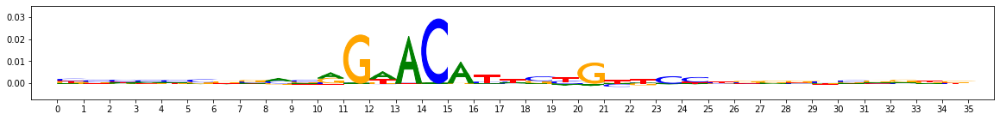

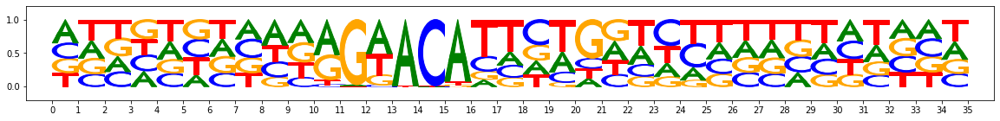

subcluster_2 size 172


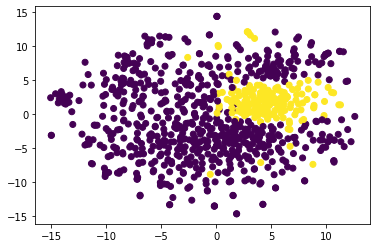

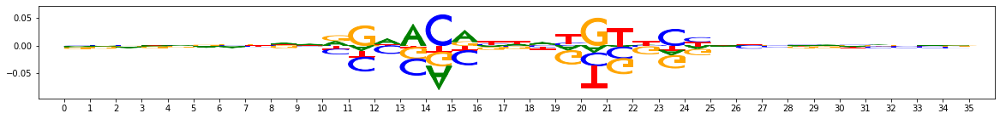

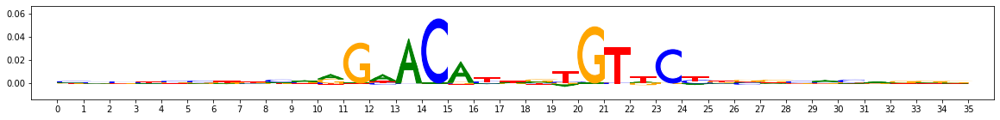

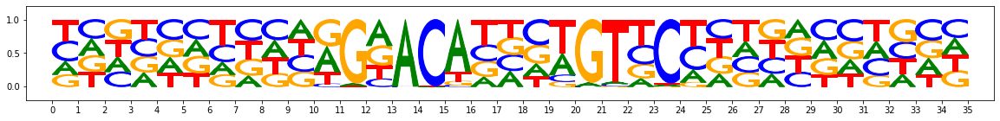

subcluster_3 size 107


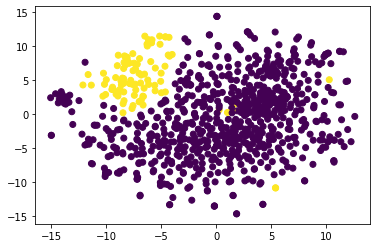

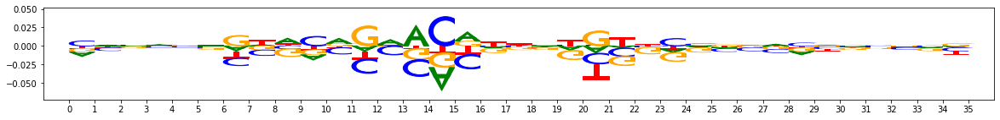

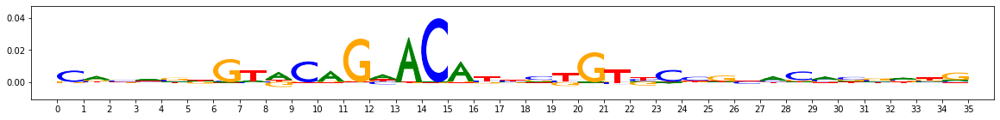

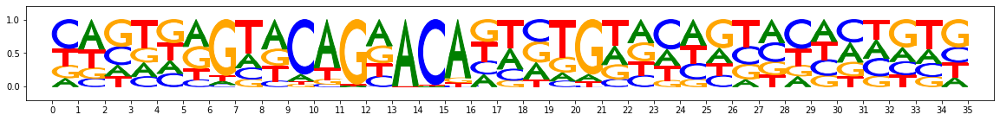

subcluster_4 size 94


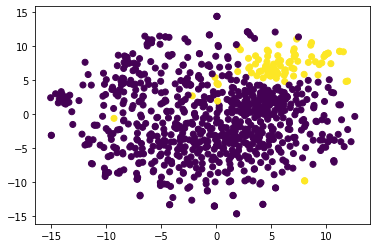

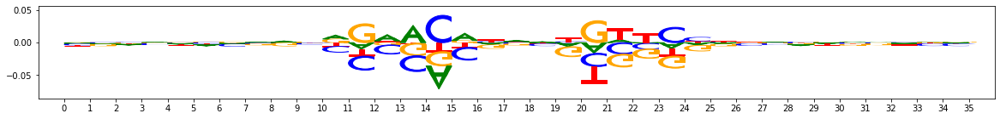

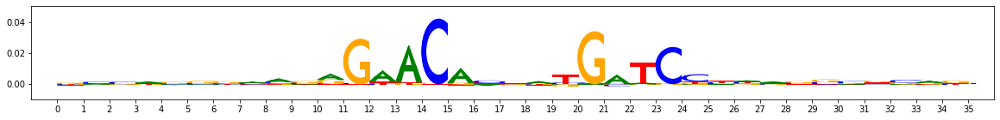

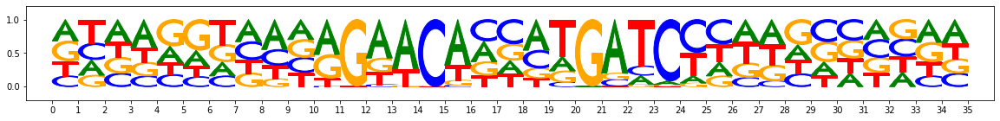

subcluster_5 size 60


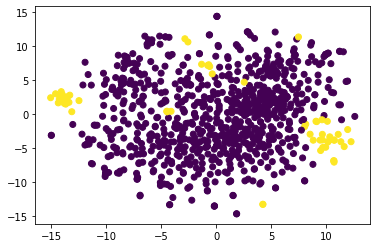

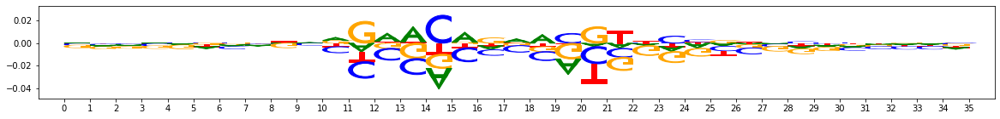

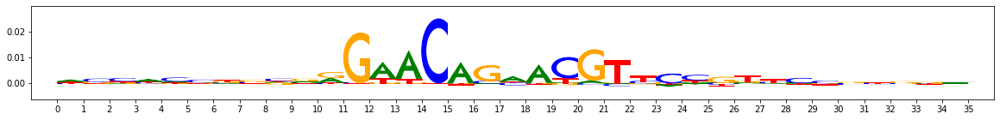

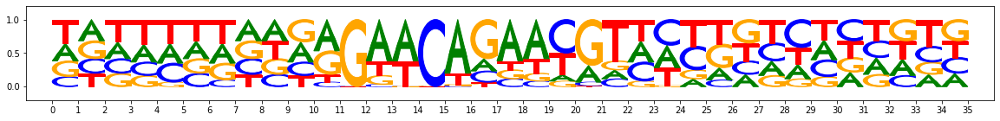

subcluster_6 size 36


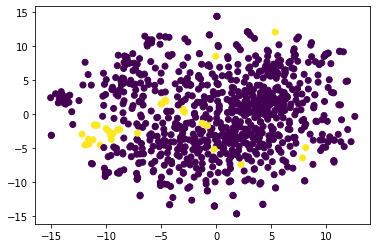

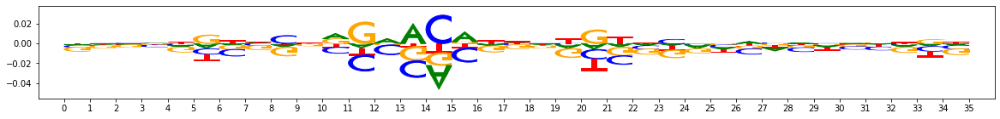

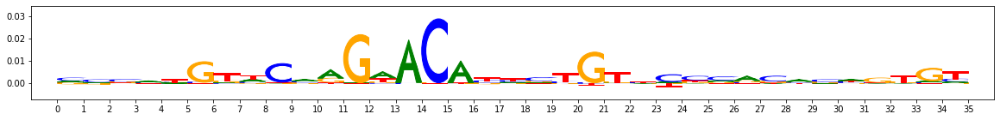

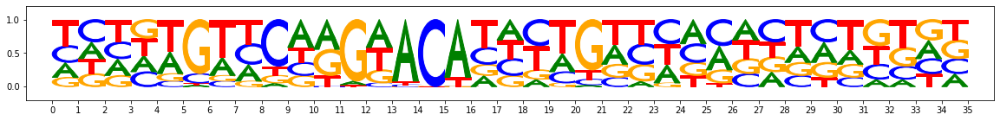

subcluster_7 size 29


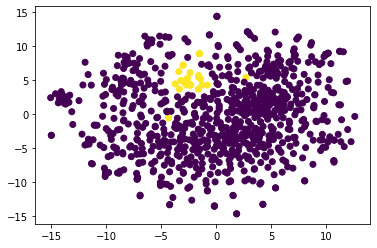

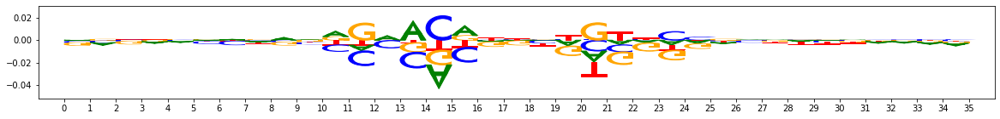

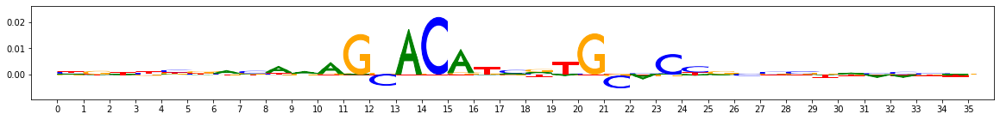

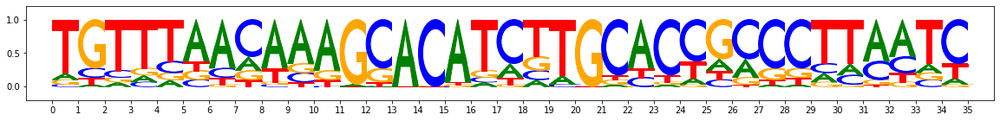

subcluster_8 size 5


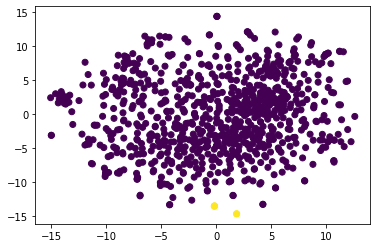

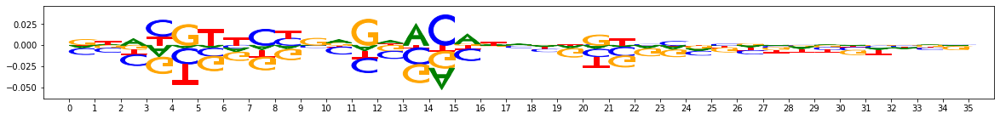

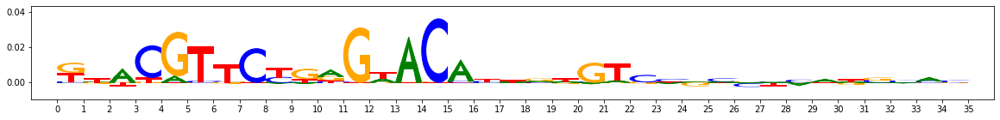

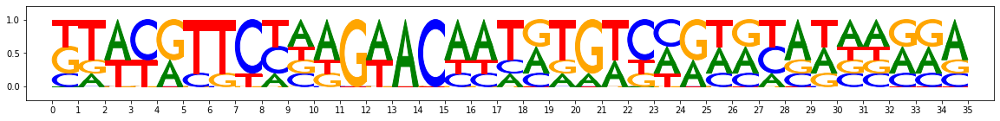

subcluster_9 size 3


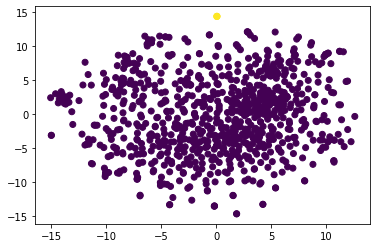

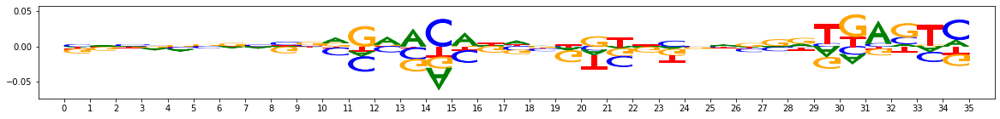

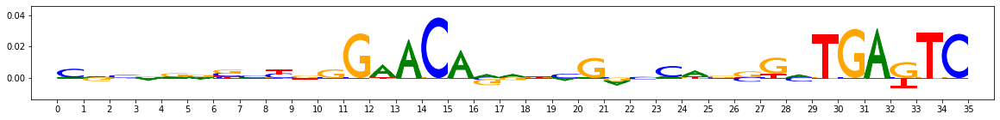

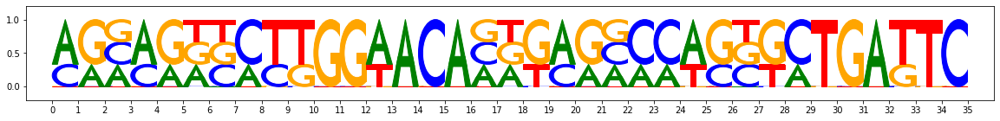

subcluster_10 size 2


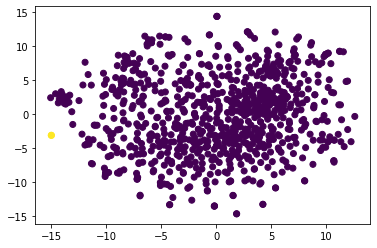

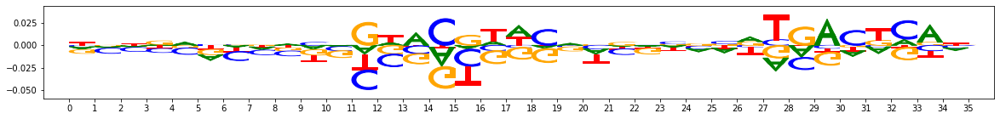

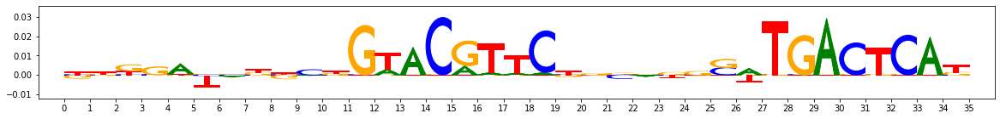

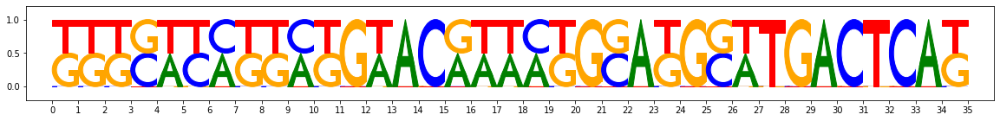

metacluster_2
activity pattern: [0 1]
metacluster_2 pattern_0
total seqlets: 187
Task 0 hypothetical scores:


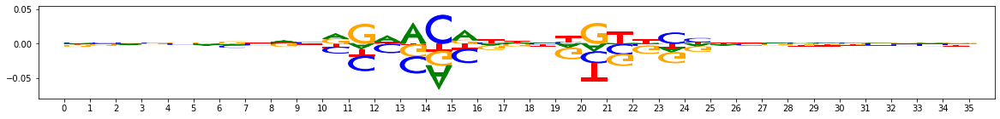

Task 0 actual importance scores:


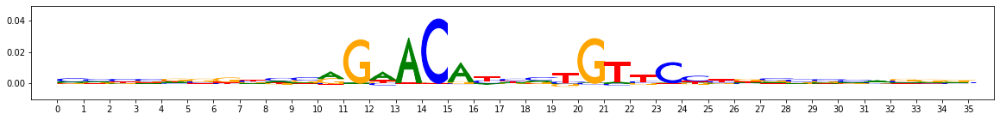

onehot, fwd and rev:


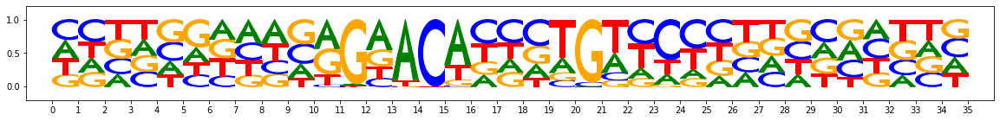

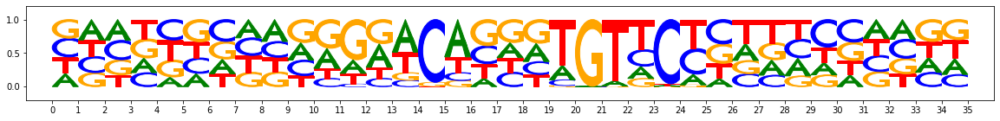

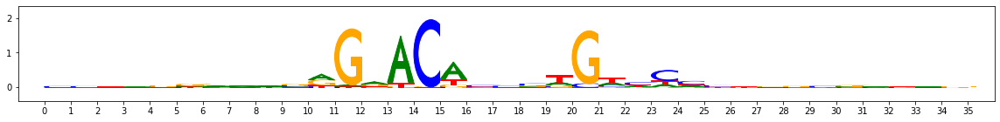

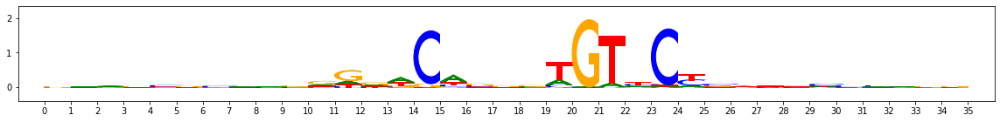

PLOTTING SUBCLUSTERS


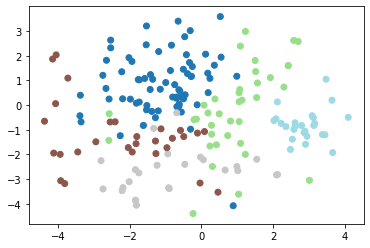

subcluster_0 size 71


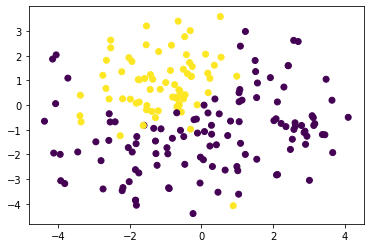

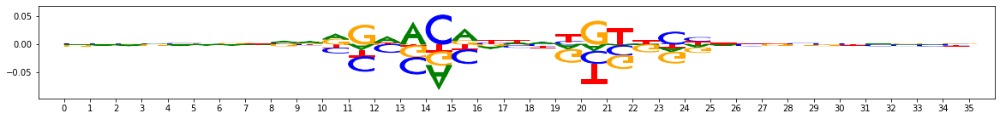

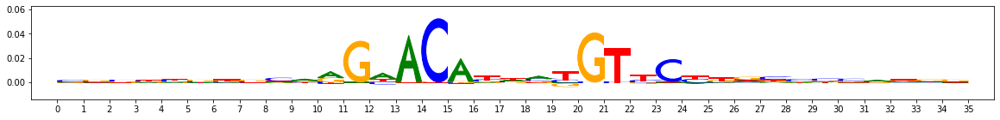

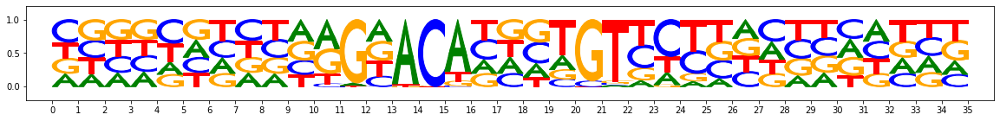

subcluster_1 size 37


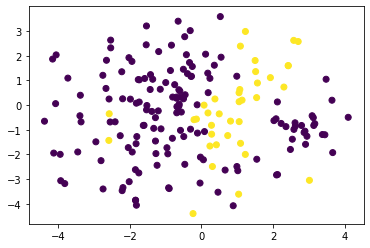

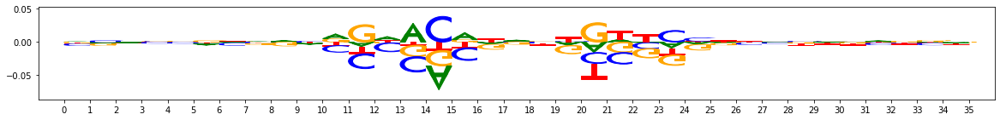

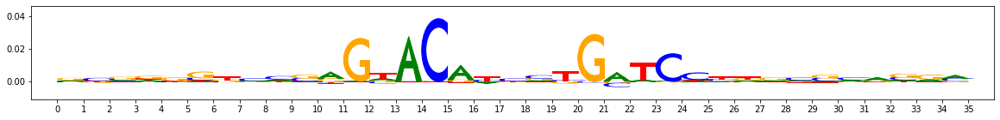

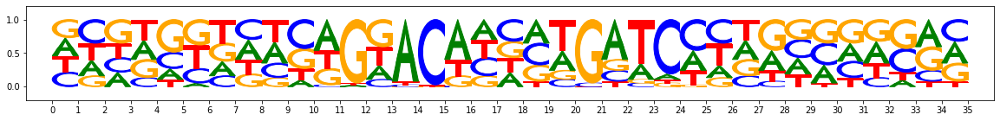

subcluster_2 size 28


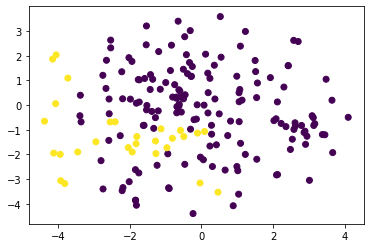

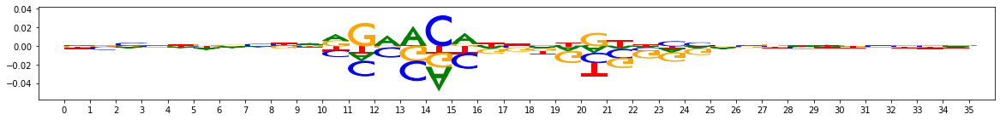

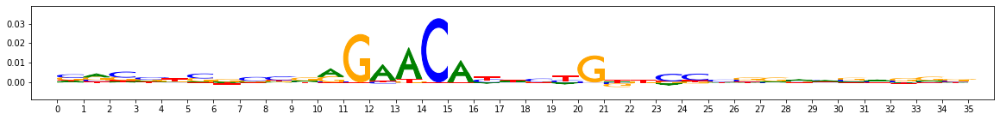

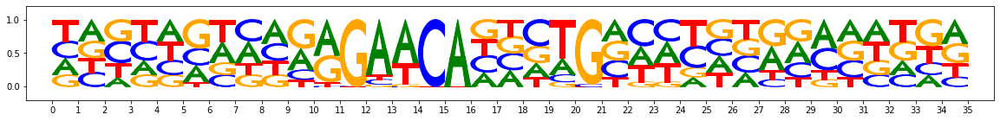

subcluster_3 size 26


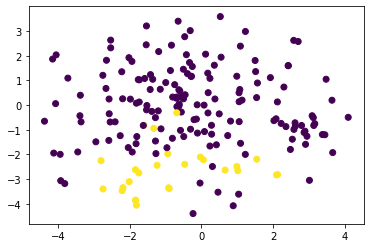

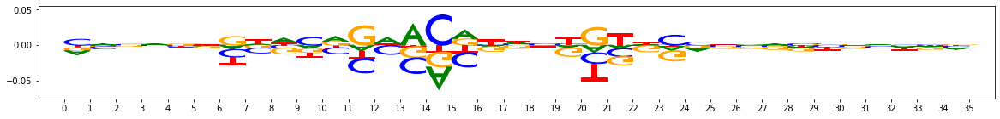

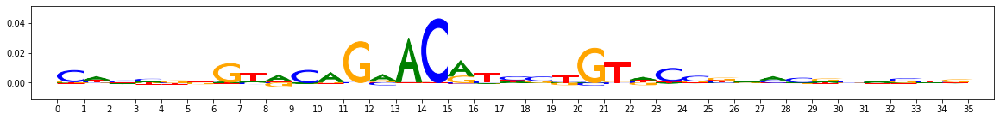

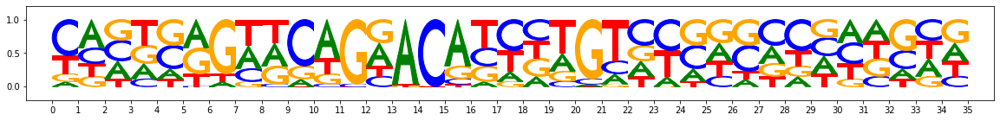

subcluster_4 size 25


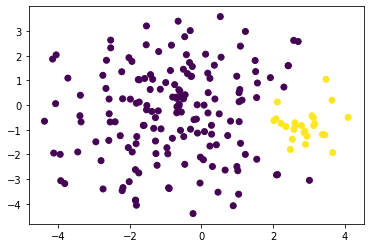

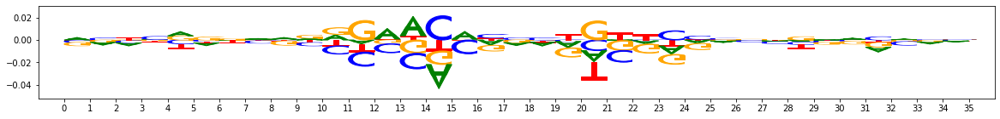

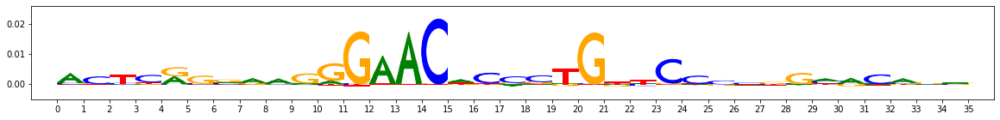

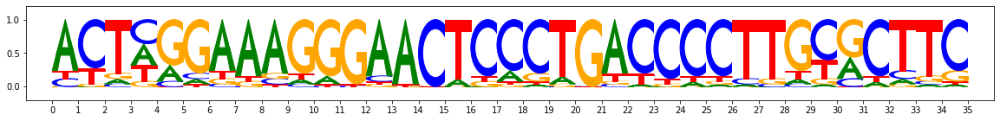

metacluster_2 pattern_1
total seqlets: 112
Task 0 hypothetical scores:


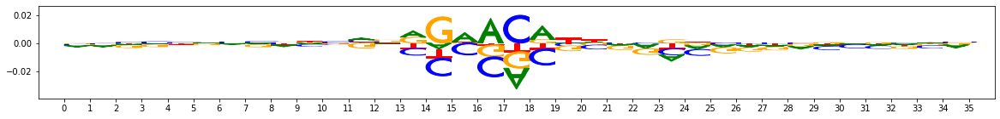

Task 0 actual importance scores:


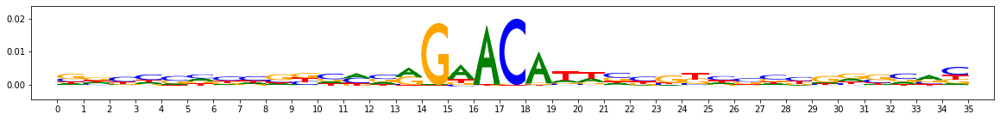

onehot, fwd and rev:


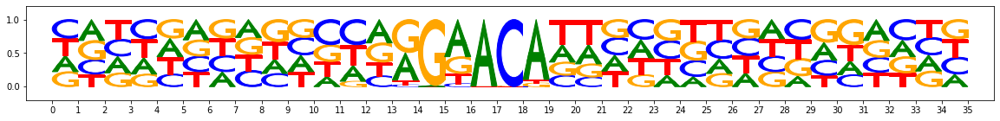

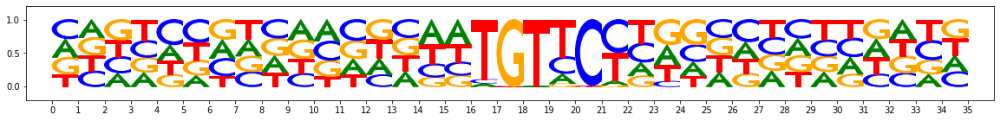

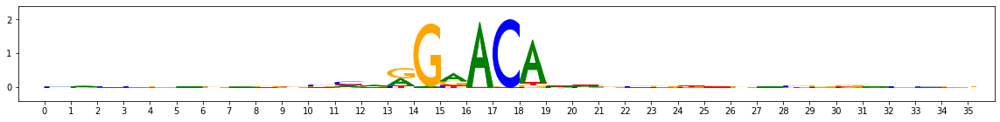

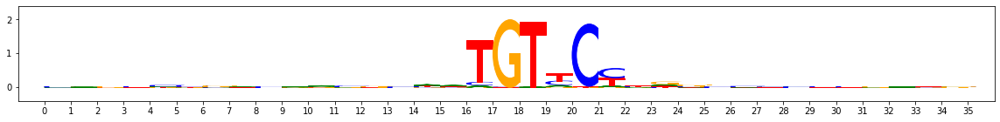

PLOTTING SUBCLUSTERS


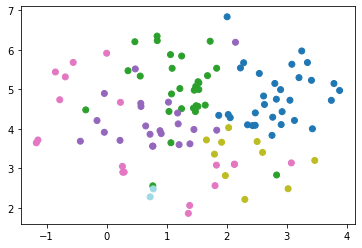

subcluster_0 size 31


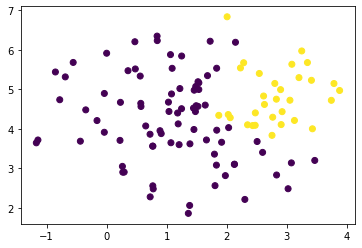

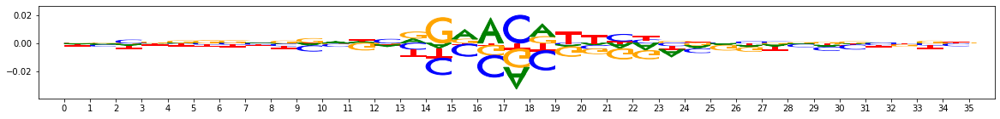

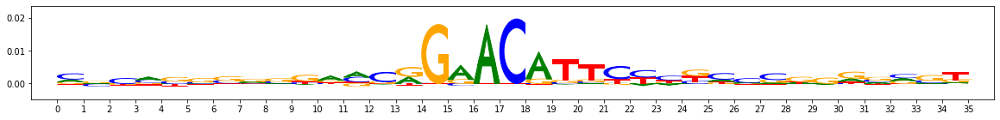

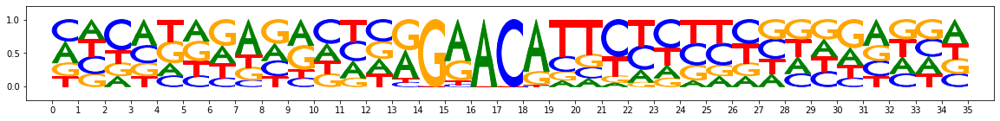

subcluster_1 size 29


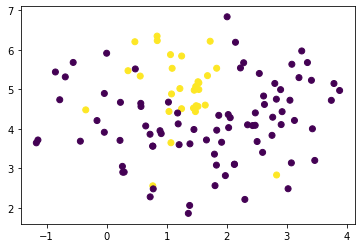

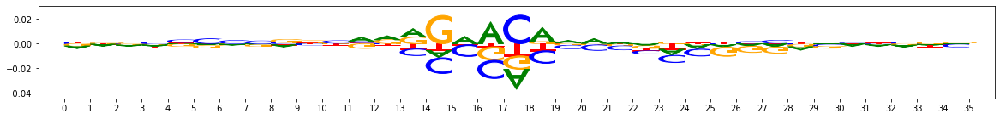

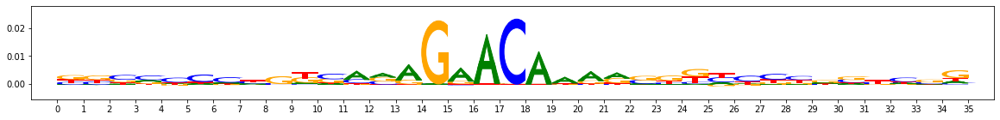

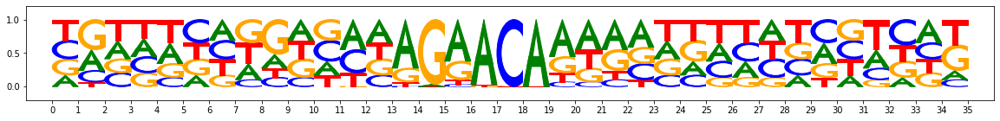

subcluster_2 size 22


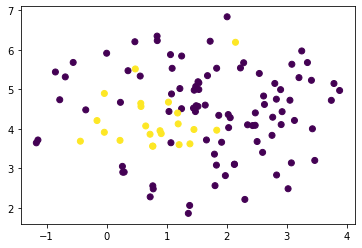

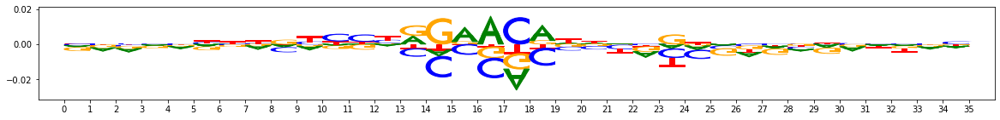

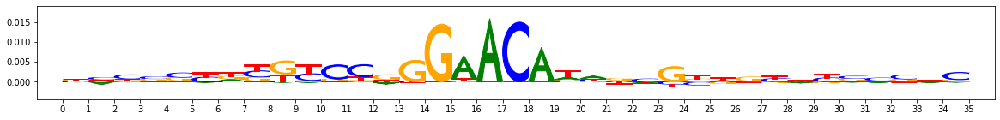

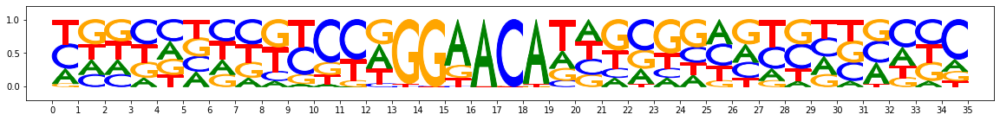

subcluster_3 size 18


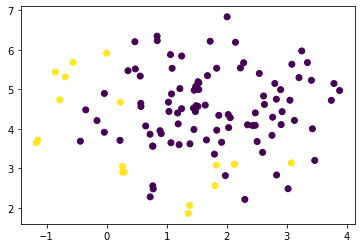

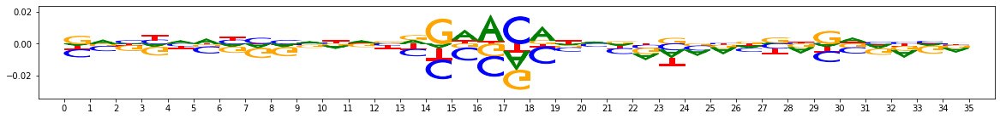

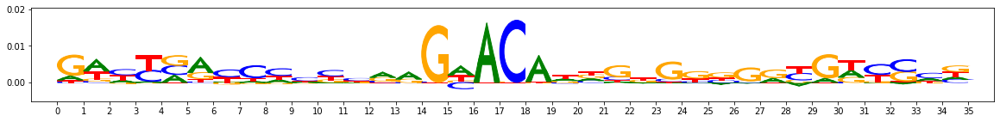

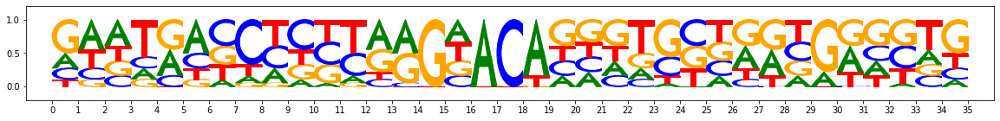

subcluster_4 size 10


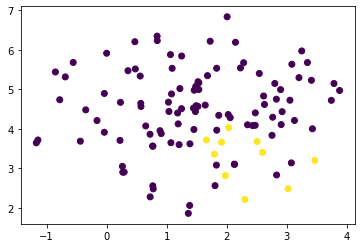

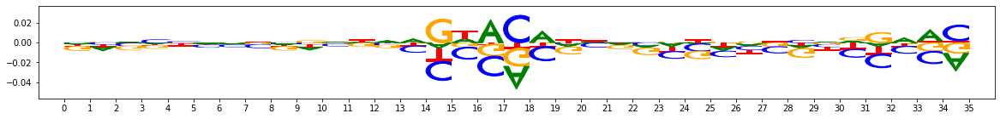

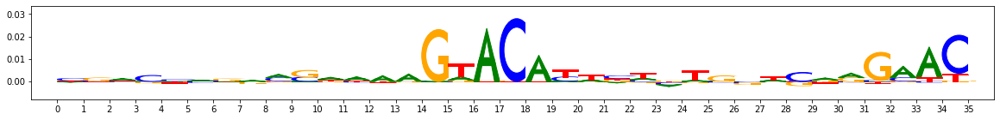

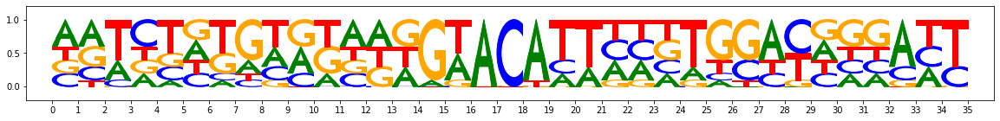

subcluster_5 size 2


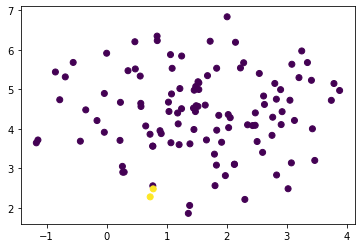

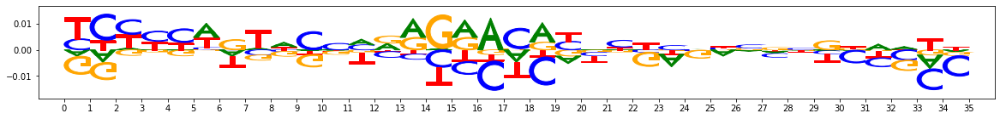

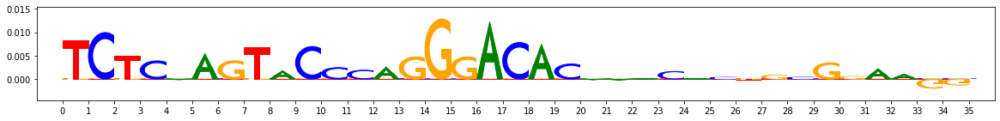

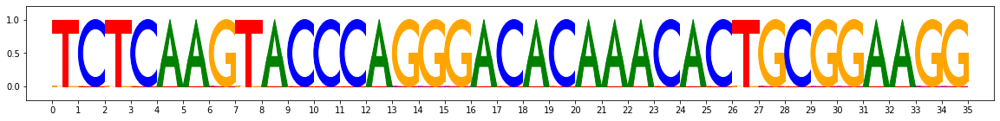

metacluster_3
activity pattern: [-1  0]
metacluster_3 pattern_0
total seqlets: 143
Task 0 hypothetical scores:


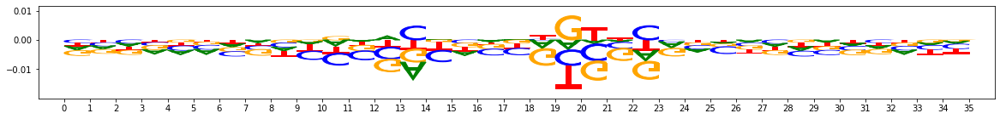

Task 0 actual importance scores:


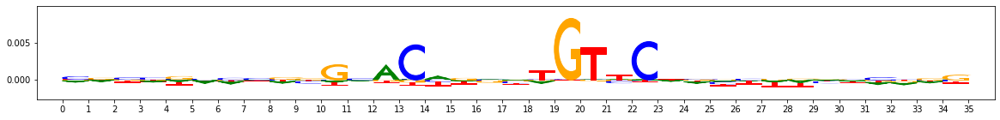

onehot, fwd and rev:


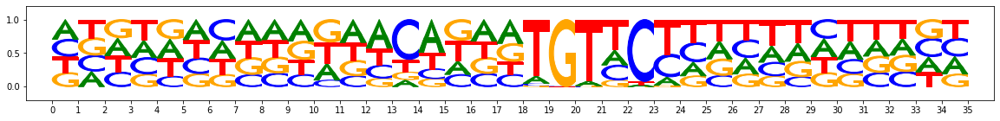

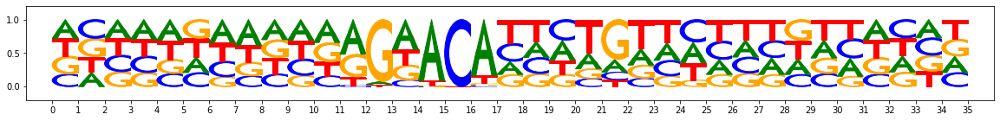

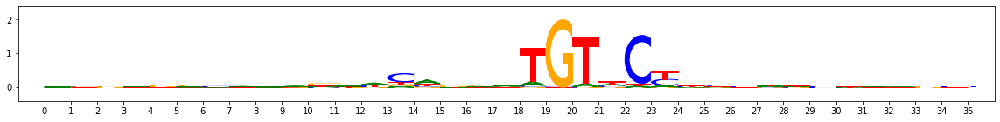

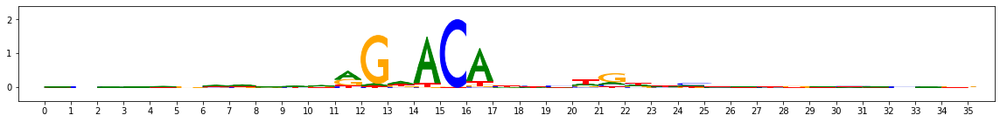

PLOTTING SUBCLUSTERS


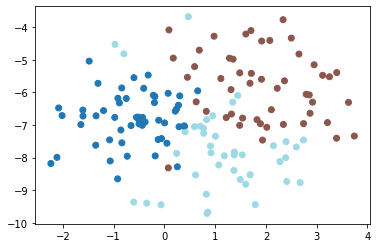

subcluster_0 size 53


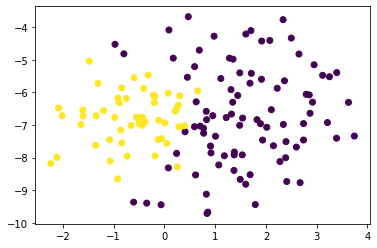

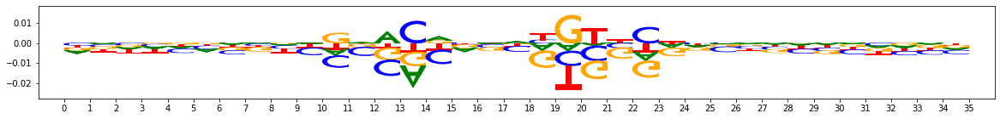

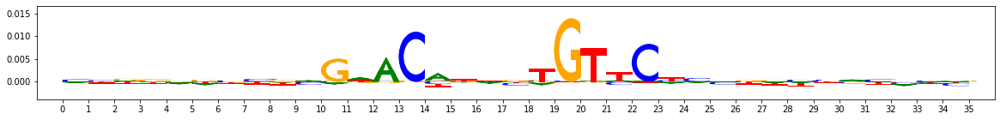

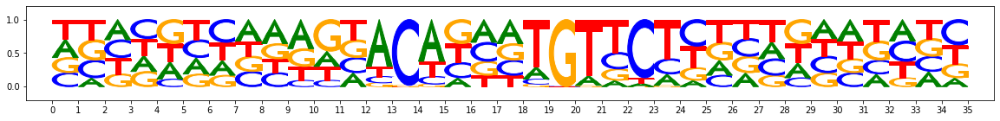

subcluster_1 size 49


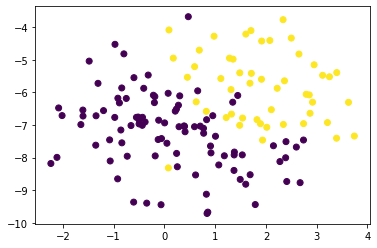

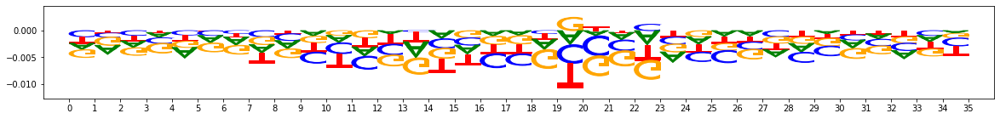

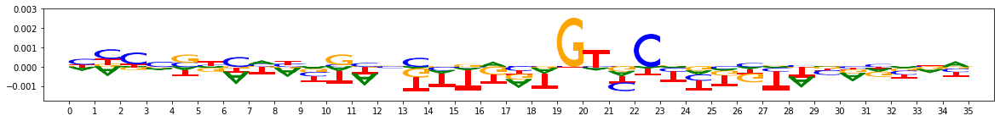

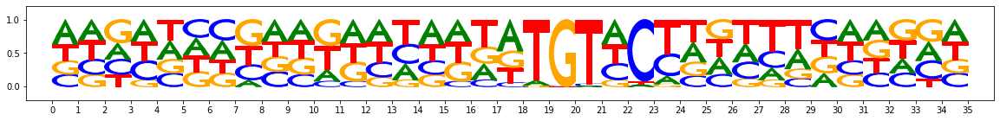

subcluster_2 size 41


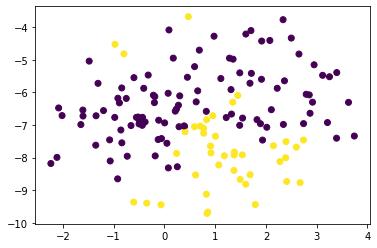

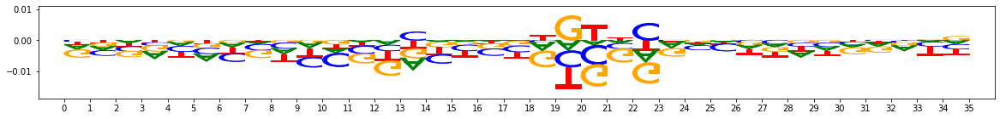

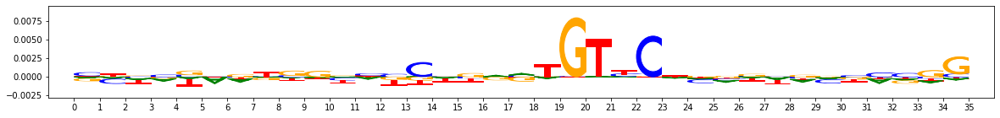

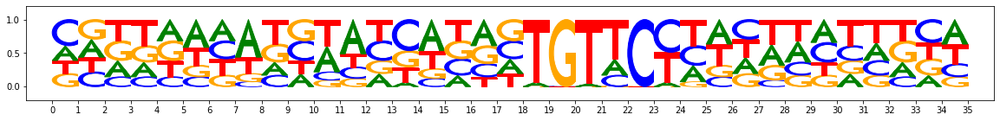

metacluster_4
activity pattern: [1 0]
No motifs found for this activity pattern


In [18]:
fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fname = "WG_Model_DeepSTARR_modisco.h5"
#fname = "WG_Model_DeepSTARR_Dex_modisco.h5"
fpath = os.path.join(fdiry, fname)

hdf5_results = h5py.File(fpath,"r")

print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.mean(onehot_data, axis=(0,1))

for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
        print("Task 0 hypothetical scores:")
        #viz_sequence.plot_weights(pattern["task0_hypothetical_contribs"]["fwd"])
        viz_sequence.plot_weights(pattern["Dex_hypothetical_contribs"]["fwd"])
        print("Task 0 actual importance scores:")
        #viz_sequence.plot_weights(pattern["task0_contrib_scores"]["fwd"])
        viz_sequence.plot_weights(pattern["Dex_contrib_scores"]["fwd"])
        
        #print("Task 1 hypothetical scores:")
        #viz_sequence.plot_weights(pattern["task1_hypothetical_contribs"]["fwd"])
        #print("Task 1 actual importance scores:")
        #viz_sequence.plot_weights(pattern["task1_contrib_scores"]["fwd"])
        #print("Task 2 hypothetical scores:")
        #viz_sequence.plot_weights(pattern["task2_hypothetical_contribs"]["fwd"])
        #print("Task 2 actual importance scores:")
        #viz_sequence.plot_weights(pattern["task2_contrib_scores"]["fwd"])
        print("onehot, fwd and rev:")
        viz_sequence.plot_weights(pattern["sequence"]["fwd"])
        viz_sequence.plot_weights(pattern["sequence"]["rev"])
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                        background=background)) 
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                        background=background)) 
        #Plot the subclustering too, if available
        if ("subclusters" in pattern):
            print("PLOTTING SUBCLUSTERS")
            subclusters = np.array(pattern["subclusters"])
            twod_embedding = np.array(pattern["twod_embedding"])
            plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=subclusters, cmap="tab20")
            plt.show()
            for subcluster_name in list(pattern["subcluster_to_subpattern"]["subcluster_names"]):
                subpattern = pattern["subcluster_to_subpattern"][subcluster_name]
                print(subcluster_name.decode("utf-8"), "size", len(subpattern["seqlets_and_alnmts"]["seqlets"]))
                subcluster = int(subcluster_name.decode("utf-8").split("_")[1])
                plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=(subclusters==subcluster))
                plt.show()
                viz_sequence.plot_weights(subpattern["Dex_hypothetical_contribs"]["fwd"])
                viz_sequence.plot_weights(subpattern["Dex_contrib_scores"]["fwd"])
                viz_sequence.plot_weights(subpattern["sequence"]["fwd"])
        
hdf5_results.close()

In [28]:
### Load Arguments
#fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_data"
#fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fdiry = "/home/mount/work/out/proj_combeffect/peak"
model_name = "Model_DeepSTARR"
seq_name   = "chr17.fa"

TASK1="DMSO"
TASK2="Dex"

args = {
    #"m": "DeepSTARR.model", 
    #"m": "Model_DeepSTARR_tf114", 
    #"s": "Sequences_example.fa",
    #"c": "dev"
    "m": os.path.join(fdiry, "cradle_deepstarr_results", model_name), 
    "s": os.path.join(fdiry, "cradle_deepstarr_data",    seq_name),
    "c": "Dex"
}
model_ID = args["m"] 
sequence_set = args["s"]
class_output = args["c"]

In [29]:
print("\nLoading sequences and model ...\n")
#X_all = prepare_input(sequence_set)
X_all = IOHelper.get_fastas_from_file(sequence_set, uppercase=True)

print(type(X_all))
print(len(X_all))
X_all.head()


Loading sequences and model ...

<class 'pandas.core.frame.DataFrame'>
3601


,location,sequence
0,chr17:409725-410725,ATCCCAGCGATCTAGGAGGCCGAGGCGGGAAGATCGATGGAGCCCA...
1,chr17:409925-410925,CAACTGTCCAGATTCCAACAGACAAAAGCAAGCATGGGCGAACCAC...
2,chr17:494432-495432,GCGGCTCAGCCCCTGGAAGTCAGGAGTGTTTCCATAGTCCTGAGCA...
3,chr17:497086-498086,ACTCCAAAGGCAGGCTCAAAGGTCTCCATGGTACTCCAGGGCCCCT...
4,chr17:502352-503352,TGGTTTTTTTTTTGTTGTTGTTTTTTGAGACAGTCTCACTCTGGCT...


In [30]:
np.random.seed(123)
idx = np.random.choice(X_all.shape[0], size=100)

fasta_sequences = X_all.sequence.to_numpy()[idx]
print(len(fasta_sequences))
print(fasta_sequences[0])

100
TTGTTAATTGAATAGCCTTCACATTTGTTGCTTGTGCAGGATCTAATTGAGTTAAAGATTTGGGTTTATATTGGTGGGAGCCGGGGGAGACCGTTTGAAGGAAAAGATTTAGGGGTAACAAAAGAATAAAAGTTTCCCAAAATGTGATGTATAAAAATTTACAGAATGCTGGTATTTCCCTCAATAAGAGCTTACACAATTTAACAGCCATGAGAGGAAGGGGCCTTAGACTTAACACAACGTGGAGAATGTTCACTTTGGCTTTTCCACAGATTCCTCTCAAAGGTTACCATCGACTTTAAGATTAGTATTAATAGAAGCTGTTTTTGCTGTTGTTTTTGATTTCATGGTGTTTTTGATTGCCTGGGTACGCTAACTTGATTTTTTGACAGATGGTTGGCAATGGCTGATAAATGACACTTTGAGACATCTCCATCTCATCTCAAGTCACTCCCGCCAGCAGATGAAGGTACAGTGAGCATGGGCGTTCCCGGCCGGCGCTGTGGCGGTGTTAGTGTGTTAGTCACGGATGGTGTTTGTGTTGGCGACTGTGCATCATGAGGCTGTCCCTGCAGTAGCCTGATAACTGACAAATGGGGGCATAATTCTATTTGGAATCCCGGATGGTAGCGTCTACACGGTTTATAACCAGAAAATCCAATACAGCCATTGGAATCCGAATGTTTAATTTTTTATTGCTTCTGGCTGTTTTAATTATAGTTACCTTTGAAATACTTTTTCTGCATCAATAGTAACTGTGCTCTGTTGAGTTCCGTGTCCTGTAGGATCTGAGGTTTGGAAACTCCCTTTATGATGCTCCTGTGCAGATGAGAAAACAGCACCCCAGGACCTCTGCTCGCACACATTGACCTGGTCATGTTGTGTGGGTGCCAGTGTGTGTGTGTGTCCCCGGCCACCTGCCCTCCCCTCCCGTCCTGGGGGTTACAGGTGGACTTTGGACTCACAGAGCTGTAACGCTGATCTCATTGCATAGAT

- contrib_scores
- hyp_contrib_scores

In [33]:
import h5py
from collections import OrderedDict
import numpy as np

task_to_scores = OrderedDict()
task_to_hyp_scores = OrderedDict()

#f = h5py.File("scores.h5","r")
fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fname = "chr17_Model_DeepSTARR_Dex_contribution_scores.h5"
fpath = os.path.join(fdiry, fname)
f = h5py.File(fpath, "r")

tasks = f["contrib_scores"].keys()
n = 100
#n = len(fasta_sequences)
#n = 100 #len(fasta_sequences) #100 #since this is just a test run, for speed I am limiting to 100 sequences
#reverse-complement some of the sequences to simulate that
take_rc = (np.random.RandomState(1234).uniform(size=n) > 0.5)
for task in tasks:
    #Note that the sequences can be of variable lengths;
    #in this example they all have the same length (200bp) but that is
    #not necessary.
    task_to_scores[task] = [np.array(x) if not rc else np.array(x)[::-1,::-1]
                            for x,rc in zip(f['contrib_scores'][task][:n], take_rc)]
    task_to_hyp_scores[task] = [np.array(x) if not rc else np.array(x)[::-1,::-1]
                                for x,rc in zip(f['hyp_contrib_scores'][task][:n], take_rc)]

onehot_data = [one_hot_encode_along_channel_axis(seq) if not rc else
               one_hot_encode_along_channel_axis(seq)[::-1,::-1]
               for seq,rc in zip(fasta_sequences[:n], take_rc)]

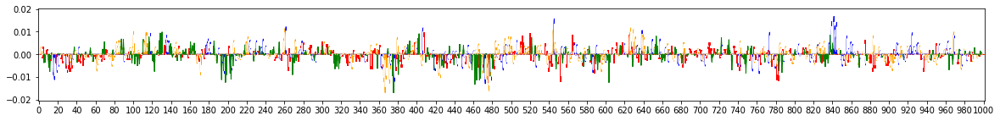

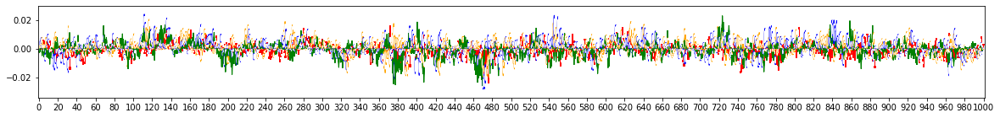

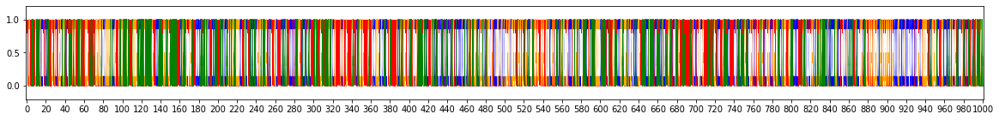

In [35]:
import modisco.visualization
from modisco.visualization import viz_sequence

viz_sequence.plot_weights(task_to_scores['Dex'][0], subticks_frequency=20)
viz_sequence.plot_weights(task_to_hyp_scores['Dex'][0], subticks_frequency=20)
viz_sequence.plot_weights(onehot_data[0], subticks_frequency=20)

MEMORY 0.3685376
On task Dex
Computing windowed sums on original
Generating null dist
peak(mu)= 0.0020402558074065135
Computing threshold
For increasing = True , the minimum IR precision was 0.36886699161173975 occurring at 8.907634764694639e-08 implying a frac_neg of 0.5844520674868906
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.16549702244617498 occurring at -7.841145270026662e-07 implying a frac_neg of 0.19831807302988383
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.11193636123731265  and  0.09018196867356891 with frac passing 0.0002231237322515213
Passing windows frac was 0.0002231237322515213 , which is below  0.03 ; adjusting
Final raw thresholds are -0.052711256816927926  and  0.052711256816927926
Final transformed thresholds are -0.97  and  0.97


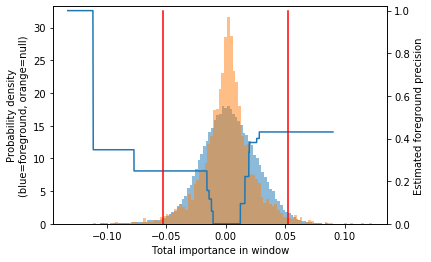

Got 437 coords
After resolving overlaps, got 437 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9699
MEMORY 0.354476032
437 identified in total
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [244, 193]
Idx to activities:  {0: '1', 1: '-1'}
MEMORY 0.354476032
On metacluster 1
Metacluster size 193
Relevant tasks:  ('Dex',)
Relevant signs:  (-1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 193
(Round 1) Computing coarse affmat
MEMORY 0.354476032
Beginning embedding computation
MEMORY 0.354476032
At the beginning of embedding call
MEMORY 0.354476032
before computing embeddings fwd
MEMORY 0.354476032


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.3s
[Parallel(n_jobs=10)]: Done 193 out of 193 | elapsed:   42.9s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


after computing embeddings fwd
MEMORY 0.358158336


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done 193 out of 193 | elapsed:   35.5s finished


after computing embeddings rev
MEMORY 0.359940096
before computing sparse embeddings fwd
MEMORY 0.359940096
Constructing csr matrix...
csr matrix made in 0.10372400283813477 s
after computing sparse embeddings fwd
MEMORY 0.361848832
before computing sparse embeddings rev
MEMORY 0.361848832
Constructing csr matrix...
csr matrix made in 0.03727245330810547 s
after computing sparse embeddings rev
MEMORY 0.363024384
Finished embedding computation in 78.68 s
MEMORY 0.363024384
Starting affinity matrix computations
MEMORY 0.363024384
Batching in slices of size 193


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

Finished affinity matrix computations in 1.19 s
MEMORY 0.363552768
(Round 1) Computed coarse affmat
MEMORY 0.363552768
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 0.363552768
Launching nearest neighbors affmat calculation job
MEMORY 0.363552768


Parallel runs completed
MEMORY 0.374059008
Job completed in: 1.8 s
MEMORY 0.374059008
Launching nearest neighbors affmat calculation job
MEMORY 0.374059008
Parallel runs completed
MEMORY 0.37916672
Job completed in: 1.8 s
MEMORY 0.37916672
(Round 1) Computed affinity matrix on nearest neighbors in 3.69 s
MEMORY 0.37916672
Filtered down to 109 of 193
(Round 1) Retained 109 rows out of 193 after filtering
MEMORY 0.3817472
(Round 1) Computing density adapted affmat
MEMORY 0.3817472
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 0.381751296
Beginning preprocessing + Leiden
Affmat shape: 109


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    3.1s


Quality: 0.04944832620130713
Quality: 0.04958083505340106
Quality: 0.04963117045179317
Quality: 0.04967517992907759
Got 5 clusters after round 1
Counts:
{0: 33, 1: 33, 3: 9, 4: 6, 2: 28}
MEMORY 0.381882368
(Round 1) Aggregating seqlets in each cluster
MEMORY 0.381882368
Aggregating for cluster 0 with 33 seqlets
MEMORY 0.381882368
Trimming eliminated 0 seqlets out of 33
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 33 seqlets
MEMORY 0.381620224
Trimming eliminated 0 seqlets out of 33
Aggregating for cluster 2 with 28 seqlets
MEMORY 0.381620224
Trimming eliminated 0 seqlets out of 28
Aggregating for cluster 3 with 9 seqlets
MEMORY 0.381620224


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    4.3s finished


Skipped 1 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 8
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 4 with 6 seqlets
MEMORY 0.381620224
Trimming eliminated 0 seqlets out of 6
(Round 2) num seqlets: 106
(Round 2) Computing coarse affmat
MEMORY 0.381620224
Beginning embedding computation
MEMORY 0.381620224
At the beginning of embedding call
MEMORY 0.381620224
before computing embeddings fwd
MEMORY 0.381620224


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done 106 out of 106 | elapsed:   19.6s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


after computing embeddings fwd
MEMORY 0.381988864


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.5s


after computing embeddings rev
MEMORY 0.382226432
before computing sparse embeddings fwd
MEMORY 0.382226432
Constructing csr matrix...
csr matrix made in 0.020028352737426758 s
after computing sparse embeddings fwd
MEMORY 0.382226432
before computing sparse embeddings rev
MEMORY 0.382226432
Constructing csr matrix...
csr matrix made in 0.019758939743041992 s
after computing sparse embeddings rev
MEMORY 0.382226432
Finished embedding computation in 39.46 s
MEMORY 0.382226432
Starting affinity matrix computations
MEMORY 0.382226432
Batching in slices of size 106


[Parallel(n_jobs=10)]: Done 106 out of 106 | elapsed:   19.8s finished
100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

Finished affinity matrix computations in 1.12 s
MEMORY 0.382230528
(Round 2) Computed coarse affmat
MEMORY 0.382230528
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 0.382230528
Launching nearest neighbors affmat calculation job
MEMORY 0.382230528


Parallel runs completed
MEMORY 0.38643712
Job completed in: 0.79 s
MEMORY 0.38643712
Launching nearest neighbors affmat calculation job
MEMORY 0.38643712
Parallel runs completed
MEMORY 0.39114752
Job completed in: 0.77 s
MEMORY 0.39114752
(Round 2) Computed affinity matrix on nearest neighbors in 1.63 s
MEMORY 0.39114752
Not applying filtering for rounds above first round
MEMORY 0.39114752
(Round 2) Computing density adapted affmat
MEMORY 0.39114752
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 0.39114752
Beginning preprocessing + Leiden
Affmat shape: 106


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.8s


Quality: 0.05352306257239331
Got 6 clusters after round 2
Counts:
{3: 13, 1: 32, 0: 34, 4: 3, 2: 23, 5: 1}
MEMORY 0.3912704
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.3912704
Aggregating for cluster 0 with 34 seqlets
MEMORY 0.3912704
Trimming eliminated 0 seqlets out of 34
Aggregating for cluster 1 with 32 seqlets
MEMORY 0.3912704
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 31
Aggregating for cluster 2 with 23 seqlets
MEMORY 0.3912704


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    4.2s finished


Trimming eliminated 0 seqlets out of 23
Aggregating for cluster 3 with 13 seqlets
MEMORY 0.3912704
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 12
Aggregating for cluster 4 with 3 seqlets
MEMORY 0.3912704
Trimming eliminated 0 seqlets out of 3
Aggregating for cluster 5 with 1 seqlets
MEMORY 0.3912704
Trimming eliminated 0 seqlets out of 1
Got 6 clusters
Splitting into subclusters...
MEMORY 0.3912704
Inspecting pattern 0 for spurious merging
Inspecting pattern 1 for spurious merging
Inspecting pattern 2 for spurious merging
Inspecting pattern 3 for spurious merging
Inspecting pattern 4 for spurious merging
Inspecting pattern 5 for spurious merging
Merging on 6 clusters
MEMORY 0.3912704
On merging iteration 1
Numbers for each pattern pre-subsample: [34, 31, 23, 12, 3, 1]
Numbers after subsampling: [34, 31, 23, 12, 3, 1]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.368457555770874 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.27325105

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:   33.1s
[Parallel(n_jobs=10)]: Done 244 out of 244 | elapsed:   44.6s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


after computing embeddings fwd
MEMORY 0.391401472


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:   32.9s


after computing embeddings rev
MEMORY 0.39256064
before computing sparse embeddings fwd
MEMORY 0.39256064
Constructing csr matrix...
csr matrix made in 0.04921913146972656 s
after computing sparse embeddings fwd
MEMORY 0.393658368
before computing sparse embeddings rev
MEMORY 0.393658368
Constructing csr matrix...
csr matrix made in 0.04570794105529785 s
after computing sparse embeddings rev
MEMORY 0.396632064
Finished embedding computation in 89.05 s
MEMORY 0.396632064
Starting affinity matrix computations
MEMORY 0.396632064
Batching in slices of size 244


[Parallel(n_jobs=10)]: Done 244 out of 244 | elapsed:   44.3s finished
100%|██████████| 1/1 [00:01<00:00,  1.15s/it]

Finished affinity matrix computations in 1.16 s
MEMORY 0.396681216
(Round 1) Computed coarse affmat
MEMORY 0.388984832
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 0.388984832
Launching nearest neighbors affmat calculation job
MEMORY 0.388984832


Parallel runs completed
MEMORY 0.394665984
Job completed in: 2.71 s
MEMORY 0.394665984
Launching nearest neighbors affmat calculation job
MEMORY 0.394665984
Parallel runs completed
MEMORY 0.392310784
Job completed in: 2.61 s
MEMORY 0.392310784
(Round 1) Computed affinity matrix on nearest neighbors in 5.42 s
MEMORY 0.392572928
Filtered down to 163 of 244
(Round 1) Retained 163 rows out of 244 after filtering
MEMORY 0.392572928
(Round 1) Computing density adapted affmat
MEMORY 0.392572928
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 0.392572928
Beginning preprocessing + Leiden
Affmat shape: 163


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    3.2s


Quality: 0.03840548396281008
Quality: 0.03852448094854711
Got 5 clusters after round 1
Counts:
{1: 64, 0: 69, 2: 28, 3: 1, 4: 1}
MEMORY 0.392572928
(Round 1) Aggregating seqlets in each cluster
MEMORY 0.392572928
Aggregating for cluster 0 with 69 seqlets
MEMORY 0.392572928
Trimming eliminated 0 seqlets out of 69
Aggregating for cluster 1 with 64 seqlets
MEMORY 0.392572928


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    4.7s finished


Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 63
Aggregating for cluster 2 with 28 seqlets
MEMORY 0.392572928
Trimming eliminated 0 seqlets out of 28
Aggregating for cluster 3 with 1 seqlets
MEMORY 0.392572928
Trimming eliminated 0 seqlets out of 1
Aggregating for cluster 4 with 1 seqlets
MEMORY 0.392572928
Trimming eliminated 0 seqlets out of 1
(Round 2) num seqlets: 162
(Round 2) Computing coarse affmat
MEMORY 0.392572928
Beginning embedding computation
MEMORY 0.392572928
At the beginning of embedding call
MEMORY 0.392572928
before computing embeddings fwd
MEMORY 0.392572928


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done 162 out of 162 | elapsed:   29.6s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


after computing embeddings fwd
MEMORY 0.392572928


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    5.7s


after computing embeddings rev
MEMORY 0.392572928
before computing sparse embeddings fwd
MEMORY 0.392572928
Constructing csr matrix...
csr matrix made in 0.03628993034362793 s
after computing sparse embeddings fwd
MEMORY 0.392572928
before computing sparse embeddings rev
MEMORY 0.392572928
Constructing csr matrix...
csr matrix made in 0.029825210571289062 s
after computing sparse embeddings rev
MEMORY 0.392572928
Finished embedding computation in 59.65 s
MEMORY 0.392572928
Starting affinity matrix computations
MEMORY 0.392572928
Batching in slices of size 162


[Parallel(n_jobs=10)]: Done 162 out of 162 | elapsed:   29.9s finished
100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

Finished affinity matrix computations in 1.15 s
MEMORY 0.392572928
(Round 2) Computed coarse affmat
MEMORY 0.392572928
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 0.392572928
Launching nearest neighbors affmat calculation job
MEMORY 0.392572928


Parallel runs completed
MEMORY 0.390565888
Job completed in: 1.42 s
MEMORY 0.390565888
Launching nearest neighbors affmat calculation job
MEMORY 0.390565888
Parallel runs completed
MEMORY 0.388919296
Job completed in: 1.41 s
MEMORY 0.388919296
(Round 2) Computed affinity matrix on nearest neighbors in 2.9 s
MEMORY 0.388919296
Not applying filtering for rounds above first round
MEMORY 0.388919296
(Round 2) Computing density adapted affmat
MEMORY 0.388919296
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 0.38905856
Beginning preprocessing + Leiden
Affmat shape: 162


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    3.1s


Quality: 0.0422986413503303
Quality: 0.04262576080911882
Quality: 0.0426722659814163
Got 5 clusters after round 2
Counts:
{0: 68, 3: 3, 2: 22, 4: 3, 1: 66}
MEMORY 0.38905856
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.38905856
Aggregating for cluster 0 with 68 seqlets
MEMORY 0.38905856
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 67
Aggregating for cluster 1 with 66 seqlets
MEMORY 0.38905856


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    4.6s finished


Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 65
Aggregating for cluster 2 with 22 seqlets
MEMORY 0.38905856
Trimming eliminated 0 seqlets out of 22
Aggregating for cluster 3 with 3 seqlets
MEMORY 0.38905856
Trimming eliminated 0 seqlets out of 3
Aggregating for cluster 4 with 3 seqlets
MEMORY 0.38905856
Trimming eliminated 0 seqlets out of 3
Got 5 clusters
Splitting into subclusters...
MEMORY 0.38905856
Inspecting pattern 0 for spurious merging
[t-SNE] Computed conditional probabilities for sample 67 / 67
[t-SNE] Mean sigma: 0.734196
Beginning preprocessing + Leiden
Affmat shape: 67


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  67 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  67 out of  67 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    3.0s


Quality: 0.09871158525953556
Quality: 0.10035062375774986
Quality: 0.10174104762885826
Quality: 0.10472275320148329
Got subclusters: Counter({0: 23, 1: 19, 2: 14, 3: 11})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    4.2s finished


Numbers for each pattern pre-subsample: [23, 19, 14, 11]
Numbers after subsampling: [23, 19, 14, 11]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.11020946502685547 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.08725094795227051 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.0778191089630127 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.05622506141662598 s
Cluster sizes
[23 19 14 11]
Cross-contamination matrix:
[[1.   0.75 0.74 0.83]
 [0.38 1.   0.69 0.69]
 [0.23 0.47 1.   0.51]
 [0.34 0.52 0.57 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.34 0.39 0.37]
 [0.34 1.   0.66 0.7 ]
 [0.39 0.66 1.   0.59]
 [0.37 0.7  0.59 1.  ]]
Inspecting pattern 1 for spurious merging
[t-SNE] Computed conditional probabilities for sample 65 / 65
[t-SNE] Mean sigma: 0.768623
Beginning preprocessing + Leiden
Affmat shape: 65


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  46 out of  65 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  65 out of  65 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.8s


Quality: 0.08299860819529643
Quality: 0.08355225919481896
Quality: 0.08530912647952964
Got subclusters: Counter({0: 25, 1: 21, 2: 17, 3: 2})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    4.2s finished


Numbers for each pattern pre-subsample: [25, 21, 17, 2]
Numbers after subsampling: [25, 21, 17, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.1379096508026123 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.10545635223388672 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.08620858192443848 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.024743318557739258 s
Cluster sizes
[25 21 17  2]
Cross-contamination matrix:
[[1.   0.69 0.54 1.  ]
 [0.54 1.   0.56 0.83]
 [0.6  0.79 1.   1.  ]
 [0.   0.   0.   1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.61 0.48 0.5 ]
 [0.61 1.   0.55 0.56]
 [0.48 0.55 1.   0.5 ]
 [0.5  0.56 0.5  1.  ]]
Inspecting pattern 2 for spurious merging
Inspecting pattern 3 for spurious merging
Inspecting pattern 4 for spurious merging
Merging on 11 clusters
MEMORY 0.389189632
On merging iteration 1
Numbers for each pattern pre-subsample: [23, 19, 14, 11, 25, 21, 17, 2, 22, 3, 3]
Numbers after subsampling: 

In [36]:
import h5py
import numpy as np
%matplotlib inline
import modisco

#Uncomment to refresh modules for when tweaking code during development:
from importlib import reload
reload(modisco.util)
reload(modisco.pattern_filterer)
reload(modisco.aggregator)
reload(modisco.core)
reload(modisco.seqlet_embedding.advanced_gapped_kmer)
reload(modisco.affinitymat.transformers)
reload(modisco.affinitymat.core)
reload(modisco.affinitymat)
reload(modisco.cluster.core)
reload(modisco.cluster)
reload(modisco.tfmodisco_workflow.seqlets_to_patterns)
reload(modisco.tfmodisco_workflow)
reload(modisco)

null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(num_to_samp=5000)
tfmodisco_results = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
                    #Slight modifications from the default settings
                    sliding_window_size=15,
                    flank_size=5,
                    target_seqlet_fdr=0.15,
                    seqlets_to_patterns_factory=
                     modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
                        #Note: as of version 0.5.6.0, it's possible to use the results of a motif discovery
                        # software like MEME to improve the TF-MoDISco clustering. To use the meme-based
                        # initialization, you would specify the initclusterer_factory as shown in the
                        # commented-out code below:
                        #initclusterer_factory=modisco.clusterinit.memeinit.MemeInitClustererFactory(    
                        #    meme_command="meme", base_outdir="meme_out",            
                        #    max_num_seqlets_to_use=10000, nmotifs=10, n_jobs=1),
                        trim_to_window_size=15,
                        initial_flank_to_add=5,
                        final_flank_to_add=5,
                        final_min_cluster_size=60,
                        #use_pynnd=True can be used for faster nn comp at coarse grained step
                        # (it will use pynndescent), but note that pynndescent may crash
                        #use_pynnd=True, 
                        n_cores=10)
                )(
                 task_names=["Dex"],#, "task1", "task2"],
                 contrib_scores=task_to_scores,
                 hypothetical_contribs=task_to_hyp_scores,
                 one_hot=onehot_data,
                 null_per_pos_scores=null_per_pos_scores)

In [37]:
import h5py
import modisco.util
reload(modisco.util)


fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fname = "chr17_Model_DeepSTARR_Dex_modisco.h5"
fpath = os.path.join(fdiry, fname)
grp = h5py.File(fpath, "w")
tfmodisco_results.save_hdf5(grp)
grp.close()

## Print results directly from hdf5

In [ ]:
from collections import Counter
import numpy as np

from modisco.visualization import viz_sequence
reload(viz_sequence)
from matplotlib import pyplot as plt

import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.aggregator
reload(modisco.aggregator)

fdiry = "/home/mount/work/out/proj_combeffect/peak/cradle_deepstarr_results"
fname = "chr17_Model_DeepSTARR_Dex_modisco.h5"
fpath = os.path.join(fdiry, fname)
hdf5_results = h5py.File(fpath,"r")

Metaclusters heatmap


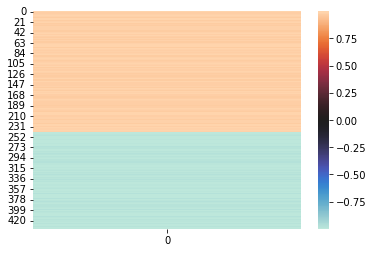

In [40]:
print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.mean(onehot_data, axis=(0,1))

In [41]:
metacluster_names

['metacluster_0', 'metacluster_1']

Metaclusters heatmap


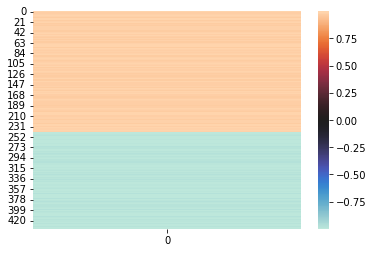

metacluster_0
activity pattern: [1]
No motifs found for this activity pattern
metacluster_1
activity pattern: [-1]
No motifs found for this activity pattern


In [42]:
print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.mean(onehot_data, axis=(0,1))

for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
        print("Task 0 hypothetical scores:")
        viz_sequence.plot_weights(pattern["task0_hypothetical_contribs"]["fwd"])
        print("Task 0 actual importance scores:")
        viz_sequence.plot_weights(pattern["task0_contrib_scores"]["fwd"])
        #print("Task 1 hypothetical scores:")
        #viz_sequence.plot_weights(pattern["task1_hypothetical_contribs"]["fwd"])
        #print("Task 1 actual importance scores:")
        #viz_sequence.plot_weights(pattern["task1_contrib_scores"]["fwd"])
        #print("Task 2 hypothetical scores:")
        #viz_sequence.plot_weights(pattern["task2_hypothetical_contribs"]["fwd"])
        #print("Task 2 actual importance scores:")
        #viz_sequence.plot_weights(pattern["task2_contrib_scores"]["fwd"])
        print("onehot, fwd and rev:")
        viz_sequence.plot_weights(pattern["sequence"]["fwd"])
        viz_sequence.plot_weights(pattern["sequence"]["rev"])
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                        background=background)) 
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                        background=background)) 
        #Plot the subclustering too, if available
        if ("subclusters" in pattern):
            print("PLOTTING SUBCLUSTERS")
            subclusters = np.array(pattern["subclusters"])
            twod_embedding = np.array(pattern["twod_embedding"])
            plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=subclusters, cmap="tab20")
            plt.show()
            for subcluster_name in list(pattern["subcluster_to_subpattern"]["subcluster_names"]):
                subpattern = pattern["subcluster_to_subpattern"][subcluster_name]
                print(subcluster_name.decode("utf-8"), "size", len(subpattern["seqlets_and_alnmts"]["seqlets"]))
                subcluster = int(subcluster_name.decode("utf-8").split("_")[1])
                plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=(subclusters==subcluster))
                plt.show()
                viz_sequence.plot_weights(subpattern["task0_hypothetical_contribs"]["fwd"])
                viz_sequence.plot_weights(subpattern["task0_contrib_scores"]["fwd"])
                viz_sequence.plot_weights(subpattern["sequence"]["fwd"])
        
hdf5_results.close()